# Lingting Shi Azizi/McFaline-Figueroa lab
all cells from both cripsri and crispra

In [1]:
import os
import tempfile

import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import scanpy as sc
import scvi
import seaborn as sns
from scvi.external import MRVI
import anndata
import decipher as dc
dc.pl.activate_journal_quality()
import matplotlib as mpl
mpl.rcParams.update({'font.size': 10, 'svg.fonttype': 'none'})
mpl.rcParams['axes.titlesize'] = 10
mpl.rcParams['xtick.labelsize'] = 8  # Colorbar tick label size
mpl.rcParams['ytick.labelsize'] = 8  # Colorbar tick label size

In [2]:
colors = {'Untreated' : '#023047','1to0.25':'#219EBC','1to0.5':'#FFD166','1to1' :'#FF7F11'}

color_palette = colors
crispr_colors = {'crispri' : '#30C5D2','crispra':'#42047e'}
save_dir = "/home/user/Documents/Kinase_project/figures/decipher_analysis/"
# create a folder just for the figures

figures_dir = os.path.join(save_dir, "crispria")
os.makedirs(figures_dir, exist_ok=True)

# Run decipher

In [3]:
pert_type = "crispri"
adata_path = os.path.join(f'/home/user/Documents/Kinase_project/{pert_type}_final/gbm_{pert_type}_crop_tcdg.h5ad')

adata_i = sc.read(adata_path)

In [4]:
adata_i

AnnData object with n_obs × n_vars = 125225 × 1669
    obs: 'P7', 'P5', 'sample', 'n.umi', 'log10.umi', 'percent_mito', 'cell_ID', 'RT', 'Lig', 'new_cell', 'oligo', 'total_reads.x', 'total_hash_umis_per_cell_ID', 'top_to_second_best_ratio', 'treatment', 'sgRNA', 'total_reads.y', 'sgRNA_proportion', 'total_sgrna_read_per_cell', 'rank', 'top_to_second', 'second_to_third', 'third_to_next', 'top_proportion', 'second_proportion', 'third_proportion', 'top_sg', 'second_sg', 'third_sg', 'gene', 'second_sg_gene', 'third_sg_gene', 'cell', 'RT_lig', 'num_genes_expressed', 'Size_Factor', 'gene_id', 'replicate', 'g1s_score', 'g2m_score', 'proliferation_index', 'dose', 'UMAP1', 'UMAP2', 'PCA_Cluster'
    var: 'features'

In [5]:
pert_type = "crispra"
adata_path = os.path.join(f'/home/user/Documents/Kinase_project/{pert_type}_final/gbm_{pert_type}_crop_tcdg.h5ad')

adata_a = sc.read(adata_path)


In [6]:
adata_a

AnnData object with n_obs × n_vars = 258817 × 3958
    obs: 'P7', 'P5', 'sample', 'n.umi', 'log10.umi', 'percent_mito', 'cell_ID', 'RT', 'Lig', 'new_cell', 'oligo', 'total_reads.x', 'total_hash_umis_per_cell_ID', 'top_to_second_best_ratio', 'treatment', 'sgRNA', 'total_reads.y', 'sgRNA_proportion', 'total_sgrna_read_per_cell', 'rank', 'top_to_second', 'second_to_third', 'third_to_next', 'top_proportion', 'second_proportion', 'third_proportion', 'top_sg', 'second_sg', 'third_sg', 'gene', 'second_sg_gene', 'third_sg_gene', 'cell', 'RT_lig', 'num_genes_expressed', 'Size_Factor', 'gene_id', 'oligo_cleaned', 'replicate', 'g1s_score', 'g2m_score', 'proliferation_index', 'dose', 'UMAP1', 'UMAP2', 'PCA_Cluster'
    var: 'features'

In [7]:
adata_i.obs['perturbation'] = 'crispri'

In [8]:
adata_a

AnnData object with n_obs × n_vars = 258817 × 3958
    obs: 'P7', 'P5', 'sample', 'n.umi', 'log10.umi', 'percent_mito', 'cell_ID', 'RT', 'Lig', 'new_cell', 'oligo', 'total_reads.x', 'total_hash_umis_per_cell_ID', 'top_to_second_best_ratio', 'treatment', 'sgRNA', 'total_reads.y', 'sgRNA_proportion', 'total_sgrna_read_per_cell', 'rank', 'top_to_second', 'second_to_third', 'third_to_next', 'top_proportion', 'second_proportion', 'third_proportion', 'top_sg', 'second_sg', 'third_sg', 'gene', 'second_sg_gene', 'third_sg_gene', 'cell', 'RT_lig', 'num_genes_expressed', 'Size_Factor', 'gene_id', 'oligo_cleaned', 'replicate', 'g1s_score', 'g2m_score', 'proliferation_index', 'dose', 'UMAP1', 'UMAP2', 'PCA_Cluster'
    var: 'features'

In [9]:
adata_a.obs['perturbation'] = 'crispra'

In [10]:
adata_a.obs['dose']

01A_A01_RT_BC_100_Lig_BC_103    0.00
01A_A01_RT_BC_100_Lig_BC_113    1.00
01A_A01_RT_BC_100_Lig_BC_138    0.00
01A_A01_RT_BC_100_Lig_BC_140    0.25
01A_A01_RT_BC_100_Lig_BC_143    0.25
                                ... 
12A_H12_RT_BC_99_Lig_BC_91      0.00
12A_H12_RT_BC_99_Lig_BC_92      1.00
12A_H12_RT_BC_99_Lig_BC_94      0.00
12A_H12_RT_BC_99_Lig_BC_95      0.00
12A_H12_RT_BC_99_Lig_BC_98      0.50
Name: dose, Length: 258817, dtype: float64

In [11]:
adata_a.obs.dose

01A_A01_RT_BC_100_Lig_BC_103    0.00
01A_A01_RT_BC_100_Lig_BC_113    1.00
01A_A01_RT_BC_100_Lig_BC_138    0.00
01A_A01_RT_BC_100_Lig_BC_140    0.25
01A_A01_RT_BC_100_Lig_BC_143    0.25
                                ... 
12A_H12_RT_BC_99_Lig_BC_91      0.00
12A_H12_RT_BC_99_Lig_BC_92      1.00
12A_H12_RT_BC_99_Lig_BC_94      0.00
12A_H12_RT_BC_99_Lig_BC_95      0.00
12A_H12_RT_BC_99_Lig_BC_98      0.50
Name: dose, Length: 258817, dtype: float64

In [12]:
import pandas as pd


# Mapping dictionary
mapping = {1.00: '1to1', 0.50: '1to0.5', 0.25: '1to0.25', 0.00: 'Untreated'}

# Replace numeric values with strings
adata_a.obs['treatment'] = adata_a.obs['dose'].replace(mapping)

adata_i.obs['treatment'] = adata_i.obs['dose'].replace(mapping)

print(adata_i.obs['treatment'])


01D_A01_RT_BC_100_Lig_BC_107      1to0.25
01D_A01_RT_BC_100_Lig_BC_115      1to0.25
01D_A01_RT_BC_100_Lig_BC_116      1to0.25
01D_A01_RT_BC_100_Lig_BC_122       1to0.5
01D_A01_RT_BC_100_Lig_BC_127    Untreated
                                  ...    
12D_H12_RT_BC_99_Lig_BC_74      Untreated
12D_H12_RT_BC_99_Lig_BC_75           1to1
12D_H12_RT_BC_99_Lig_BC_80           1to1
12D_H12_RT_BC_99_Lig_BC_85      Untreated
12D_H12_RT_BC_99_Lig_BC_86        1to0.25
Name: treatment, Length: 125225, dtype: object


In [13]:
print(adata_a.obs['treatment'])

01A_A01_RT_BC_100_Lig_BC_103    Untreated
01A_A01_RT_BC_100_Lig_BC_113         1to1
01A_A01_RT_BC_100_Lig_BC_138    Untreated
01A_A01_RT_BC_100_Lig_BC_140      1to0.25
01A_A01_RT_BC_100_Lig_BC_143      1to0.25
                                  ...    
12A_H12_RT_BC_99_Lig_BC_91      Untreated
12A_H12_RT_BC_99_Lig_BC_92           1to1
12A_H12_RT_BC_99_Lig_BC_94      Untreated
12A_H12_RT_BC_99_Lig_BC_95      Untreated
12A_H12_RT_BC_99_Lig_BC_98         1to0.5
Name: treatment, Length: 258817, dtype: object


In [14]:
# First, let's find the shared genes between both datasets
shared_genes = list(set(adata_i.var_names).intersection(set(adata_a.var_names)))

In [15]:
len(shared_genes)

1231

In [16]:
# Subset both AnnData objects to only include shared genes
adata_i_shared = adata_i[:, shared_genes]
adata_a_shared = adata_a[:, shared_genes]

# Now concatenate the subsetted objects
adata_concat = anndata.concat([adata_i_shared, adata_a_shared], axis=0)

In [17]:
adata_concat = adata_concat[(adata_concat.obs['total_hash_umis_per_cell_ID']>3) & (adata_concat.obs['top_to_second_best_ratio']>2)].copy()

In [18]:
adata_concat.obs['treatment_perturbation'] = adata_concat.obs['treatment'].astype(str)+'_'+adata_concat.obs['perturbation']

In [19]:
adata_concat.obs['treatment']

01D_A01_RT_BC_100_Lig_BC_107      1to0.25
01D_A01_RT_BC_100_Lig_BC_122       1to0.5
01D_A01_RT_BC_100_Lig_BC_127    Untreated
01D_A01_RT_BC_100_Lig_BC_160       1to0.5
01D_A01_RT_BC_100_Lig_BC_3      Untreated
                                  ...    
12A_H12_RT_BC_99_Lig_BC_85         1to0.5
12A_H12_RT_BC_99_Lig_BC_91      Untreated
12A_H12_RT_BC_99_Lig_BC_92           1to1
12A_H12_RT_BC_99_Lig_BC_95      Untreated
12A_H12_RT_BC_99_Lig_BC_98         1to0.5
Name: treatment, Length: 231239, dtype: object

In [20]:
# Downsample NTC to the sample
adata_concat.obs['treatment_perturbation'].unique()

array(['1to0.25_crispri', '1to0.5_crispri', 'Untreated_crispri',
       '1to1_crispri', '1to1_crispra', '1to0.25_crispra',
       'Untreated_crispra', '1to0.5_crispra'], dtype=object)

In [22]:
adata_concat

AnnData object with n_obs × n_vars = 231239 × 1231
    obs: 'P7', 'P5', 'sample', 'n.umi', 'log10.umi', 'percent_mito', 'cell_ID', 'RT', 'Lig', 'new_cell', 'oligo', 'total_reads.x', 'total_hash_umis_per_cell_ID', 'top_to_second_best_ratio', 'treatment', 'sgRNA', 'total_reads.y', 'sgRNA_proportion', 'total_sgrna_read_per_cell', 'rank', 'top_to_second', 'second_to_third', 'third_to_next', 'top_proportion', 'second_proportion', 'third_proportion', 'top_sg', 'second_sg', 'third_sg', 'gene', 'second_sg_gene', 'third_sg_gene', 'cell', 'RT_lig', 'num_genes_expressed', 'Size_Factor', 'gene_id', 'replicate', 'g1s_score', 'g2m_score', 'proliferation_index', 'dose', 'UMAP1', 'UMAP2', 'PCA_Cluster', 'perturbation', 'treatment_perturbation'

Epoch 38 (batch 203/203) | | train elbo: 1057.07 (last epoch: 1057.53) | val ll: 1069.50:   4%|▍         | 38/1000 [04:03<1:42:45,  6.41s/it]2026-02-13 18:42:10,799 | INFO : Early stopping has been triggered.
2026-02-13 18:42:11,594 | INFO : Added `.obsm['decipher_v']`: the Decipher v space.
2026-02-13 18:42:11,595 | INFO : Added `.obsm['decipher_z']`: the Decipher z space.
2026-02-13 18:42:11,596 | INFO : Saving decipher model with run_id 2026-02-13-18-42-11-acidic-teal-predicate.


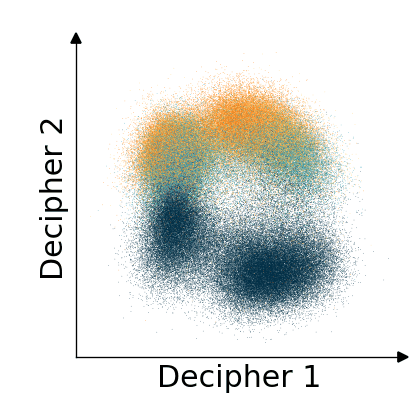

... storing 'new_cell' as categorical
... storing 'treatment' as categorical
... storing 'perturbation' as categorical
... storing 'treatment_perturbation' as categorical


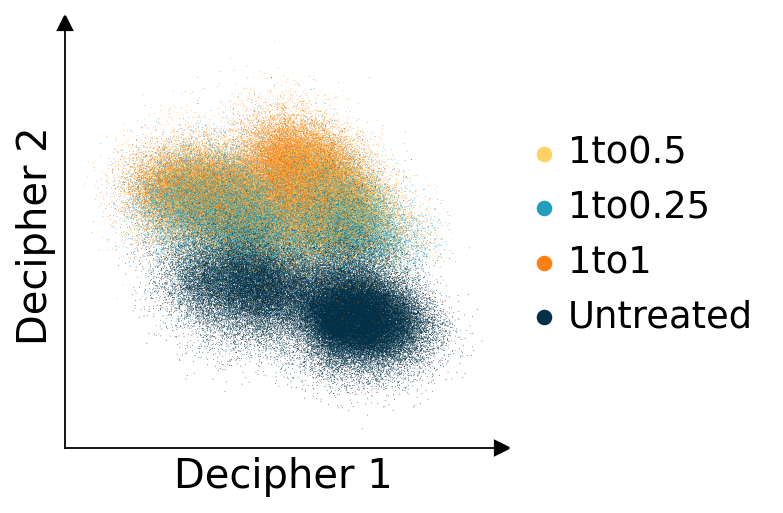

In [ ]:
   
decipher_config = dc.tl.DecipherConfig(seed=20, batch_size=1024)  # optional Decipher config

d3, val3 = dc.tl.decipher_train(
    adata_concat, decipher_config, plot_kwargs={"color": "treatment", "palette": color_palette}, plot_every_k_epochs=1, device= "cuda"
)

2026-02-13 18:42:17,431 | INFO : Added `.obsm['decipher_v']`: the Decipher v space.
2026-02-13 18:42:17,432 | INFO : Added `.obsm['decipher_z']`: the Decipher z space.
... storing 'new_cell' as categorical
... storing 'treatment' as categorical
... storing 'perturbation' as categorical
... storing 'treatment_perturbation' as categorical


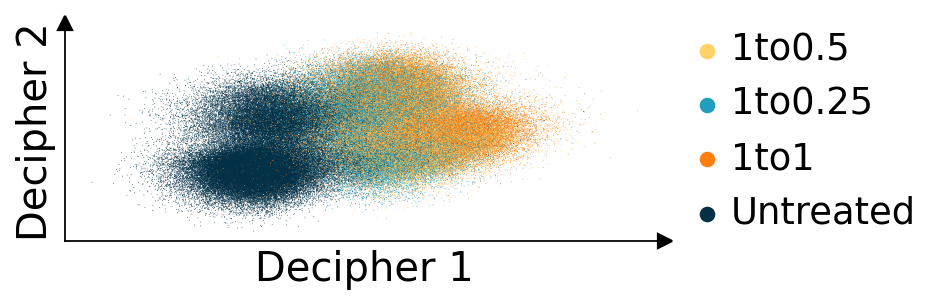

In [24]:
dc.tl.decipher_rotate_space(
    adata_concat,
        v1_col="treatment",
        v1_order=["Untreated", "1to1"],
        v2_col="perturbation",
        v2_order=["crispra", "crispri"],
    )
dc.pl.decipher(adata_concat, ["treatment"], palette=color_palette, figsize=(6, 2))
plt.tight_layout() 

... storing 'new_cell' as categorical
... storing 'treatment' as categorical
... storing 'perturbation' as categorical
... storing 'treatment_perturbation' as categorical
2026-02-13 18:42:26,219 | INFO : maxp pruned
2026-02-13 18:42:26,223 | INFO : cmap pruned
2026-02-13 18:42:26,224 | INFO : kern dropped
2026-02-13 18:42:26,224 | INFO : post pruned
2026-02-13 18:42:26,224 | INFO : FFTM dropped
2026-02-13 18:42:26,225 | INFO : GPOS pruned
2026-02-13 18:42:26,226 | INFO : GSUB pruned
2026-02-13 18:42:26,228 | INFO : glyf pruned
2026-02-13 18:42:26,228 | INFO : Added gid0 to subset
2026-02-13 18:42:26,228 | INFO : Added first four glyphs to subset
2026-02-13 18:42:26,229 | INFO : Closing glyph list over 'GSUB': 22 glyphs before
2026-02-13 18:42:26,229 | INFO : Glyph names: ['.notdef', '.null', 'D', 'U', 'a', 'c', 'd', 'e', 'five', 'h', 'i', 'n', 'nonmarkingreturn', 'o', 'one', 'p', 'period', 'r', 'space', 't', 'two', 'zero']
2026-02-13 18:42:26,229 | INFO : Glyph IDs:   [0, 1, 2, 3, 17, 

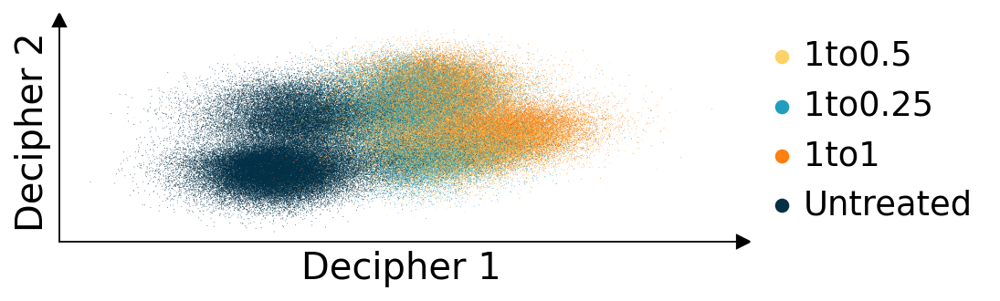

In [25]:

fig = dc.pl.decipher(adata_concat, ["treatment"], palette=color_palette)
fig.set_size_inches(6, 2)
plt.savefig(f'{figures_dir}/crispra_trajectory_treatment_color.png', dpi=300, bbox_inches='tight')
plt.savefig(f'{figures_dir}/crispra_trajectory_treatment_color.pdf', dpi=300, bbox_inches='tight')
plt.savefig(f'{figures_dir}/crispra_trajectory_treatment_color.svg', dpi=300, bbox_inches='tight')

In [26]:
adata_concat.obs

,P7,P5,sample,n.umi,log10.umi,percent_mito,cell_ID,RT,Lig,new_cell,...,g1s_score,g2m_score,proliferation_index,dose,UMAP1,UMAP2,PCA_Cluster,perturbation,treatment_perturbation,decipher_split
01D_A01_RT_BC_100_Lig_BC_107,01D,A01,CRISPRI_GBM_Tcells,1113.0,3.046495,0.0,01D_A01_RT_BC_100_Lig_BC_107,RT_BC_100,Lig_BC_107,A01_RT_BC_100_Lig_BC_107,...,1.293869,3.706303,3.769305,0.25,1.798775,-0.031063,9,crispri,1to0.25_crispri,train
01D_A01_RT_BC_100_Lig_BC_122,01D,A01,CRISPRI_GBM_Tcells,2347.0,3.370513,0.0,01D_A01_RT_BC_100_Lig_BC_122,RT_BC_100,Lig_BC_122,A01_RT_BC_100_Lig_BC_122,...,2.143733,4.174625,4.284230,0.50,-0.385891,0.481959,4,crispri,1to0.5_crispri,train
01D_A01_RT_BC_100_Lig_BC_127,01D,A01,CRISPRI_GBM_Tcells,1645.0,3.216166,0.0,01D_A01_RT_BC_100_Lig_BC_127,RT_BC_100,Lig_BC_127,A01_RT_BC_100_Lig_BC_127,...,1.026350,2.463442,2.605355,0.00,-2.181030,-4.527240,11,crispri,Untreated_crispri,train
01D_A01_RT_BC_100_Lig_BC_160,01D,A01,CRISPRI_GBM_Tcells,2493.0,3.396722,0.0,01D_A01_RT_BC_100_Lig_BC_160,RT_BC_100,Lig_BC_160,A01_RT_BC_100_Lig_BC_160,...,2.090650,3.528930,3.717895,0.50,-3.294749,4.760447,0,crispri,1to0.5_crispri,train
01D_A01_RT_BC_100_Lig_BC_3,01D,A01,CRISPRI_GBM_Tcells,2593.0,3.413803,0.0,01D_A01_RT_BC_100_Lig_BC_3,RT_BC_100,Lig_BC_3,A01_RT_BC_100_Lig_BC_3,...,2.418153,4.057095,4.219967,0.00,-2.126102,-1.234671,8,crispri,Untreated_crispri,train
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
12A_H12_RT_BC_99_Lig_BC_85,12A,H12,CRISPRA_GBM_Tcells,725.0,2.860338,0.0,12A_H12_RT_BC_99_Lig_BC_85,RT_BC_99,Lig_BC_85,H12_RT_BC_99_Lig_BC_85,...,1.841118,0.000000,1.841118,0.50,-1.599454,-3.148870,4,crispra,1to0.5_crispra,train
12A_H12_RT_BC_99_Lig_BC_91,12A,H12,CRISPRA_GBM_Tcells,4519.0,3.655042,0.0,12A_H12_RT_BC_99_Lig_BC_91,RT_BC_99,Lig_BC_91,H12_RT_BC_99_Lig_BC_91,...,2.558174,2.337914,3.103322,0.00,1.016054,-7.581487,7,crispra,Untreated_crispra,train
12A_H12_RT_BC_99_Lig_BC_92,12A,H12,CRISPRA_GBM_Tcells,3773.0,3.576687,0.0,12A_H12_RT_BC_99_Lig_BC_92,RT_BC_99,Lig_BC_92,H12_RT_BC_99_Lig_BC_92,...,1.962156,3.889738,4.007565,1.00,-5.489931,-0.973578,5,crispra,1to1_crispra,train
12A_H12_RT_BC_99_Lig_BC_95,12A,H12,CRISPRA_GBM_Tcells,7875.0,3.896251,0.0,12A_H12_RT_BC_99_Lig_BC_95,RT_BC_99,Lig_BC_95,H12_RT_BC_99_Lig_BC_95,...,3.068386,3.326999,3.878710,0.00,1.389738,-5.197417,2,crispra,Untreated_crispra,train


... storing 'new_cell' as categorical
... storing 'treatment' as categorical
... storing 'perturbation' as categorical
... storing 'treatment_perturbation' as categorical
2026-02-13 18:42:31,868 | INFO : maxp pruned
2026-02-13 18:42:31,871 | INFO : cmap pruned
2026-02-13 18:42:31,871 | INFO : kern dropped
2026-02-13 18:42:31,871 | INFO : post pruned
2026-02-13 18:42:31,872 | INFO : FFTM dropped
2026-02-13 18:42:31,873 | INFO : GPOS pruned
2026-02-13 18:42:31,875 | INFO : GSUB pruned
2026-02-13 18:42:31,877 | INFO : glyf pruned
2026-02-13 18:42:31,877 | INFO : Added gid0 to subset
2026-02-13 18:42:31,877 | INFO : Added first four glyphs to subset
2026-02-13 18:42:31,877 | INFO : Closing glyph list over 'GSUB': 15 glyphs before
2026-02-13 18:42:31,877 | INFO : Glyph names: ['.notdef', '.null', 'D', 'a', 'c', 'e', 'h', 'i', 'nonmarkingreturn', 'one', 'p', 'r', 's', 'space', 'two']
2026-02-13 18:42:31,878 | INFO : Glyph IDs:   [0, 1, 2, 3, 20, 21, 39, 68, 70, 72, 75, 76, 83, 85, 86]
2026-0

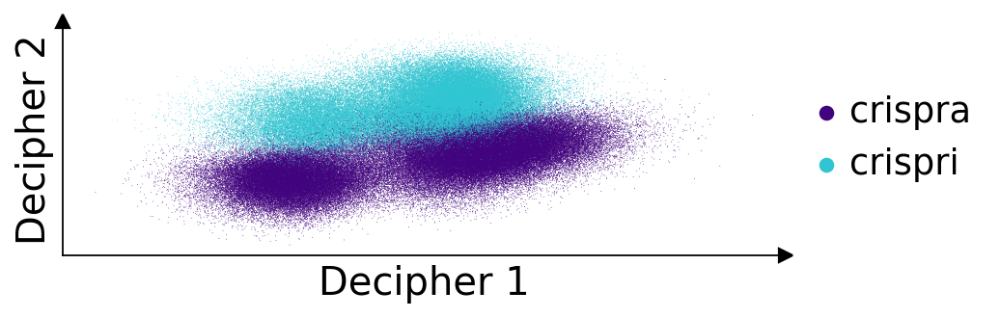

In [27]:
meta = "perturbation"
fig = dc.pl.decipher(adata_concat, [meta], palette=crispr_colors)
fig.set_size_inches(6, 2)
plt.savefig(f'{figures_dir}/crispra_trajectory_{meta}_color.png', dpi=300, bbox_inches='tight')
plt.savefig(f'{figures_dir}/crispra_trajectory_{meta}_color.pdf', dpi=300, bbox_inches='tight')
plt.savefig(f'{figures_dir}/crispra_trajectory_{meta}_color.svg', dpi=300, bbox_inches='tight')

In [28]:
adata_concat.obsm

AxisArrays with keys: decipher_v, decipher_z, decipher_v_not_rotated, decipher_z_not_rotated

Perturbation groups created:
perturbation_combined
Perturbed_crispra    124878
Perturbed_crispri     91188
NTC_crispra           13383
NTC_crispri            1790
Name: count, dtype: int64


2026-02-13 18:42:33,975 | INFO : maxp pruned
2026-02-13 18:42:33,978 | INFO : cmap pruned
2026-02-13 18:42:33,979 | INFO : kern dropped
2026-02-13 18:42:33,979 | INFO : post pruned
2026-02-13 18:42:33,979 | INFO : FFTM dropped
2026-02-13 18:42:33,980 | INFO : GPOS pruned
2026-02-13 18:42:33,981 | INFO : GSUB pruned
2026-02-13 18:42:33,983 | INFO : glyf pruned
2026-02-13 18:42:33,984 | INFO : Added gid0 to subset
2026-02-13 18:42:33,984 | INFO : Added first four glyphs to subset
2026-02-13 18:42:33,984 | INFO : Closing glyph list over 'GSUB': 19 glyphs before
2026-02-13 18:42:33,984 | INFO : Glyph names: ['.notdef', '.null', 'C', 'D', 'N', 'T', 'a', 'c', 'e', 'h', 'i', 'nonmarkingreturn', 'one', 'p', 'r', 's', 'space', 'two', 'underscore']
2026-02-13 18:42:33,985 | INFO : Glyph IDs:   [0, 1, 2, 3, 20, 21, 38, 39, 49, 55, 66, 68, 70, 72, 75, 76, 83, 85, 86]
2026-02-13 18:42:33,986 | INFO : Closed glyph list over 'GSUB': 19 glyphs after
2026-02-13 18:42:33,986 | INFO : Glyph names: ['.not

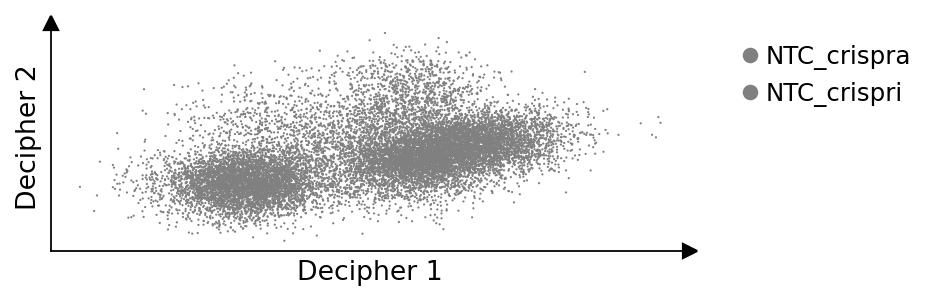

In [29]:
# Create a combined grouping variable for NTC vs perturbed within each CRISPR system
import pandas as pd
import matplotlib.pyplot as plt

# Create the combined perturbation groups directly
perturbation = adata_concat.obs['perturbation'].copy()
gene_id = adata_concat.obs['gene_id'].copy()

# Create the combined groups
combined_groups = []
for pert, gene in zip(perturbation, gene_id):
    if gene == 'NTC':
        combined_groups.append(f'NTC_{pert}')
    else:
        combined_groups.append(f'Perturbed_{pert}')

# Add the combined grouping to your adata object
adata_concat.obs['perturbation_combined'] = combined_groups

# Check the groups created
print("Perturbation groups created:")
print(adata_concat.obs['perturbation_combined'].value_counts())

# Define custom colors - bright colors for NTC, gray for perturbed
import matplotlib.colors as mcolors

# Create color mapping
color_dict = {
    'NTC_crispra': 'gray',       
    'NTC_crispri': 'gray',       
    'Perturbed_crispra': '#61427F', 
    'Perturbed_crispri': '#58A3A9' 
}

# Alternative approach: Plot perturbed cells first with low alpha, then NTC on top
import matplotlib.pyplot as plt

# Create the plot manually to control layering
fig, ax = plt.subplots(figsize=(6, 2))

# Get decipher coordinates
decipher_coords = adata_concat.obsm['decipher_v']  # or wherever decipher stores coordinates

# Plot perturbed cells first (background) with transparency
perturbed_mask = ~adata_concat.obs['perturbation_combined'].str.startswith('NTC')
perturbed_crispra = adata_concat.obs['perturbation_combined'] == 'Perturbed_crispra'
perturbed_crispri = adata_concat.obs['perturbation_combined'] == 'Perturbed_crispri'

#ax.scatter(decipher_coords[perturbed_crispra, 0], decipher_coords[perturbed_crispra, 1], 
           #c=color_dict['Perturbed_crispra'], alpha=0.1, s=1, label='Perturbed_crispra', edgecolors='none')
#ax.scatter(decipher_coords[perturbed_crispri, 0], decipher_coords[perturbed_crispri, 1], 
           #c=color_dict['Perturbed_crispri'], alpha=0.1, s=1, label='Perturbed_crispri', edgecolors='none')

# Plot NTC cells on top with full opacity
ntc_crispra = adata_concat.obs['perturbation_combined'] == 'NTC_crispra'
ntc_crispri = adata_concat.obs['perturbation_combined'] == 'NTC_crispri'

ax.scatter(decipher_coords[ntc_crispra, 0], decipher_coords[ntc_crispra, 1], 
           c=color_dict['NTC_crispra'], alpha=1.0, s=1, label='NTC_crispra', edgecolors='none')
ax.scatter(decipher_coords[ntc_crispri, 0], decipher_coords[ntc_crispri, 1], 
           c=color_dict['NTC_crispri'], alpha=1.0, s=1, label='NTC_crispri', edgecolors='none')

# Style the plot like decipher function
ax.spines["top"].set_visible(False)
ax.spines["right"].set_visible(False)
ax.plot(1, 0, ">k", transform=ax.transAxes, clip_on=False)
ax.plot(0, 1, "^k", transform=ax.transAxes, clip_on=False)

# Remove ticks on x and y axis
ax.set_xticks([])
ax.set_yticks([])

ax.set_xlabel('Decipher 1', fontsize=12)
ax.set_ylabel('Decipher 2', fontsize=12)

# Create legend with custom marker size
legend_elements = [
    #plt.Line2D([0], [0], marker='o', color='w', markerfacecolor=color_dict['Perturbed_crispra'], markersize=8, label='Perturbed_crispra', alpha=0.3),
    #plt.Line2D([0], [0], marker='o', color='w', markerfacecolor=color_dict['Perturbed_crispri'], markersize=8, label='Perturbed_crispri', alpha=0.3),
    plt.Line2D([0], [0], marker='o', color='w', markerfacecolor=color_dict['NTC_crispra'], markersize=8, label='NTC_crispra'),
    plt.Line2D([0], [0], marker='o', color='w', markerfacecolor=color_dict['NTC_crispri'], markersize=8, label='NTC_crispri')
]
ax.legend(handles=legend_elements, bbox_to_anchor=(1.05, 1), loc='upper left', frameon=False, fontsize=11)

plt.tight_layout()
plt.savefig(f'{figures_dir}/crispra_trajectory_ntc_{meta}_color.png', dpi=300, bbox_inches='tight')
plt.savefig(f'{figures_dir}/crispra_trajectory_ntc_{meta}_color.pdf', dpi=300, bbox_inches='tight')
plt.savefig(f'{figures_dir}/crispra_trajectory_ntc_{meta}_color.svg', dpi=300, bbox_inches='tight')
plt.show()

... storing 'new_cell' as categorical
... storing 'treatment' as categorical
... storing 'perturbation' as categorical
... storing 'treatment_perturbation' as categorical
... storing 'perturbation_combined' as categorical


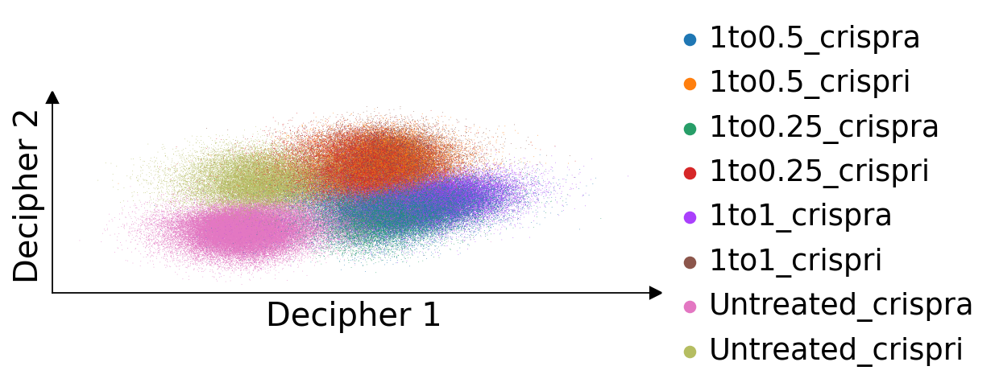

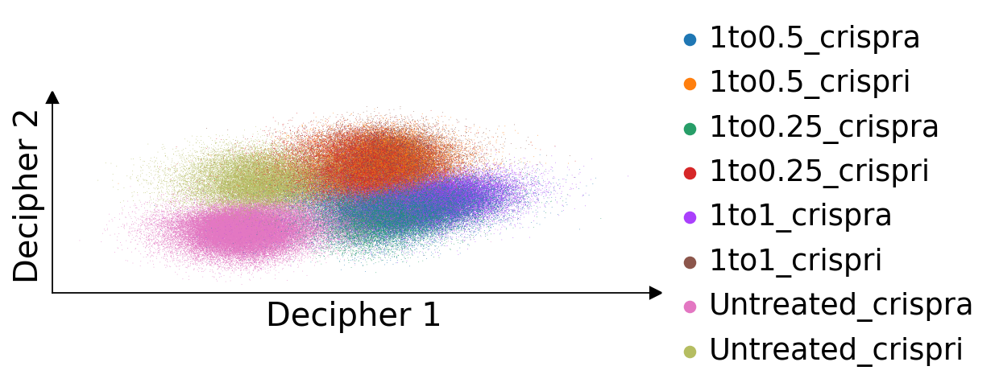

In [30]:
dc.pl.decipher(adata_concat, ["treatment_perturbation"], figsize=(6, 2))

In [31]:
adata_concat.obs["treatment_perturbation"].unique()

array(['1to0.25_crispri', '1to0.5_crispri', 'Untreated_crispri',
       '1to1_crispri', '1to1_crispra', '1to0.25_crispra',
       'Untreated_crispra', '1to0.5_crispra'], dtype=object)

In [32]:
#del adata_concat.uns['decipher']['trajectories']

In [33]:
adata_concat.obs['decipher_clusters'] = adata_concat.obs["treatment_perturbation"]
dc.tl.trajectories(
        adata_concat,
        dc.tl.TConfig("crispri_class", cluster_ids_list = ['Untreated_crispri','1to1_crispri']),
    dc.tl.TConfig("crispra_class", cluster_ids_list = ['Untreated_crispra','1to1_crispra'])
    )
#fig = dc.pl.trajectories(adata_concat, "treatment_perturbation")
#fig.set_size_inches(6, 2)
#plt.savefig(f'{figures_dir}/crispra_trajectory.png', dpi=300, bbox_inches='tight')



2026-02-13 18:42:38,244 | INFO : Trajectory crispri_class : ['Untreated_crispri', '1to1_crispri'])
2026-02-13 18:42:38,245 | INFO : Added trajectory crispri_class to `adata.uns['decipher']['trajectories']`.
2026-02-13 18:42:38,259 | INFO : Trajectory crispra_class : ['Untreated_crispra', '1to1_crispra'])
2026-02-13 18:42:38,260 | INFO : Added trajectory crispra_class to `adata.uns['decipher']['trajectories']`.


... storing 'new_cell' as categorical
... storing 'treatment' as categorical
... storing 'perturbation' as categorical
... storing 'treatment_perturbation' as categorical
... storing 'perturbation_combined' as categorical
... storing 'decipher_clusters' as categorical
2026-02-13 18:42:42,522 | INFO : maxp pruned
2026-02-13 18:42:42,525 | INFO : cmap pruned
2026-02-13 18:42:42,526 | INFO : kern dropped
2026-02-13 18:42:42,526 | INFO : post pruned
2026-02-13 18:42:42,526 | INFO : FFTM dropped
2026-02-13 18:42:42,527 | INFO : GPOS pruned
2026-02-13 18:42:42,528 | INFO : GSUB pruned
2026-02-13 18:42:42,531 | INFO : glyf pruned
2026-02-13 18:42:42,531 | INFO : Added gid0 to subset
2026-02-13 18:42:42,531 | INFO : Added first four glyphs to subset
2026-02-13 18:42:42,531 | INFO : Closing glyph list over 'GSUB': 22 glyphs before
2026-02-13 18:42:42,531 | INFO : Glyph names: ['.notdef', '.null', 'D', 'U', 'a', 'c', 'd', 'e', 'five', 'h', 'i', 'n', 'nonmarkingreturn', 'o', 'one', 'p', 'period',

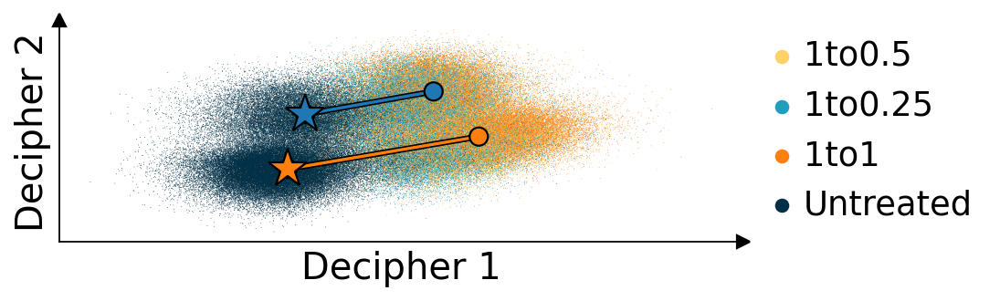

In [34]:

fig = dc.pl.trajectories(adata_concat, "treatment", palette=color_palette)
fig.set_size_inches(6, 2)
plt.savefig(f'{figures_dir}/crispra_trajectory.png', dpi=300, bbox_inches='tight')
plt.savefig(f'{figures_dir}/crispra_trajectory.pdf', dpi=300, bbox_inches='tight')
plt.savefig(f'{figures_dir}/crispra_trajectory.svg', dpi=300, bbox_inches='tight')

In [35]:
dc.tl.decipher_time(adata_concat)
plt.tight_layout() 
plt.savefig(f'{figures_dir}/dose_deciphertime.png', dpi=300)

# Save the plot as PDF
plt.savefig(f'{figures_dir}/dose_deciphertime.pdf', dpi=300)
plt.savefig(f'{figures_dir}/dose_deciphertime.svg', dpi=300)

2026-02-13 18:42:44,008 | INFO : Added `.obs['decipher_time']`: the decipher time of each cell.


<Figure size 320x320 with 0 Axes>

In [36]:
# Save the concatenated AnnData object
adata_concat.write(f'{figures_dir}/adata_concat_ia.h5ad')

... storing 'new_cell' as categorical
... storing 'treatment' as categorical
... storing 'perturbation' as categorical
... storing 'treatment_perturbation' as categorical
... storing 'perturbation_combined' as categorical
... storing 'decipher_clusters' as categorical


# Read in previous decipher Run

In [37]:
# read the saved adata_concat
adata_concat = sc.read(f'{figures_dir}/adata_concat_ia.h5ad')

2026-02-13 18:42:53,693 | INFO : maxp pruned
2026-02-13 18:42:53,697 | INFO : cmap pruned
2026-02-13 18:42:53,697 | INFO : kern dropped
2026-02-13 18:42:53,697 | INFO : post pruned
2026-02-13 18:42:53,697 | INFO : FFTM dropped
2026-02-13 18:42:53,698 | INFO : GPOS pruned
2026-02-13 18:42:53,700 | INFO : GSUB pruned
2026-02-13 18:42:53,703 | INFO : glyf pruned
2026-02-13 18:42:53,704 | INFO : Added gid0 to subset
2026-02-13 18:42:53,704 | INFO : Added first four glyphs to subset
2026-02-13 18:42:53,704 | INFO : Closing glyph list over 'GSUB': 16 glyphs before
2026-02-13 18:42:53,704 | INFO : Glyph names: ['.notdef', '.null', 'D', 'c', 'e', 'five', 'h', 'i', 'nonmarkingreturn', 'one', 'p', 'period', 'r', 'space', 'two', 'zero']
2026-02-13 18:42:53,704 | INFO : Glyph IDs:   [0, 1, 2, 3, 17, 19, 20, 21, 24, 39, 70, 72, 75, 76, 83, 85]
2026-02-13 18:42:53,706 | INFO : Closed glyph list over 'GSUB': 16 glyphs after
2026-02-13 18:42:53,706 | INFO : Glyph names: ['.notdef', '.null', 'D', 'c', 

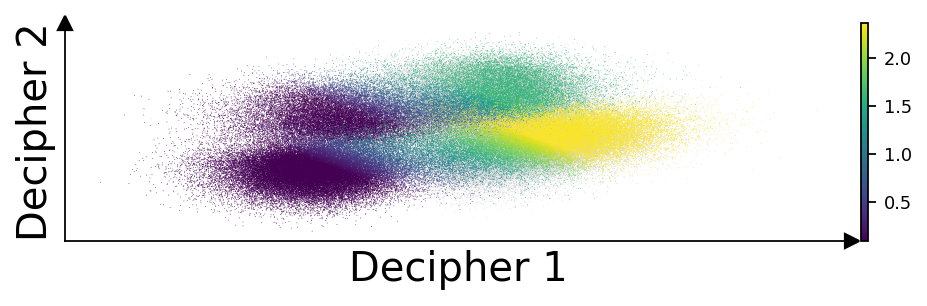

In [38]:
dc.pl.decipher_time(adata_concat, figsize=(6, 2))

plt.tight_layout() 
plt.savefig(f'{figures_dir}/dose_deciphertime.png', dpi=300)

# Save the plot as PDF
plt.savefig(f'{figures_dir}/dose_deciphertime.pdf', dpi=300)
plt.savefig(f'{figures_dir}/dose_deciphertime.svg', dpi=300)

In [39]:
dc.tl.gene_patterns(adata_concat)

In [40]:
colors

{'Untreated': '#023047',
 '1to0.25': '#219EBC',
 '1to0.5': '#FFD166',
 '1to1': '#FF7F11'}

In [41]:
crispr_colors

{'crispri': '#30C5D2', 'crispra': '#42047e'}

In [42]:
combined_colors = {'Untreated': '#023047',
 '1to0.25': '#219EBC',
 '1to0.5': '#FFD166',
 '1to1': '#FF7F11',
 'crispri_class': '#30C5D2',
 'crispra_class': '#42047e'}

2026-02-13 18:42:55,979 | INFO : maxp pruned
2026-02-13 18:42:55,983 | INFO : cmap pruned
2026-02-13 18:42:55,983 | INFO : kern dropped
2026-02-13 18:42:55,983 | INFO : post pruned
2026-02-13 18:42:55,984 | INFO : FFTM dropped
2026-02-13 18:42:55,984 | INFO : GPOS pruned
2026-02-13 18:42:55,986 | INFO : GSUB pruned
2026-02-13 18:42:55,988 | INFO : glyf pruned
2026-02-13 18:42:55,989 | INFO : Added gid0 to subset
2026-02-13 18:42:55,989 | INFO : Added first four glyphs to subset
2026-02-13 18:42:55,989 | INFO : Closing glyph list over 'GSUB': 28 glyphs before
2026-02-13 18:42:55,989 | INFO : Glyph names: ['.notdef', '.null', 'D', 'G', 'O', 'S', 'a', 'c', 'e', 'eight', 'four', 'h', 'i', 'l', 'm', 'n', 'nonmarkingreturn', 'o', 'p', 'r', 's', 'six', 'space', 't', 'two', 'underscore', 'x', 'zero']
2026-02-13 18:42:55,990 | INFO : Glyph IDs:   [0, 1, 2, 3, 19, 21, 23, 25, 27, 39, 42, 50, 54, 66, 68, 70, 72, 75, 76, 79, 80, 81, 82, 83, 85, 86, 87, 91]
2026-02-13 18:42:55,991 | INFO : Closed g

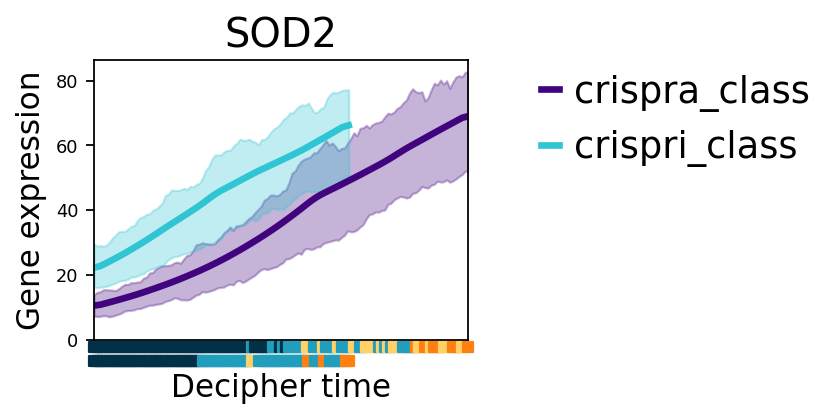

2026-02-13 18:42:56,145 | INFO : maxp pruned
2026-02-13 18:42:56,148 | INFO : cmap pruned
2026-02-13 18:42:56,149 | INFO : kern dropped
2026-02-13 18:42:56,149 | INFO : post pruned
2026-02-13 18:42:56,149 | INFO : FFTM dropped
2026-02-13 18:42:56,150 | INFO : GPOS pruned
2026-02-13 18:42:56,151 | INFO : GSUB pruned
2026-02-13 18:42:56,153 | INFO : glyf pruned
2026-02-13 18:42:56,153 | INFO : Added gid0 to subset
2026-02-13 18:42:56,154 | INFO : Added first four glyphs to subset
2026-02-13 18:42:56,154 | INFO : Closing glyph list over 'GSUB': 30 glyphs before
2026-02-13 18:42:56,154 | INFO : Glyph names: ['.notdef', '.null', 'C', 'D', 'F', 'G', 'S', 'a', 'c', 'e', 'five', 'h', 'i', 'l', 'm', 'n', 'nonmarkingreturn', 'o', 'one', 'p', 'r', 's', 'seven', 'space', 't', 'three', 'two', 'underscore', 'x', 'zero']
2026-02-13 18:42:56,154 | INFO : Glyph IDs:   [0, 1, 2, 3, 19, 20, 21, 22, 24, 26, 38, 39, 41, 42, 54, 66, 68, 70, 72, 75, 76, 79, 80, 81, 82, 83, 85, 86, 87, 91]
2026-02-13 18:42:56

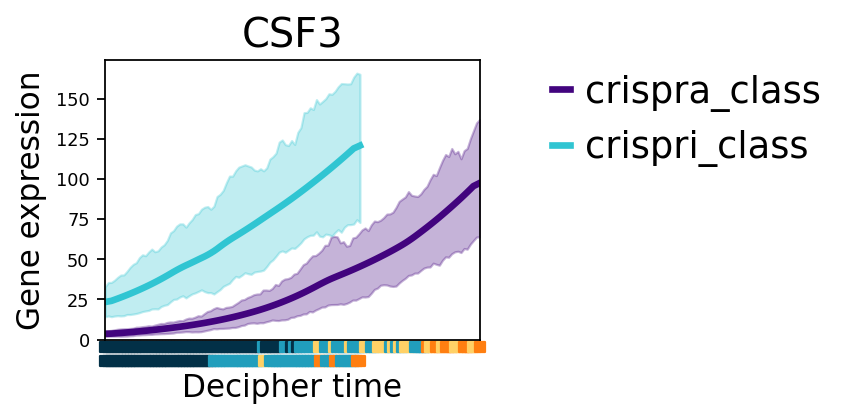

2026-02-13 18:42:56,316 | INFO : maxp pruned
2026-02-13 18:42:56,319 | INFO : cmap pruned
2026-02-13 18:42:56,319 | INFO : kern dropped
2026-02-13 18:42:56,319 | INFO : post pruned
2026-02-13 18:42:56,320 | INFO : FFTM dropped
2026-02-13 18:42:56,320 | INFO : GPOS pruned
2026-02-13 18:42:56,321 | INFO : GSUB pruned
2026-02-13 18:42:56,324 | INFO : glyf pruned
2026-02-13 18:42:56,324 | INFO : Added gid0 to subset
2026-02-13 18:42:56,324 | INFO : Added first four glyphs to subset
2026-02-13 18:42:56,324 | INFO : Closing glyph list over 'GSUB': 29 glyphs before
2026-02-13 18:42:56,325 | INFO : Glyph names: ['.notdef', '.null', 'D', 'G', 'I', 'O', 'a', 'c', 'e', 'five', 'four', 'h', 'i', 'l', 'm', 'n', 'nonmarkingreturn', 'o', 'one', 'p', 'r', 's', 'space', 't', 'three', 'two', 'underscore', 'x', 'zero']
2026-02-13 18:42:56,325 | INFO : Glyph IDs:   [0, 1, 2, 3, 19, 20, 21, 22, 23, 24, 39, 42, 44, 50, 66, 68, 70, 72, 75, 76, 79, 80, 81, 82, 83, 85, 86, 87, 91]
2026-02-13 18:42:56,326 | INF

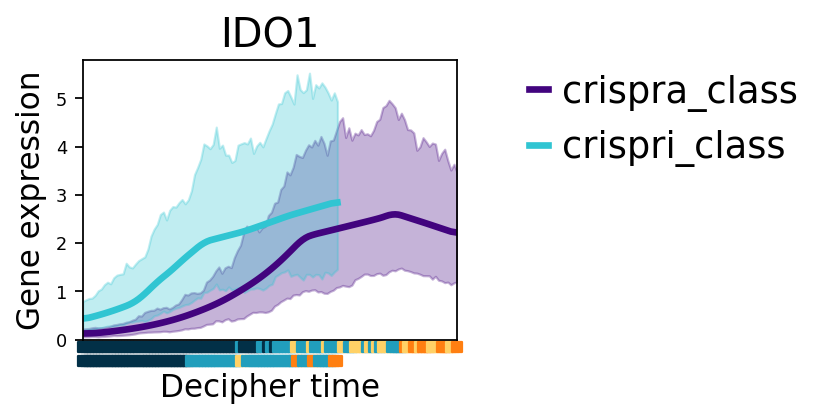

2026-02-13 18:42:56,482 | INFO : maxp pruned
2026-02-13 18:42:56,486 | INFO : cmap pruned
2026-02-13 18:42:56,486 | INFO : kern dropped
2026-02-13 18:42:56,486 | INFO : post pruned
2026-02-13 18:42:56,486 | INFO : FFTM dropped
2026-02-13 18:42:56,487 | INFO : GPOS pruned
2026-02-13 18:42:56,488 | INFO : GSUB pruned
2026-02-13 18:42:56,491 | INFO : glyf pruned
2026-02-13 18:42:56,491 | INFO : Added gid0 to subset
2026-02-13 18:42:56,491 | INFO : Added first four glyphs to subset
2026-02-13 18:42:56,491 | INFO : Closing glyph list over 'GSUB': 28 glyphs before
2026-02-13 18:42:56,491 | INFO : Glyph names: ['.notdef', '.null', 'C', 'D', 'G', 'a', 'c', 'e', 'four', 'h', 'i', 'l', 'm', 'n', 'nonmarkingreturn', 'o', 'one', 'p', 'r', 's', 'seven', 'space', 't', 'three', 'two', 'underscore', 'x', 'zero']
2026-02-13 18:42:56,492 | INFO : Glyph IDs:   [0, 1, 2, 3, 19, 20, 21, 22, 23, 26, 38, 39, 42, 66, 68, 70, 72, 75, 76, 79, 80, 81, 82, 83, 85, 86, 87, 91]
2026-02-13 18:42:56,493 | INFO : Clos

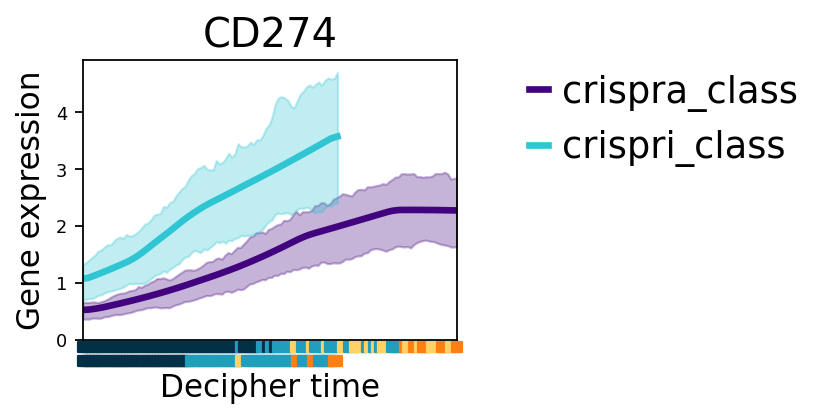

2026-02-13 18:42:56,644 | INFO : maxp pruned
2026-02-13 18:42:56,648 | INFO : cmap pruned
2026-02-13 18:42:56,648 | INFO : kern dropped
2026-02-13 18:42:56,648 | INFO : post pruned
2026-02-13 18:42:56,648 | INFO : FFTM dropped
2026-02-13 18:42:56,649 | INFO : GPOS pruned
2026-02-13 18:42:56,650 | INFO : GSUB pruned
2026-02-13 18:42:56,652 | INFO : glyf pruned
2026-02-13 18:42:56,652 | INFO : Added gid0 to subset
2026-02-13 18:42:56,652 | INFO : Added first four glyphs to subset
2026-02-13 18:42:56,652 | INFO : Closing glyph list over 'GSUB': 30 glyphs before
2026-02-13 18:42:56,653 | INFO : Glyph names: ['.notdef', '.null', 'C', 'D', 'G', 'L', 'P', 'a', 'c', 'e', 'eight', 'four', 'h', 'i', 'l', 'm', 'n', 'nonmarkingreturn', 'o', 'one', 'p', 'r', 's', 'six', 'space', 't', 'two', 'underscore', 'x', 'zero']
2026-02-13 18:42:56,653 | INFO : Glyph IDs:   [0, 1, 2, 3, 19, 20, 21, 23, 25, 27, 38, 39, 42, 47, 51, 66, 68, 70, 72, 75, 76, 79, 80, 81, 82, 83, 85, 86, 87, 91]
2026-02-13 18:42:56,6

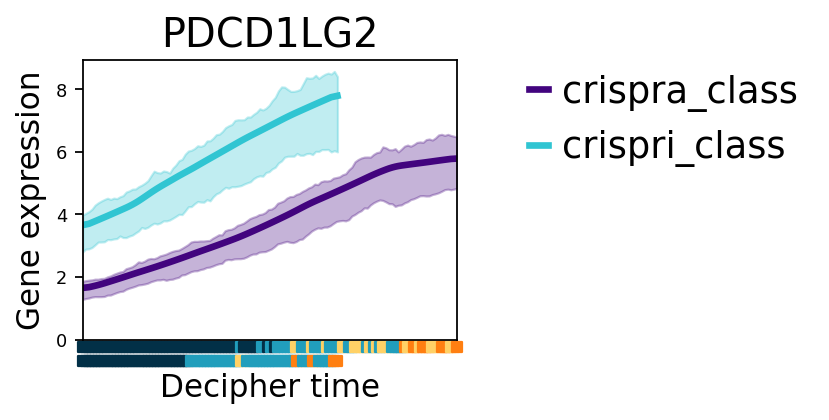

2026-02-13 18:42:56,808 | INFO : maxp pruned
2026-02-13 18:42:56,811 | INFO : cmap pruned
2026-02-13 18:42:56,811 | INFO : kern dropped
2026-02-13 18:42:56,811 | INFO : post pruned
2026-02-13 18:42:56,812 | INFO : FFTM dropped
2026-02-13 18:42:56,812 | INFO : GPOS pruned
2026-02-13 18:42:56,813 | INFO : GSUB pruned
2026-02-13 18:42:56,816 | INFO : glyf pruned
2026-02-13 18:42:56,816 | INFO : Added gid0 to subset
2026-02-13 18:42:56,816 | INFO : Added first four glyphs to subset
2026-02-13 18:42:56,816 | INFO : Closing glyph list over 'GSUB': 27 glyphs before
2026-02-13 18:42:56,816 | INFO : Glyph names: ['.notdef', '.null', 'D', 'E', 'G', 'P', 'a', 'c', 'e', 'five', 'h', 'i', 'l', 'm', 'n', 'nonmarkingreturn', 'o', 'one', 'p', 'r', 's', 'space', 't', 'two', 'underscore', 'x', 'zero']
2026-02-13 18:42:56,817 | INFO : Glyph IDs:   [0, 1, 2, 3, 19, 20, 21, 24, 39, 40, 42, 51, 66, 68, 70, 72, 75, 76, 79, 80, 81, 82, 83, 85, 86, 87, 91]
2026-02-13 18:42:56,818 | INFO : Closed glyph list ove

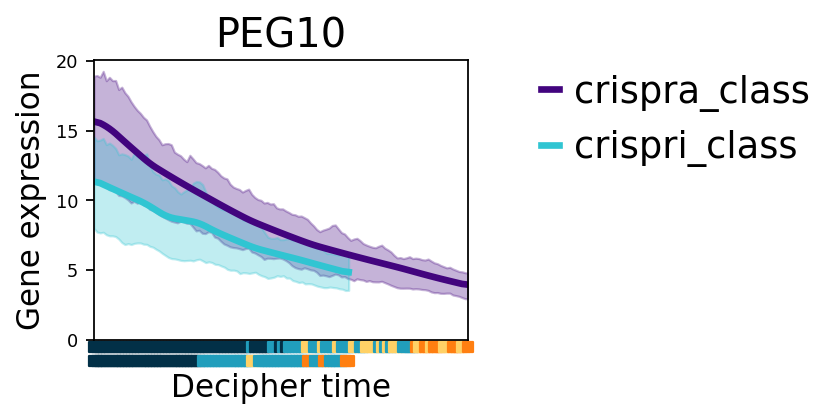

2026-02-13 18:42:56,970 | INFO : maxp pruned
2026-02-13 18:42:56,974 | INFO : cmap pruned
2026-02-13 18:42:56,974 | INFO : kern dropped
2026-02-13 18:42:56,974 | INFO : post pruned
2026-02-13 18:42:56,974 | INFO : FFTM dropped
2026-02-13 18:42:56,975 | INFO : GPOS pruned
2026-02-13 18:42:56,976 | INFO : GSUB pruned
2026-02-13 18:42:56,978 | INFO : glyf pruned
2026-02-13 18:42:56,979 | INFO : Added gid0 to subset
2026-02-13 18:42:56,979 | INFO : Added first four glyphs to subset
2026-02-13 18:42:56,979 | INFO : Closing glyph list over 'GSUB': 30 glyphs before
2026-02-13 18:42:56,979 | INFO : Glyph names: ['.notdef', '.null', 'A', 'D', 'G', 'R', 'a', 'c', 'e', 'five', 'four', 'h', 'i', 'l', 'm', 'n', 'nonmarkingreturn', 'o', 'one', 'p', 'r', 's', 'six', 'space', 't', 'three', 'two', 'underscore', 'x', 'zero']
2026-02-13 18:42:56,979 | INFO : Glyph IDs:   [0, 1, 2, 3, 19, 20, 21, 22, 23, 24, 25, 36, 39, 42, 53, 66, 68, 70, 72, 75, 76, 79, 80, 81, 82, 83, 85, 86, 87, 91]
2026-02-13 18:42:5

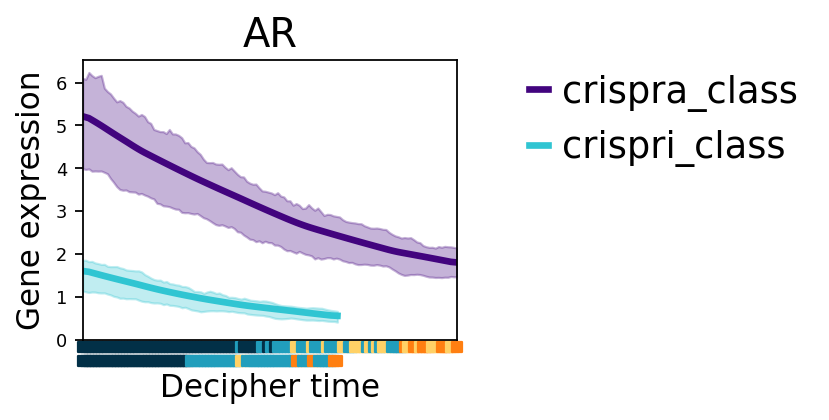

2026-02-13 18:42:57,136 | INFO : maxp pruned
2026-02-13 18:42:57,139 | INFO : cmap pruned
2026-02-13 18:42:57,139 | INFO : kern dropped
2026-02-13 18:42:57,140 | INFO : post pruned
2026-02-13 18:42:57,140 | INFO : FFTM dropped


2026-02-13 18:42:57,141 | INFO : GPOS pruned
2026-02-13 18:42:57,495 | INFO : GSUB pruned
2026-02-13 18:42:57,498 | INFO : glyf pruned
2026-02-13 18:42:57,499 | INFO : Added gid0 to subset
2026-02-13 18:42:57,499 | INFO : Added first four glyphs to subset
2026-02-13 18:42:57,499 | INFO : Closing glyph list over 'GSUB': 28 glyphs before
2026-02-13 18:42:57,499 | INFO : Glyph names: ['.notdef', '.null', 'D', 'G', 'R', 'T', 'W', 'a', 'c', 'e', 'five', 'h', 'i', 'l', 'm', 'n', 'nonmarkingreturn', 'o', 'one', 'p', 'r', 's', 'space', 't', 'two', 'underscore', 'x', 'zero']
2026-02-13 18:42:57,500 | INFO : Glyph IDs:   [0, 1, 2, 3, 19, 20, 21, 24, 39, 42, 53, 55, 58, 66, 68, 70, 72, 75, 76, 79, 80, 81, 82, 83, 85, 86, 87, 91]
2026-02-13 18:42:57,501 | INFO : Closed glyph list over 'GSUB': 28 glyphs after
2026-02-13 18:42:57,501 | INFO : Glyph names: ['.notdef', '.null', 'D', 'G', 'R', 'T', 'W', 'a', 'c', 'e', 'five', 'h', 'i', 'l', 'm', 'n', 'nonmarkingreturn', 'o', 'one', 'p', 'r', 's', 'spac

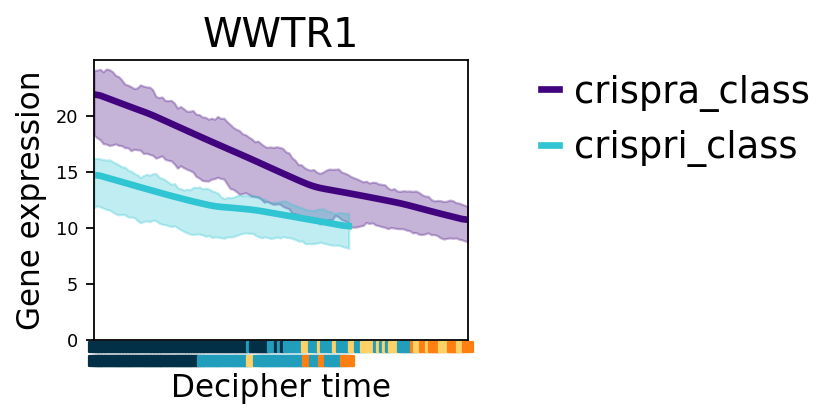

2026-02-13 18:42:57,651 | INFO : maxp pruned
2026-02-13 18:42:57,654 | INFO : cmap pruned
2026-02-13 18:42:57,654 | INFO : kern dropped
2026-02-13 18:42:57,655 | INFO : post pruned
2026-02-13 18:42:57,655 | INFO : FFTM dropped
2026-02-13 18:42:57,656 | INFO : GPOS pruned
2026-02-13 18:42:57,657 | INFO : GSUB pruned
2026-02-13 18:42:57,659 | INFO : glyf pruned
2026-02-13 18:42:57,660 | INFO : Added gid0 to subset
2026-02-13 18:42:57,660 | INFO : Added first four glyphs to subset
2026-02-13 18:42:57,660 | INFO : Closing glyph list over 'GSUB': 26 glyphs before
2026-02-13 18:42:57,660 | INFO : Glyph names: ['.notdef', '.null', 'D', 'G', 'I', 'a', 'c', 'e', 'five', 'h', 'i', 'l', 'm', 'n', 'nonmarkingreturn', 'o', 'one', 'p', 'r', 's', 'space', 't', 'two', 'underscore', 'x', 'zero']
2026-02-13 18:42:57,661 | INFO : Glyph IDs:   [0, 1, 2, 3, 19, 20, 21, 24, 39, 42, 44, 66, 68, 70, 72, 75, 76, 79, 80, 81, 82, 83, 85, 86, 87, 91]
2026-02-13 18:42:57,662 | INFO : Closed glyph list over 'GSUB':

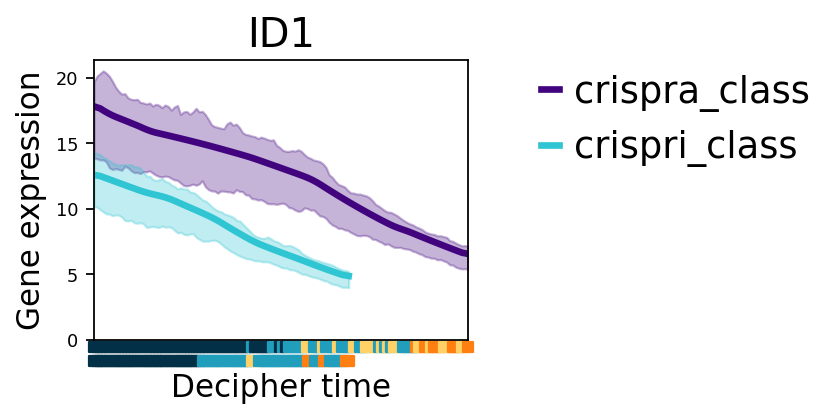

2026-02-13 18:42:57,811 | INFO : maxp pruned
2026-02-13 18:42:57,814 | INFO : cmap pruned
2026-02-13 18:42:57,815 | INFO : kern dropped
2026-02-13 18:42:57,815 | INFO : post pruned
2026-02-13 18:42:57,815 | INFO : FFTM dropped
2026-02-13 18:42:57,816 | INFO : GPOS pruned
2026-02-13 18:42:57,817 | INFO : GSUB pruned
2026-02-13 18:42:57,819 | INFO : glyf pruned
2026-02-13 18:42:57,820 | INFO : Added gid0 to subset
2026-02-13 18:42:57,820 | INFO : Added first four glyphs to subset
2026-02-13 18:42:57,820 | INFO : Closing glyph list over 'GSUB': 27 glyphs before
2026-02-13 18:42:57,820 | INFO : Glyph names: ['.notdef', '.null', 'C', 'D', 'G', 'X', 'a', 'c', 'e', 'five', 'h', 'i', 'l', 'm', 'n', 'nonmarkingreturn', 'o', 'one', 'p', 'r', 's', 'space', 't', 'two', 'underscore', 'x', 'zero']
2026-02-13 18:42:57,821 | INFO : Glyph IDs:   [0, 1, 2, 3, 19, 20, 21, 24, 38, 39, 42, 59, 66, 68, 70, 72, 75, 76, 79, 80, 81, 82, 83, 85, 86, 87, 91]
2026-02-13 18:42:57,822 | INFO : Closed glyph list ove

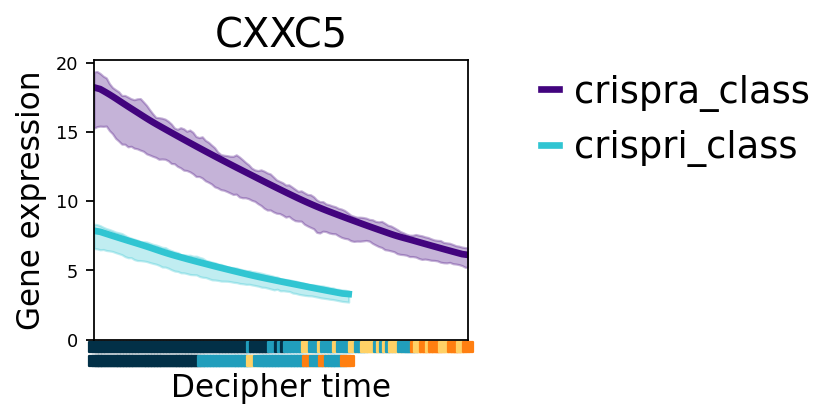

2026-02-13 18:42:57,973 | INFO : maxp pruned
2026-02-13 18:42:57,977 | INFO : cmap pruned
2026-02-13 18:42:57,977 | INFO : kern dropped
2026-02-13 18:42:57,977 | INFO : post pruned
2026-02-13 18:42:57,977 | INFO : FFTM dropped
2026-02-13 18:42:57,978 | INFO : GPOS pruned
2026-02-13 18:42:57,979 | INFO : GSUB pruned
2026-02-13 18:42:57,982 | INFO : glyf pruned
2026-02-13 18:42:57,982 | INFO : Added gid0 to subset
2026-02-13 18:42:57,983 | INFO : Added first four glyphs to subset
2026-02-13 18:42:57,983 | INFO : Closing glyph list over 'GSUB': 29 glyphs before
2026-02-13 18:42:57,983 | INFO : Glyph names: ['.notdef', '.null', 'A', 'C', 'D', 'G', 'L', 'O', 'a', 'c', 'e', 'five', 'h', 'i', 'l', 'm', 'n', 'nonmarkingreturn', 'o', 'one', 'p', 'r', 's', 'space', 't', 'two', 'underscore', 'x', 'zero']
2026-02-13 18:42:57,983 | INFO : Glyph IDs:   [0, 1, 2, 3, 19, 20, 21, 24, 36, 38, 39, 42, 47, 50, 66, 68, 70, 72, 75, 76, 79, 80, 81, 82, 83, 85, 86, 87, 91]
2026-02-13 18:42:57,985 | INFO : Clo

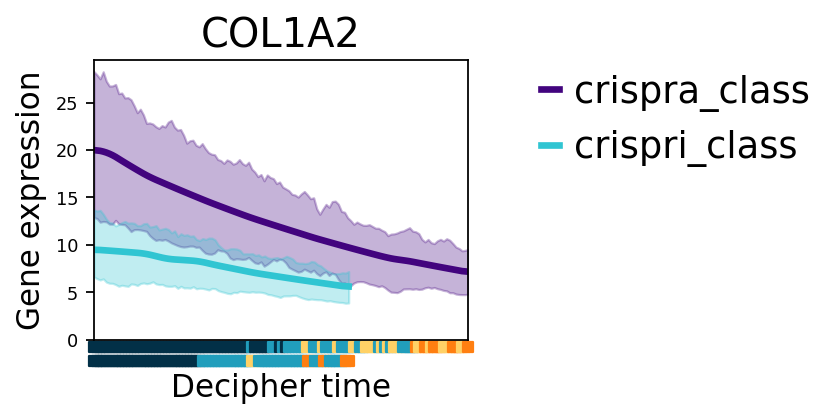

2026-02-13 18:42:58,142 | INFO : maxp pruned
2026-02-13 18:42:58,146 | INFO : cmap pruned
2026-02-13 18:42:58,146 | INFO : kern dropped
2026-02-13 18:42:58,146 | INFO : post pruned
2026-02-13 18:42:58,147 | INFO : FFTM dropped
2026-02-13 18:42:58,147 | INFO : GPOS pruned
2026-02-13 18:42:58,148 | INFO : GSUB pruned
2026-02-13 18:42:58,151 | INFO : glyf pruned
2026-02-13 18:42:58,152 | INFO : Added gid0 to subset
2026-02-13 18:42:58,152 | INFO : Added first four glyphs to subset
2026-02-13 18:42:58,152 | INFO : Closing glyph list over 'GSUB': 30 glyphs before
2026-02-13 18:42:58,152 | INFO : Glyph names: ['.notdef', '.null', 'A', 'D', 'G', 'P', 'T', 'a', 'c', 'e', 'five', 'h', 'i', 'l', 'm', 'n', 'nonmarkingreturn', 'o', 'one', 'p', 'period', 'r', 's', 'seven', 'space', 't', 'two', 'underscore', 'x', 'zero']
2026-02-13 18:42:58,153 | INFO : Glyph IDs:   [0, 1, 2, 3, 17, 19, 20, 21, 24, 26, 36, 39, 42, 51, 55, 66, 68, 70, 72, 75, 76, 79, 80, 81, 82, 83, 85, 86, 87, 91]
2026-02-13 18:42:5

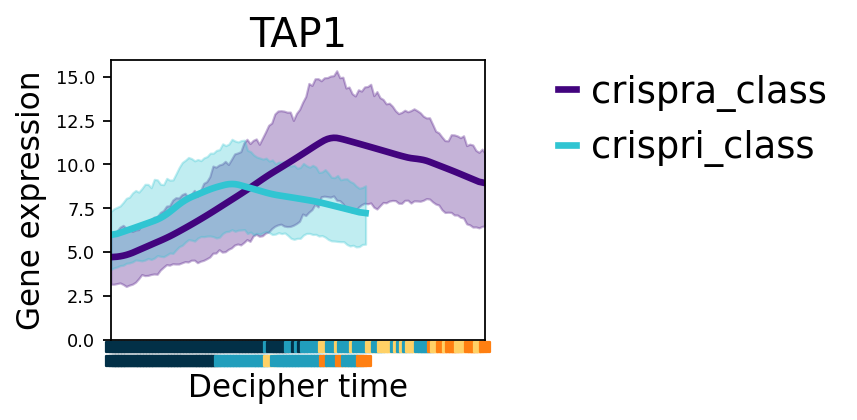

2026-02-13 18:42:58,315 | INFO : maxp pruned
2026-02-13 18:42:58,318 | INFO : cmap pruned
2026-02-13 18:42:58,319 | INFO : kern dropped
2026-02-13 18:42:58,319 | INFO : post pruned
2026-02-13 18:42:58,319 | INFO : FFTM dropped
2026-02-13 18:42:58,320 | INFO : GPOS pruned
2026-02-13 18:42:58,321 | INFO : GSUB pruned
2026-02-13 18:42:58,323 | INFO : glyf pruned
2026-02-13 18:42:58,324 | INFO : Added gid0 to subset
2026-02-13 18:42:58,324 | INFO : Added first four glyphs to subset
2026-02-13 18:42:58,324 | INFO : Closing glyph list over 'GSUB': 30 glyphs before
2026-02-13 18:42:58,324 | INFO : Glyph names: ['.notdef', '.null', 'A', 'C', 'D', 'G', 'I', 'M', 'a', 'c', 'e', 'four', 'h', 'i', 'l', 'm', 'n', 'nonmarkingreturn', 'o', 'one', 'p', 'r', 's', 'space', 't', 'three', 'two', 'underscore', 'x', 'zero']
2026-02-13 18:42:58,325 | INFO : Glyph IDs:   [0, 1, 2, 3, 19, 20, 21, 22, 23, 36, 38, 39, 42, 44, 48, 66, 68, 70, 72, 75, 76, 79, 80, 81, 82, 83, 85, 86, 87, 91]
2026-02-13 18:42:58,326

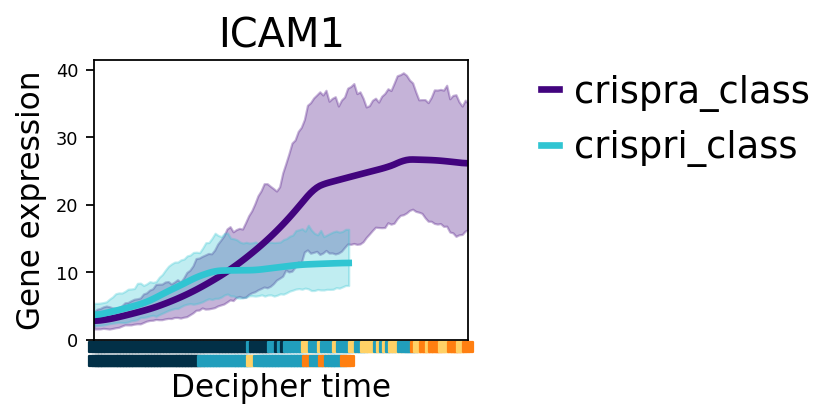

2026-02-13 18:42:58,482 | INFO : maxp pruned
2026-02-13 18:42:58,485 | INFO : cmap pruned
2026-02-13 18:42:58,485 | INFO : kern dropped
2026-02-13 18:42:58,486 | INFO : post pruned
2026-02-13 18:42:58,486 | INFO : FFTM dropped
2026-02-13 18:42:58,486 | INFO : GPOS pruned
2026-02-13 18:42:58,488 | INFO : GSUB pruned
2026-02-13 18:42:58,491 | INFO : glyf pruned
2026-02-13 18:42:58,491 | INFO : Added gid0 to subset
2026-02-13 18:42:58,491 | INFO : Added first four glyphs to subset
2026-02-13 18:42:58,491 | INFO : Closing glyph list over 'GSUB': 31 glyphs before
2026-02-13 18:42:58,491 | INFO : Glyph names: ['.notdef', '.null', 'C', 'D', 'G', 'L', 'X', 'a', 'c', 'e', 'eight', 'four', 'h', 'i', 'l', 'm', 'n', 'nonmarkingreturn', 'o', 'one', 'p', 'r', 's', 'six', 'space', 't', 'three', 'two', 'underscore', 'x', 'zero']
2026-02-13 18:42:58,492 | INFO : Glyph IDs:   [0, 1, 2, 3, 19, 20, 21, 22, 23, 25, 27, 38, 39, 42, 47, 59, 66, 68, 70, 72, 75, 76, 79, 80, 81, 82, 83, 85, 86, 87, 91]
2026-02-

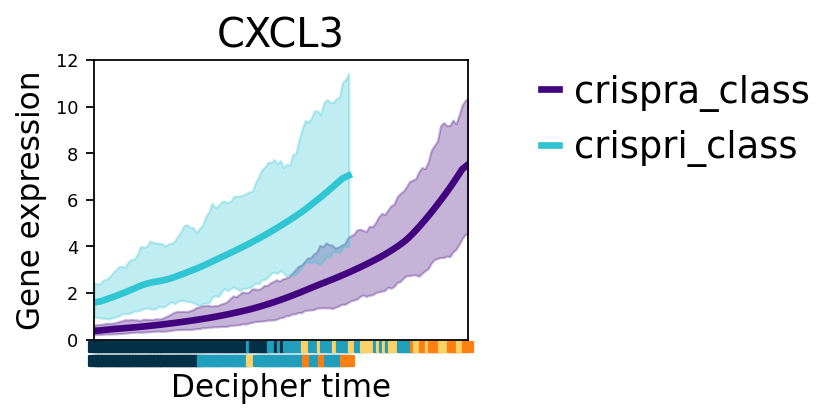

2026-02-13 18:42:58,651 | INFO : maxp pruned
2026-02-13 18:42:58,655 | INFO : cmap pruned
2026-02-13 18:42:58,655 | INFO : kern dropped
2026-02-13 18:42:58,656 | INFO : post pruned
2026-02-13 18:42:58,656 | INFO : FFTM dropped
2026-02-13 18:42:58,657 | INFO : GPOS pruned
2026-02-13 18:42:58,658 | INFO : GSUB pruned
2026-02-13 18:42:58,660 | INFO : glyf pruned
2026-02-13 18:42:58,661 | INFO : Added gid0 to subset
2026-02-13 18:42:58,661 | INFO : Added first four glyphs to subset
2026-02-13 18:42:58,661 | INFO : Closing glyph list over 'GSUB': 28 glyphs before
2026-02-13 18:42:58,661 | INFO : Glyph names: ['.notdef', '.null', 'C', 'D', 'G', 'L', 'X', 'a', 'c', 'e', 'five', 'h', 'i', 'l', 'm', 'n', 'nonmarkingreturn', 'o', 'one', 'p', 'r', 's', 'space', 't', 'two', 'underscore', 'x', 'zero']
2026-02-13 18:42:58,662 | INFO : Glyph IDs:   [0, 1, 2, 3, 19, 20, 21, 24, 38, 39, 42, 47, 59, 66, 68, 70, 72, 75, 76, 79, 80, 81, 82, 83, 85, 86, 87, 91]
2026-02-13 18:42:58,663 | INFO : Closed glyph

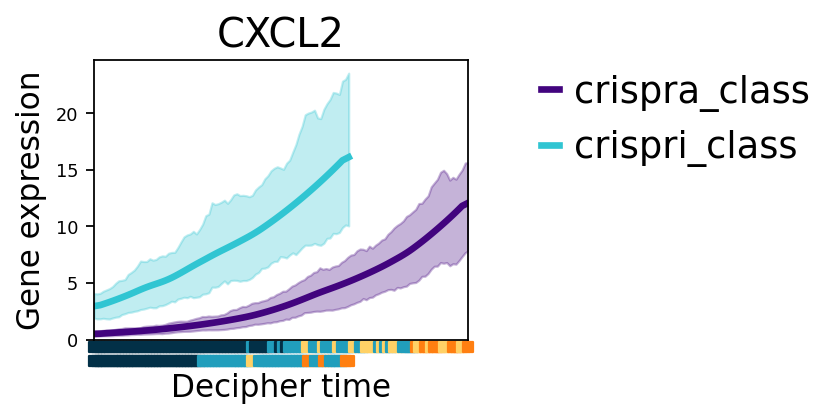

2026-02-13 18:42:58,815 | INFO : maxp pruned
2026-02-13 18:42:58,818 | INFO : cmap pruned
2026-02-13 18:42:58,819 | INFO : kern dropped
2026-02-13 18:42:58,819 | INFO : post pruned
2026-02-13 18:42:58,819 | INFO : FFTM dropped
2026-02-13 18:42:58,820 | INFO : GPOS pruned
2026-02-13 18:42:58,821 | INFO : GSUB pruned
2026-02-13 18:42:58,823 | INFO : glyf pruned
2026-02-13 18:42:58,824 | INFO : Added gid0 to subset
2026-02-13 18:42:58,824 | INFO : Added first four glyphs to subset
2026-02-13 18:42:58,824 | INFO : Closing glyph list over 'GSUB': 31 glyphs before
2026-02-13 18:42:58,824 | INFO : Glyph names: ['.notdef', '.null', 'C', 'D', 'G', 'L', 'X', 'a', 'c', 'e', 'eight', 'five', 'four', 'h', 'i', 'l', 'm', 'n', 'nonmarkingreturn', 'o', 'one', 'p', 'r', 's', 'space', 't', 'three', 'two', 'underscore', 'x', 'zero']
2026-02-13 18:42:58,824 | INFO : Glyph IDs:   [0, 1, 2, 3, 19, 20, 21, 22, 23, 24, 27, 38, 39, 42, 47, 59, 66, 68, 70, 72, 75, 76, 79, 80, 81, 82, 83, 85, 86, 87, 91]
2026-02

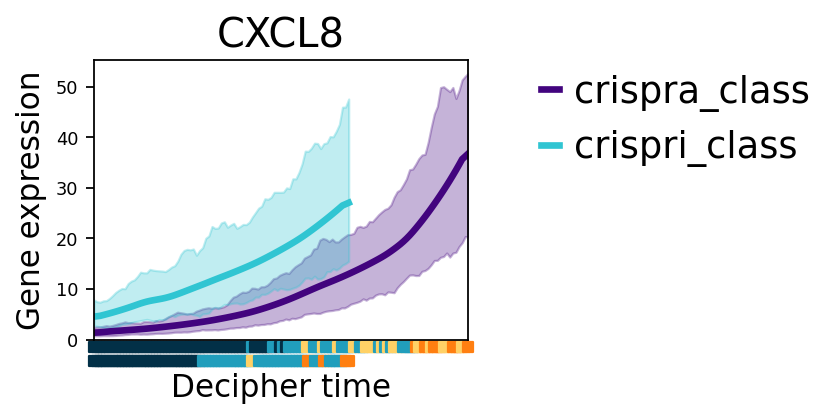

In [43]:
gene_list = ["SOD2","CSF3","IDO1","CD274",'PDCD1LG2','PEG10','AR','WWTR1','ID1','CXXC5','COL1A2','TAP1','ICAM1','CXCL3','CXCL2','CXCL8']
for i in gene_list:
    dc.pl.gene_patterns(adata_concat, i, palette=combined_colors, cell_type_key="treatment")
    plt.legend(loc='lower right', bbox_to_anchor=(2, 0.5), frameon = False)  # Change 'upper right' to your desired location
    # Show the plot
    plt.savefig(f'{figures_dir}/'+ i + '_full_expression_plot.pdf',dpi = 300, bbox_inches='tight')
    plt.savefig(f'{figures_dir}/'+ i + '_full_expression_plot.png',dpi = 300, bbox_inches='tight')
    plt.savefig(f'{figures_dir}/'+ i + '_full_expression_plot.svg',dpi = 300, bbox_inches='tight')
    plt.show()

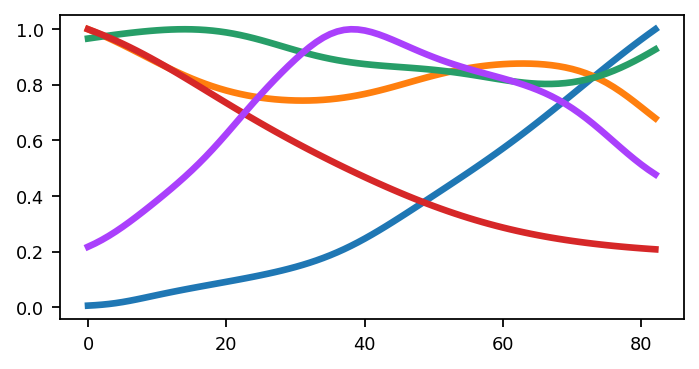

Loss: -656370.9 - Relative Error: 0.01%:  55%|█████▍    | 5473/10000 [00:44<00:36, 123.59it/s]


In [44]:
training_losses = dc.tl.basis_decomposition(adata_concat, seed=0);

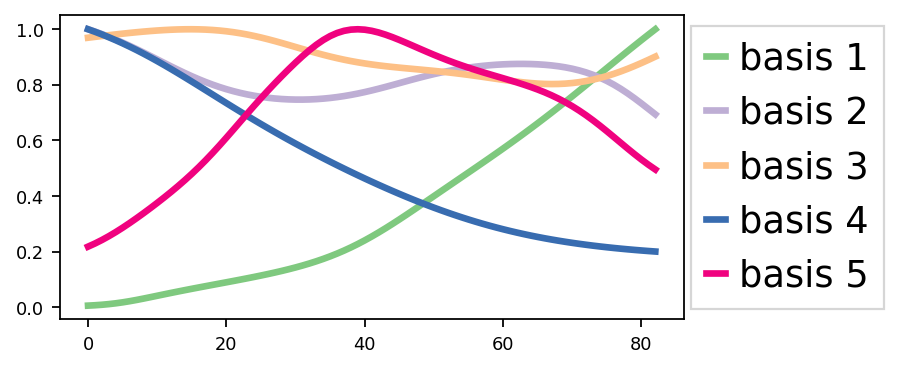

In [45]:
colors = [sns.color_palette("Accent")[i] for i in [0, 1, 2, 4, 5]]
dc.pl.basis(adata_concat, colors=colors);

In [46]:
# compare between cripsri and a
dc.tl.disruption_scores(adata_concat)
gene_list = adata_concat.var[[c for c in adata_concat.var if "decipher_disruption" in c]].sort_values(
    "decipher_disruption_combined", ascending=False
).head(50)

gene_list

2026-02-13 18:43:43,385 | INFO : Added `.var['decipher_disruption_shape']`: shape disruption scores
2026-02-13 18:43:43,385 | INFO : Added `.var['decipher_disruption_scale']`: scale disruption scores
2026-02-13 18:43:43,385 | INFO : Added `.var['decipher_disruption_combined']`: combined disruption scores
2026-02-13 18:43:43,386 | INFO : Added `.uns['decipher']['disruption_scores']`: disruption scores
2026-02-13 18:43:43,386 | INFO : Added `.uns['decipher']['disruption_scores_samples']`: disruption scores probabilistic samples


,decipher_disruption_shape,decipher_disruption_scale,decipher_disruption_combined
IL1B,0.218795,2.950490,10.578728
BST2,0.597361,0.900168,9.799122
HIST1H1D,0.503413,0.294886,9.671704
IDO1,0.541990,0.344664,9.165645
RARRES3,0.600841,0.178735,9.064417
PSMB10,0.572550,0.069765,8.940222
TSHZ2,0.732533,0.056333,8.926781
ADCY8,0.588522,0.591567,8.731138
XAF1,0.552593,0.022926,8.591465
GBP4,0.644934,0.094642,8.576219


In [47]:
gene_list = gene_list.index

In [48]:
gene_list

Index(['IL1B', 'BST2', 'HIST1H1D', 'IDO1', 'RARRES3', 'PSMB10', 'TSHZ2',
       'ADCY8', 'XAF1', 'GBP4', 'CEMIP', 'TAP1', 'HMGN2P46', 'SERPINB2',
       'BATF2', 'NRG1', 'CCNB1', 'ID3', 'LSAMP', 'SLC15A3', 'FST', 'CD74',
       'CSF3', 'CDC20', 'CXCL2', 'SNAP25', 'PLK1', 'IFI35', 'MMP3', 'OAS2',
       'PALMD', 'LAP3', 'IFIT3', 'CKS2', 'APOL3', 'HIST1H4C', 'DCC', 'KCNIP4',
       'SMAD6', 'BIRC3', 'NEK2', 'APOLD1', 'AL138828.1', 'WARS', 'IRF1',
       'APOL1', 'LINC01060', 'CNIH3', 'AC109466.1', 'APOL2'],
      dtype='object')

2026-02-13 18:43:43,428 | INFO : maxp pruned
2026-02-13 18:43:43,431 | INFO : cmap pruned
2026-02-13 18:43:43,431 | INFO : kern dropped
2026-02-13 18:43:43,431 | INFO : post pruned
2026-02-13 18:43:43,431 | INFO : FFTM dropped
2026-02-13 18:43:43,432 | INFO : GPOS pruned
2026-02-13 18:43:43,433 | INFO : GSUB pruned
2026-02-13 18:43:43,435 | INFO : glyf pruned
2026-02-13 18:43:43,436 | INFO : Added gid0 to subset
2026-02-13 18:43:43,436 | INFO : Added first four glyphs to subset
2026-02-13 18:43:43,436 | INFO : Closing glyph list over 'GSUB': 30 glyphs before
2026-02-13 18:43:43,436 | INFO : Glyph names: ['.notdef', '.null', 'B', 'D', 'G', 'I', 'L', 'a', 'c', 'e', 'eight', 'four', 'h', 'i', 'l', 'm', 'n', 'nonmarkingreturn', 'o', 'one', 'p', 'r', 's', 'six', 'space', 't', 'two', 'underscore', 'x', 'zero']
2026-02-13 18:43:43,436 | INFO : Glyph IDs:   [0, 1, 2, 3, 19, 20, 21, 23, 25, 27, 37, 39, 42, 44, 47, 66, 68, 70, 72, 75, 76, 79, 80, 81, 82, 83, 85, 86, 87, 91]
2026-02-13 18:43:43,4

IL1B
BST2


2026-02-13 18:43:43,706 | INFO : maxp pruned
2026-02-13 18:43:43,709 | INFO : cmap pruned
2026-02-13 18:43:43,709 | INFO : kern dropped
2026-02-13 18:43:43,709 | INFO : post pruned
2026-02-13 18:43:43,709 | INFO : FFTM dropped
2026-02-13 18:43:43,710 | INFO : GPOS pruned
2026-02-13 18:43:43,711 | INFO : GSUB pruned
2026-02-13 18:43:43,713 | INFO : glyf pruned
2026-02-13 18:43:43,713 | INFO : Added gid0 to subset
2026-02-13 18:43:43,714 | INFO : Added first four glyphs to subset
2026-02-13 18:43:43,714 | INFO : Closing glyph list over 'GSUB': 31 glyphs before
2026-02-13 18:43:43,714 | INFO : Glyph names: ['.notdef', '.null', 'D', 'G', 'H', 'I', 'S', 'T', 'a', 'c', 'e', 'five', 'four', 'h', 'i', 'l', 'm', 'n', 'nonmarkingreturn', 'o', 'one', 'p', 'r', 's', 'space', 't', 'three', 'two', 'underscore', 'x', 'zero']
2026-02-13 18:43:43,714 | INFO : Glyph IDs:   [0, 1, 2, 3, 19, 20, 21, 22, 23, 24, 39, 42, 43, 44, 54, 55, 66, 68, 70, 72, 75, 76, 79, 80, 81, 82, 83, 85, 86, 87, 91]
2026-02-13 

HIST1H1D
IDO1


2026-02-13 18:43:43,988 | INFO : maxp pruned
2026-02-13 18:43:43,991 | INFO : cmap pruned
2026-02-13 18:43:43,991 | INFO : kern dropped
2026-02-13 18:43:43,991 | INFO : post pruned
2026-02-13 18:43:43,991 | INFO : FFTM dropped
2026-02-13 18:43:43,992 | INFO : GPOS pruned
2026-02-13 18:43:43,993 | INFO : GSUB pruned
2026-02-13 18:43:43,995 | INFO : glyf pruned
2026-02-13 18:43:43,995 | INFO : Added gid0 to subset
2026-02-13 18:43:43,996 | INFO : Added first four glyphs to subset
2026-02-13 18:43:43,996 | INFO : Closing glyph list over 'GSUB': 29 glyphs before
2026-02-13 18:43:43,996 | INFO : Glyph names: ['.notdef', '.null', 'A', 'D', 'E', 'G', 'R', 'S', 'a', 'c', 'e', 'h', 'i', 'l', 'm', 'n', 'nonmarkingreturn', 'o', 'one', 'p', 'r', 's', 'space', 't', 'three', 'two', 'underscore', 'x', 'zero']
2026-02-13 18:43:43,996 | INFO : Glyph IDs:   [0, 1, 2, 3, 19, 20, 21, 22, 36, 39, 40, 42, 53, 54, 66, 68, 70, 72, 75, 76, 79, 80, 81, 82, 83, 85, 86, 87, 91]
2026-02-13 18:43:43,997 | INFO : Cl

RARRES3
PSMB10


2026-02-13 18:43:44,266 | INFO : maxp pruned
2026-02-13 18:43:44,269 | INFO : cmap pruned
2026-02-13 18:43:44,269 | INFO : kern dropped
2026-02-13 18:43:44,269 | INFO : post pruned
2026-02-13 18:43:44,269 | INFO : FFTM dropped
2026-02-13 18:43:44,270 | INFO : GPOS pruned
2026-02-13 18:43:44,271 | INFO : GSUB pruned
2026-02-13 18:43:44,273 | INFO : glyf pruned
2026-02-13 18:43:44,274 | INFO : Added gid0 to subset
2026-02-13 18:43:44,274 | INFO : Added first four glyphs to subset
2026-02-13 18:43:44,274 | INFO : Closing glyph list over 'GSUB': 29 glyphs before
2026-02-13 18:43:44,274 | INFO : Glyph names: ['.notdef', '.null', 'D', 'G', 'H', 'S', 'T', 'Z', 'a', 'c', 'e', 'five', 'h', 'i', 'l', 'm', 'n', 'nonmarkingreturn', 'o', 'one', 'p', 'r', 's', 'space', 't', 'two', 'underscore', 'x', 'zero']
2026-02-13 18:43:44,274 | INFO : Glyph IDs:   [0, 1, 2, 3, 19, 20, 21, 24, 39, 42, 43, 54, 55, 61, 66, 68, 70, 72, 75, 76, 79, 80, 81, 82, 83, 85, 86, 87, 91]
2026-02-13 18:43:44,276 | INFO : Clo

TSHZ2
ADCY8


2026-02-13 18:43:44,546 | INFO : maxp pruned
2026-02-13 18:43:44,549 | INFO : cmap pruned
2026-02-13 18:43:44,549 | INFO : kern dropped
2026-02-13 18:43:44,549 | INFO : post pruned
2026-02-13 18:43:44,549 | INFO : FFTM dropped
2026-02-13 18:43:44,550 | INFO : GPOS pruned
2026-02-13 18:43:44,552 | INFO : GSUB pruned
2026-02-13 18:43:44,553 | INFO : glyf pruned
2026-02-13 18:43:44,554 | INFO : Added gid0 to subset
2026-02-13 18:43:44,554 | INFO : Added first four glyphs to subset
2026-02-13 18:43:44,554 | INFO : Closing glyph list over 'GSUB': 30 glyphs before
2026-02-13 18:43:44,554 | INFO : Glyph names: ['.notdef', '.null', 'A', 'D', 'F', 'G', 'X', 'a', 'c', 'e', 'five', 'four', 'h', 'i', 'l', 'm', 'n', 'nonmarkingreturn', 'o', 'one', 'p', 'r', 's', 'space', 't', 'three', 'two', 'underscore', 'x', 'zero']
2026-02-13 18:43:44,555 | INFO : Glyph IDs:   [0, 1, 2, 3, 19, 20, 21, 22, 23, 24, 36, 39, 41, 42, 59, 66, 68, 70, 72, 75, 76, 79, 80, 81, 82, 83, 85, 86, 87, 91]
2026-02-13 18:43:44,

XAF1
GBP4


2026-02-13 18:43:44,822 | INFO : maxp pruned
2026-02-13 18:43:44,825 | INFO : cmap pruned
2026-02-13 18:43:44,826 | INFO : kern dropped
2026-02-13 18:43:44,826 | INFO : post pruned
2026-02-13 18:43:44,826 | INFO : FFTM dropped
2026-02-13 18:43:44,827 | INFO : GPOS pruned
2026-02-13 18:43:44,828 | INFO : GSUB pruned
2026-02-13 18:43:44,830 | INFO : glyf pruned
2026-02-13 18:43:44,830 | INFO : Added gid0 to subset
2026-02-13 18:43:44,831 | INFO : Added first four glyphs to subset
2026-02-13 18:43:44,831 | INFO : Closing glyph list over 'GSUB': 31 glyphs before
2026-02-13 18:43:44,831 | INFO : Glyph names: ['.notdef', '.null', 'C', 'D', 'E', 'G', 'I', 'M', 'P', 'a', 'c', 'e', 'four', 'h', 'i', 'l', 'm', 'n', 'nonmarkingreturn', 'o', 'one', 'p', 'r', 's', 'space', 't', 'three', 'two', 'underscore', 'x', 'zero']
2026-02-13 18:43:44,831 | INFO : Glyph IDs:   [0, 1, 2, 3, 19, 20, 21, 22, 23, 38, 39, 40, 42, 44, 48, 51, 66, 68, 70, 72, 75, 76, 79, 80, 81, 82, 83, 85, 86, 87, 91]
2026-02-13 18:

CEMIP
TAP1


2026-02-13 18:43:45,107 | INFO : maxp pruned
2026-02-13 18:43:45,110 | INFO : cmap pruned
2026-02-13 18:43:45,111 | INFO : kern dropped
2026-02-13 18:43:45,111 | INFO : post pruned
2026-02-13 18:43:45,111 | INFO : FFTM dropped
2026-02-13 18:43:45,112 | INFO : GPOS pruned
2026-02-13 18:43:45,113 | INFO : GSUB pruned
2026-02-13 18:43:45,114 | INFO : glyf pruned
2026-02-13 18:43:45,115 | INFO : Added gid0 to subset
2026-02-13 18:43:45,115 | INFO : Added first four glyphs to subset
2026-02-13 18:43:45,115 | INFO : Closing glyph list over 'GSUB': 33 glyphs before
2026-02-13 18:43:45,115 | INFO : Glyph names: ['.notdef', '.null', 'D', 'G', 'H', 'M', 'N', 'P', 'a', 'c', 'e', 'five', 'four', 'h', 'i', 'l', 'm', 'n', 'nonmarkingreturn', 'o', 'one', 'p', 'period', 'r', 's', 'seven', 'six', 'space', 't', 'two', 'underscore', 'x', 'zero']
2026-02-13 18:43:45,115 | INFO : Glyph IDs:   [0, 1, 2, 3, 17, 19, 20, 21, 23, 24, 25, 26, 39, 42, 43, 48, 49, 51, 66, 68, 70, 72, 75, 76, 79, 80, 81, 82, 83, 85

HMGN2P46
SERPINB2


2026-02-13 18:43:45,623 | INFO : glyf pruned
2026-02-13 18:43:45,624 | INFO : Added gid0 to subset
2026-02-13 18:43:45,624 | INFO : Added first four glyphs to subset
2026-02-13 18:43:45,624 | INFO : Closing glyph list over 'GSUB': 33 glyphs before
2026-02-13 18:43:45,624 | INFO : Glyph names: ['.notdef', '.null', 'B', 'D', 'E', 'G', 'I', 'N', 'P', 'R', 'S', 'a', 'c', 'e', 'eight', 'four', 'h', 'i', 'l', 'm', 'n', 'nonmarkingreturn', 'o', 'p', 'r', 's', 'six', 'space', 't', 'two', 'underscore', 'x', 'zero']
2026-02-13 18:43:45,625 | INFO : Glyph IDs:   [0, 1, 2, 3, 19, 21, 23, 25, 27, 37, 39, 40, 42, 44, 49, 51, 53, 54, 66, 68, 70, 72, 75, 76, 79, 80, 81, 82, 83, 85, 86, 87, 91]
2026-02-13 18:43:45,626 | INFO : Closed glyph list over 'GSUB': 33 glyphs after
2026-02-13 18:43:45,626 | INFO : Glyph names: ['.notdef', '.null', 'B', 'D', 'E', 'G', 'I', 'N', 'P', 'R', 'S', 'a', 'c', 'e', 'eight', 'four', 'h', 'i', 'l', 'm', 'n', 'nonmarkingreturn', 'o', 'p', 'r', 's', 'six', 'space', 't', 'tw

2026-02-13 18:43:45,916 | INFO : maxp pruned
2026-02-13 18:43:45,921 | INFO : cmap pruned
2026-02-13 18:43:45,921 | INFO : kern dropped
2026-02-13 18:43:45,921 | INFO : post pruned
2026-02-13 18:43:45,921 | INFO : FFTM dropped
2026-02-13 18:43:45,922 | INFO : GPOS pruned
2026-02-13 18:43:45,923 | INFO : GSUB pruned
2026-02-13 18:43:45,927 | INFO : glyf pruned
2026-02-13 18:43:45,928 | INFO : Added gid0 to subset
2026-02-13 18:43:45,928 | INFO : Added first four glyphs to subset
2026-02-13 18:43:45,928 | INFO : Closing glyph list over 'GSUB': 30 glyphs before
2026-02-13 18:43:45,928 | INFO : Glyph names: ['.notdef', '.null', 'D', 'G', 'N', 'R', 'a', 'c', 'e', 'five', 'four', 'h', 'i', 'l', 'm', 'n', 'nonmarkingreturn', 'o', 'one', 'p', 'r', 's', 'six', 'space', 't', 'three', 'two', 'underscore', 'x', 'zero']
2026-02-13 18:43:45,929 | INFO : Glyph IDs:   [0, 1, 2, 3, 19, 20, 21, 22, 23, 24, 25, 39, 42, 49, 53, 66, 68, 70, 72, 75, 76, 79, 80, 81, 82, 83, 85, 86, 87, 91]


BATF2
NRG1


2026-02-13 18:43:45,930 | INFO : Closed glyph list over 'GSUB': 30 glyphs after
2026-02-13 18:43:45,930 | INFO : Glyph names: ['.notdef', '.null', 'D', 'G', 'N', 'R', 'a', 'c', 'e', 'five', 'four', 'h', 'i', 'l', 'm', 'n', 'nonmarkingreturn', 'o', 'one', 'p', 'r', 's', 'six', 'space', 't', 'three', 'two', 'underscore', 'x', 'zero']
2026-02-13 18:43:45,930 | INFO : Glyph IDs:   [0, 1, 2, 3, 19, 20, 21, 22, 23, 24, 25, 39, 42, 49, 53, 66, 68, 70, 72, 75, 76, 79, 80, 81, 82, 83, 85, 86, 87, 91]
2026-02-13 18:43:45,930 | INFO : Closing glyph list over 'MATH': 30 glyphs before
2026-02-13 18:43:45,930 | INFO : Glyph names: ['.notdef', '.null', 'D', 'G', 'N', 'R', 'a', 'c', 'e', 'five', 'four', 'h', 'i', 'l', 'm', 'n', 'nonmarkingreturn', 'o', 'one', 'p', 'r', 's', 'six', 'space', 't', 'three', 'two', 'underscore', 'x', 'zero']
2026-02-13 18:43:45,931 | INFO : Glyph IDs:   [0, 1, 2, 3, 19, 20, 21, 22, 23, 24, 25, 39, 42, 49, 53, 66, 68, 70, 72, 75, 76, 79, 80, 81, 82, 83, 85, 86, 87, 91]
2026

CCNB1
ID3


2026-02-13 18:43:46,252 | INFO : head pruned
2026-02-13 18:43:46,252 | INFO : OS/2 Unicode ranges pruned: [0]
2026-02-13 18:43:46,252 | INFO : OS/2 CodePage ranges pruned: [0]
2026-02-13 18:43:46,252 | INFO : glyf pruned
2026-02-13 18:43:46,252 | INFO : GDEF pruned
2026-02-13 18:43:46,252 | INFO : GPOS pruned
2026-02-13 18:43:46,252 | INFO : GSUB pruned
2026-02-13 18:43:46,254 | INFO : name pruned
2026-02-13 18:43:46,362 | INFO : maxp pruned
2026-02-13 18:43:46,366 | INFO : cmap pruned
2026-02-13 18:43:46,366 | INFO : kern dropped
2026-02-13 18:43:46,366 | INFO : post pruned
2026-02-13 18:43:46,366 | INFO : FFTM dropped
2026-02-13 18:43:46,367 | INFO : GPOS pruned
2026-02-13 18:43:46,368 | INFO : GSUB pruned
2026-02-13 18:43:46,370 | INFO : glyf pruned
2026-02-13 18:43:46,371 | INFO : Added gid0 to subset
2026-02-13 18:43:46,371 | INFO : Added first four glyphs to subset
2026-02-13 18:43:46,371 | INFO : Closing glyph list over 'GSUB': 31 glyphs before
2026-02-13 18:43:46,372 | INFO : G

LSAMP
SLC15A3


/home/user/anaconda3/lib/python3.12/site-packages/decipher/plot/trajectory_inference.py:154: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig = plt.figure(figsize=figsize)
2026-02-13 18:43:46,647 | INFO : maxp pruned
2026-02-13 18:43:46,651 | INFO : cmap pruned
2026-02-13 18:43:46,651 | INFO : kern dropped
2026-02-13 18:43:46,651 | INFO : post pruned
2026-02-13 18:43:46,651 | INFO : FFTM dropped
2026-02-13 18:43:46,652 | INFO : GPOS pruned
2026-02-13 18:43:46,653 | INFO : GSUB pruned
2026-02-13 18:43:46,656 | INFO : glyf pruned
2026-02-13 18:43:46,657 | INFO : Added gid0 to subset
2026-02-13 18:43:46,657 | INFO : Added first four glyphs to subset
2026-02-13 18:43:46,657 | INFO : Closing glyph list over 'GSUB': 30 glyphs 

FST
CD74


2026-02-13 18:43:46,931 | INFO : maxp pruned
2026-02-13 18:43:46,935 | INFO : cmap pruned
2026-02-13 18:43:46,935 | INFO : kern dropped
2026-02-13 18:43:46,935 | INFO : post pruned
2026-02-13 18:43:46,935 | INFO : FFTM dropped
2026-02-13 18:43:46,936 | INFO : GPOS pruned
2026-02-13 18:43:46,937 | INFO : GSUB pruned
2026-02-13 18:43:46,940 | INFO : glyf pruned
2026-02-13 18:43:46,940 | INFO : Added gid0 to subset
2026-02-13 18:43:46,940 | INFO : Added first four glyphs to subset
2026-02-13 18:43:46,940 | INFO : Closing glyph list over 'GSUB': 30 glyphs before
2026-02-13 18:43:46,940 | INFO : Glyph names: ['.notdef', '.null', 'C', 'D', 'F', 'G', 'S', 'a', 'c', 'e', 'five', 'h', 'i', 'l', 'm', 'n', 'nonmarkingreturn', 'o', 'one', 'p', 'r', 's', 'seven', 'space', 't', 'three', 'two', 'underscore', 'x', 'zero']
2026-02-13 18:43:46,941 | INFO : Glyph IDs:   [0, 1, 2, 3, 19, 20, 21, 22, 24, 26, 38, 39, 41, 42, 54, 66, 68, 70, 72, 75, 76, 79, 80, 81, 82, 83, 85, 86, 87, 91]
2026-02-13 18:43:46

CSF3
CDC20


2026-02-13 18:43:47,215 | INFO : maxp pruned
2026-02-13 18:43:47,219 | INFO : cmap pruned
2026-02-13 18:43:47,219 | INFO : kern dropped
2026-02-13 18:43:47,220 | INFO : post pruned
2026-02-13 18:43:47,220 | INFO : FFTM dropped
2026-02-13 18:43:47,220 | INFO : GPOS pruned
2026-02-13 18:43:47,221 | INFO : GSUB pruned
2026-02-13 18:43:47,224 | INFO : glyf pruned
2026-02-13 18:43:47,225 | INFO : Added gid0 to subset
2026-02-13 18:43:47,225 | INFO : Added first four glyphs to subset
2026-02-13 18:43:47,225 | INFO : Closing glyph list over 'GSUB': 28 glyphs before
2026-02-13 18:43:47,225 | INFO : Glyph names: ['.notdef', '.null', 'C', 'D', 'G', 'L', 'X', 'a', 'c', 'e', 'five', 'h', 'i', 'l', 'm', 'n', 'nonmarkingreturn', 'o', 'one', 'p', 'r', 's', 'space', 't', 'two', 'underscore', 'x', 'zero']
2026-02-13 18:43:47,226 | INFO : Glyph IDs:   [0, 1, 2, 3, 19, 20, 21, 24, 38, 39, 42, 47, 59, 66, 68, 70, 72, 75, 76, 79, 80, 81, 82, 83, 85, 86, 87, 91]
2026-02-13 18:43:47,227 | INFO : Closed glyph

CXCL2
SNAP25


2026-02-13 18:43:47,501 | INFO : maxp pruned
2026-02-13 18:43:47,505 | INFO : cmap pruned
2026-02-13 18:43:47,505 | INFO : kern dropped
2026-02-13 18:43:47,505 | INFO : post pruned
2026-02-13 18:43:47,505 | INFO : FFTM dropped
2026-02-13 18:43:47,506 | INFO : GPOS pruned
2026-02-13 18:43:47,507 | INFO : GSUB pruned


PLK1


2026-02-13 18:43:47,806 | INFO : glyf pruned
2026-02-13 18:43:47,807 | INFO : Added gid0 to subset
2026-02-13 18:43:47,807 | INFO : Added first four glyphs to subset
2026-02-13 18:43:47,808 | INFO : Closing glyph list over 'GSUB': 30 glyphs before
2026-02-13 18:43:47,808 | INFO : Glyph names: ['.notdef', '.null', 'D', 'G', 'K', 'L', 'P', 'a', 'c', 'e', 'eight', 'four', 'h', 'i', 'l', 'm', 'n', 'nonmarkingreturn', 'o', 'one', 'p', 'r', 's', 'six', 'space', 't', 'two', 'underscore', 'x', 'zero']
2026-02-13 18:43:47,808 | INFO : Glyph IDs:   [0, 1, 2, 3, 19, 20, 21, 23, 25, 27, 39, 42, 46, 47, 51, 66, 68, 70, 72, 75, 76, 79, 80, 81, 82, 83, 85, 86, 87, 91]
2026-02-13 18:43:47,809 | INFO : Closed glyph list over 'GSUB': 30 glyphs after
2026-02-13 18:43:47,810 | INFO : Glyph names: ['.notdef', '.null', 'D', 'G', 'K', 'L', 'P', 'a', 'c', 'e', 'eight', 'four', 'h', 'i', 'l', 'm', 'n', 'nonmarkingreturn', 'o', 'one', 'p', 'r', 's', 'six', 'space', 't', 'two', 'underscore', 'x', 'zero']
2026-02

IFI35
MMP3


2026-02-13 18:43:48,221 | INFO : maxp pruned
2026-02-13 18:43:48,225 | INFO : cmap pruned
2026-02-13 18:43:48,225 | INFO : kern dropped
2026-02-13 18:43:48,225 | INFO : post pruned
2026-02-13 18:43:48,225 | INFO : FFTM dropped
2026-02-13 18:43:48,226 | INFO : GPOS pruned
2026-02-13 18:43:48,227 | INFO : GSUB pruned
2026-02-13 18:43:48,230 | INFO : glyf pruned
2026-02-13 18:43:48,230 | INFO : Added gid0 to subset
2026-02-13 18:43:48,230 | INFO : Added first four glyphs to subset
2026-02-13 18:43:48,230 | INFO : Closing glyph list over 'GSUB': 29 glyphs before
2026-02-13 18:43:48,230 | INFO : Glyph names: ['.notdef', '.null', 'A', 'D', 'G', 'O', 'S', 'a', 'c', 'e', 'five', 'h', 'i', 'l', 'm', 'n', 'nonmarkingreturn', 'o', 'one', 'p', 'period', 'r', 's', 'space', 't', 'two', 'underscore', 'x', 'zero']
2026-02-13 18:43:48,231 | INFO : Glyph IDs:   [0, 1, 2, 3, 17, 19, 20, 21, 24, 36, 39, 42, 50, 54, 66, 68, 70, 72, 75, 76, 79, 80, 81, 82, 83, 85, 86, 87, 91]
2026-02-13 18:43:48,232 | INFO 

OAS2
PALMD


2026-02-13 18:43:48,501 | INFO : maxp pruned
2026-02-13 18:43:48,505 | INFO : cmap pruned
2026-02-13 18:43:48,505 | INFO : kern dropped
2026-02-13 18:43:48,505 | INFO : post pruned
2026-02-13 18:43:48,505 | INFO : FFTM dropped
2026-02-13 18:43:48,506 | INFO : GPOS pruned
2026-02-13 18:43:48,507 | INFO : GSUB pruned
2026-02-13 18:43:48,510 | INFO : glyf pruned
2026-02-13 18:43:48,510 | INFO : Added gid0 to subset
2026-02-13 18:43:48,511 | INFO : Added first four glyphs to subset
2026-02-13 18:43:48,511 | INFO : Closing glyph list over 'GSUB': 29 glyphs before
2026-02-13 18:43:48,511 | INFO : Glyph names: ['.notdef', '.null', 'A', 'D', 'G', 'L', 'P', 'a', 'c', 'e', 'four', 'h', 'i', 'l', 'm', 'n', 'nonmarkingreturn', 'o', 'one', 'p', 'r', 's', 'space', 't', 'three', 'two', 'underscore', 'x', 'zero']
2026-02-13 18:43:48,511 | INFO : Glyph IDs:   [0, 1, 2, 3, 19, 20, 21, 22, 23, 36, 39, 42, 47, 51, 66, 68, 70, 72, 75, 76, 79, 80, 81, 82, 83, 85, 86, 87, 91]
2026-02-13 18:43:48,512 | INFO :

LAP3
IFIT3


2026-02-13 18:43:48,789 | INFO : maxp pruned
2026-02-13 18:43:48,793 | INFO : cmap pruned
2026-02-13 18:43:48,793 | INFO : kern dropped
2026-02-13 18:43:48,794 | INFO : post pruned
2026-02-13 18:43:48,794 | INFO : FFTM dropped
2026-02-13 18:43:48,795 | INFO : GPOS pruned
2026-02-13 18:43:48,796 | INFO : GSUB pruned
2026-02-13 18:43:48,799 | INFO : glyf pruned
2026-02-13 18:43:48,799 | INFO : Added gid0 to subset
2026-02-13 18:43:48,799 | INFO : Added first four glyphs to subset
2026-02-13 18:43:48,799 | INFO : Closing glyph list over 'GSUB': 30 glyphs before
2026-02-13 18:43:48,800 | INFO : Glyph names: ['.notdef', '.null', 'C', 'D', 'G', 'K', 'S', 'a', 'c', 'e', 'eight', 'four', 'h', 'i', 'l', 'm', 'n', 'nonmarkingreturn', 'o', 'one', 'p', 'r', 's', 'six', 'space', 't', 'two', 'underscore', 'x', 'zero']
2026-02-13 18:43:48,800 | INFO : Glyph IDs:   [0, 1, 2, 3, 19, 20, 21, 23, 25, 27, 38, 39, 42, 46, 54, 66, 68, 70, 72, 75, 76, 79, 80, 81, 82, 83, 85, 86, 87, 91]
2026-02-13 18:43:48,8

CKS2
APOL3


2026-02-13 18:43:48,964 | INFO : glyf subsetted
2026-02-13 18:43:48,964 | INFO : head pruned
2026-02-13 18:43:48,965 | INFO : OS/2 Unicode ranges pruned: [0]
2026-02-13 18:43:48,965 | INFO : OS/2 CodePage ranges pruned: [0]
2026-02-13 18:43:48,965 | INFO : glyf pruned
2026-02-13 18:43:48,965 | INFO : GDEF pruned
2026-02-13 18:43:48,965 | INFO : GPOS pruned
2026-02-13 18:43:48,965 | INFO : GSUB pruned
2026-02-13 18:43:48,967 | INFO : name pruned
2026-02-13 18:43:49,081 | INFO : maxp pruned
2026-02-13 18:43:49,084 | INFO : cmap pruned
2026-02-13 18:43:49,084 | INFO : kern dropped
2026-02-13 18:43:49,085 | INFO : post pruned
2026-02-13 18:43:49,085 | INFO : FFTM dropped
2026-02-13 18:43:49,086 | INFO : GPOS pruned
2026-02-13 18:43:49,087 | INFO : GSUB pruned
2026-02-13 18:43:49,090 | INFO : glyf pruned
2026-02-13 18:43:49,090 | INFO : Added gid0 to subset
2026-02-13 18:43:49,090 | INFO : Added first four glyphs to subset
2026-02-13 18:43:49,090 | INFO : Closing glyph list over 'GSUB': 32 

HIST1H4C
DCC


2026-02-13 18:43:49,367 | INFO : maxp pruned
2026-02-13 18:43:49,370 | INFO : cmap pruned
2026-02-13 18:43:49,371 | INFO : kern dropped
2026-02-13 18:43:49,371 | INFO : post pruned
2026-02-13 18:43:49,371 | INFO : FFTM dropped
2026-02-13 18:43:49,372 | INFO : GPOS pruned
2026-02-13 18:43:49,373 | INFO : GSUB pruned
2026-02-13 18:43:49,376 | INFO : glyf pruned
2026-02-13 18:43:49,376 | INFO : Added gid0 to subset
2026-02-13 18:43:49,376 | INFO : Added first four glyphs to subset
2026-02-13 18:43:49,376 | INFO : Closing glyph list over 'GSUB': 32 glyphs before
2026-02-13 18:43:49,377 | INFO : Glyph names: ['.notdef', '.null', 'C', 'D', 'G', 'I', 'K', 'N', 'P', 'a', 'c', 'e', 'five', 'four', 'h', 'i', 'l', 'm', 'n', 'nonmarkingreturn', 'o', 'one', 'p', 'r', 's', 'space', 't', 'three', 'two', 'underscore', 'x', 'zero']
2026-02-13 18:43:49,377 | INFO : Glyph IDs:   [0, 1, 2, 3, 19, 20, 21, 22, 23, 24, 38, 39, 42, 44, 46, 49, 51, 66, 68, 70, 72, 75, 76, 79, 80, 81, 82, 83, 85, 86, 87, 91]
20

KCNIP4
SMAD6


2026-02-13 18:43:49,541 | INFO : OS/2 CodePage ranges pruned: [0]
2026-02-13 18:43:49,541 | INFO : glyf pruned
2026-02-13 18:43:49,541 | INFO : GDEF pruned
2026-02-13 18:43:49,542 | INFO : GPOS pruned
2026-02-13 18:43:49,542 | INFO : GSUB pruned
2026-02-13 18:43:49,543 | INFO : name pruned
2026-02-13 18:43:49,658 | INFO : maxp pruned
2026-02-13 18:43:49,662 | INFO : cmap pruned
2026-02-13 18:43:49,662 | INFO : kern dropped
2026-02-13 18:43:49,662 | INFO : post pruned
2026-02-13 18:43:49,662 | INFO : FFTM dropped
2026-02-13 18:43:49,663 | INFO : GPOS pruned
2026-02-13 18:43:49,664 | INFO : GSUB pruned


BIRC3


2026-02-13 18:43:49,984 | INFO : glyf pruned
2026-02-13 18:43:49,984 | INFO : Added gid0 to subset
2026-02-13 18:43:49,985 | INFO : Added first four glyphs to subset
2026-02-13 18:43:49,985 | INFO : Closing glyph list over 'GSUB': 31 glyphs before
2026-02-13 18:43:49,985 | INFO : Glyph names: ['.notdef', '.null', 'B', 'C', 'D', 'G', 'I', 'R', 'a', 'c', 'e', 'five', 'four', 'h', 'i', 'l', 'm', 'n', 'nonmarkingreturn', 'o', 'one', 'p', 'r', 's', 'space', 't', 'three', 'two', 'underscore', 'x', 'zero']
2026-02-13 18:43:49,985 | INFO : Glyph IDs:   [0, 1, 2, 3, 19, 20, 21, 22, 23, 24, 37, 38, 39, 42, 44, 53, 66, 68, 70, 72, 75, 76, 79, 80, 81, 82, 83, 85, 86, 87, 91]
2026-02-13 18:43:49,987 | INFO : Closed glyph list over 'GSUB': 31 glyphs after
2026-02-13 18:43:49,987 | INFO : Glyph names: ['.notdef', '.null', 'B', 'C', 'D', 'G', 'I', 'R', 'a', 'c', 'e', 'five', 'four', 'h', 'i', 'l', 'm', 'n', 'nonmarkingreturn', 'o', 'one', 'p', 'r', 's', 'space', 't', 'three', 'two', 'underscore', 'x',

NEK2
APOLD1


2026-02-13 18:43:50,298 | INFO : GSUB subsetted
2026-02-13 18:43:50,299 | INFO : name subsetting not needed
2026-02-13 18:43:50,299 | INFO : glyf subsetted
2026-02-13 18:43:50,299 | INFO : head pruned
2026-02-13 18:43:50,300 | INFO : OS/2 Unicode ranges pruned: [0]
2026-02-13 18:43:50,300 | INFO : OS/2 CodePage ranges pruned: [0]
2026-02-13 18:43:50,300 | INFO : glyf pruned
2026-02-13 18:43:50,300 | INFO : GDEF pruned
2026-02-13 18:43:50,300 | INFO : GPOS pruned
2026-02-13 18:43:50,300 | INFO : GSUB pruned
2026-02-13 18:43:50,302 | INFO : name pruned
2026-02-13 18:43:50,415 | INFO : maxp pruned
2026-02-13 18:43:50,418 | INFO : cmap pruned
2026-02-13 18:43:50,419 | INFO : kern dropped
2026-02-13 18:43:50,419 | INFO : post pruned
2026-02-13 18:43:50,419 | INFO : FFTM dropped
2026-02-13 18:43:50,419 | INFO : GPOS pruned
2026-02-13 18:43:50,421 | INFO : GSUB pruned
2026-02-13 18:43:50,424 | INFO : glyf pruned
2026-02-13 18:43:50,424 | INFO : Added gid0 to subset
2026-02-13 18:43:50,424 | I

AL138828.1
WARS


2026-02-13 18:43:50,700 | INFO : maxp pruned
2026-02-13 18:43:50,703 | INFO : cmap pruned
2026-02-13 18:43:50,703 | INFO : kern dropped
2026-02-13 18:43:50,704 | INFO : post pruned
2026-02-13 18:43:50,704 | INFO : FFTM dropped
2026-02-13 18:43:50,704 | INFO : GPOS pruned
2026-02-13 18:43:50,706 | INFO : GSUB pruned
2026-02-13 18:43:50,708 | INFO : glyf pruned
2026-02-13 18:43:50,709 | INFO : Added gid0 to subset
2026-02-13 18:43:50,709 | INFO : Added first four glyphs to subset
2026-02-13 18:43:50,709 | INFO : Closing glyph list over 'GSUB': 29 glyphs before
2026-02-13 18:43:50,709 | INFO : Glyph names: ['.notdef', '.null', 'D', 'F', 'G', 'I', 'R', 'a', 'c', 'e', 'four', 'h', 'i', 'l', 'm', 'n', 'nonmarkingreturn', 'o', 'one', 'p', 'r', 's', 'six', 'space', 't', 'two', 'underscore', 'x', 'zero']
2026-02-13 18:43:50,710 | INFO : Glyph IDs:   [0, 1, 2, 3, 19, 20, 21, 23, 25, 39, 41, 42, 44, 53, 66, 68, 70, 72, 75, 76, 79, 80, 81, 82, 83, 85, 86, 87, 91]
2026-02-13 18:43:50,711 | INFO : C

IRF1
APOL1


2026-02-13 18:43:50,995 | INFO : maxp pruned
2026-02-13 18:43:51,001 | INFO : cmap pruned
2026-02-13 18:43:51,001 | INFO : kern dropped
2026-02-13 18:43:51,001 | INFO : post pruned
2026-02-13 18:43:51,001 | INFO : FFTM dropped
2026-02-13 18:43:51,002 | INFO : GPOS pruned
2026-02-13 18:43:51,005 | INFO : GSUB pruned
2026-02-13 18:43:51,009 | INFO : glyf pruned
2026-02-13 18:43:51,009 | INFO : Added gid0 to subset
2026-02-13 18:43:51,010 | INFO : Added first four glyphs to subset
2026-02-13 18:43:51,010 | INFO : Closing glyph list over 'GSUB': 32 glyphs before
2026-02-13 18:43:51,010 | INFO : Glyph names: ['.notdef', '.null', 'C', 'D', 'G', 'I', 'L', 'N', 'a', 'c', 'e', 'five', 'four', 'h', 'i', 'l', 'm', 'n', 'nonmarkingreturn', 'o', 'one', 'p', 'r', 's', 'six', 'space', 't', 'three', 'two', 'underscore', 'x', 'zero']
2026-02-13 18:43:51,010 | INFO : Glyph IDs:   [0, 1, 2, 3, 19, 20, 21, 22, 23, 24, 25, 38, 39, 42, 44, 47, 49, 66, 68, 70, 72, 75, 76, 79, 80, 81, 82, 83, 85, 86, 87, 91]


LINC01060
CNIH3


2026-02-13 18:43:51,165 | INFO : cmap subsetted
2026-02-13 18:43:51,166 | INFO : fpgm subsetting not needed
2026-02-13 18:43:51,166 | INFO : prep subsetting not needed
2026-02-13 18:43:51,166 | INFO : cvt  subsetting not needed
2026-02-13 18:43:51,166 | INFO : loca subsetting not needed
2026-02-13 18:43:51,166 | INFO : post subsetted
2026-02-13 18:43:51,166 | INFO : gasp subsetting not needed
2026-02-13 18:43:51,166 | INFO : MATH subsetted
2026-02-13 18:43:51,167 | INFO : GDEF subsetted
2026-02-13 18:43:51,174 | INFO : GPOS subsetted
2026-02-13 18:43:51,174 | INFO : GSUB subsetted
2026-02-13 18:43:51,174 | INFO : name subsetting not needed
2026-02-13 18:43:51,175 | INFO : glyf subsetted
2026-02-13 18:43:51,175 | INFO : head pruned
2026-02-13 18:43:51,176 | INFO : OS/2 Unicode ranges pruned: [0]
2026-02-13 18:43:51,176 | INFO : OS/2 CodePage ranges pruned: [0]
2026-02-13 18:43:51,176 | INFO : glyf pruned
2026-02-13 18:43:51,176 | INFO : GDEF pruned
2026-02-13 18:43:51,176 | INFO : GPOS 

AC109466.1
APOL2


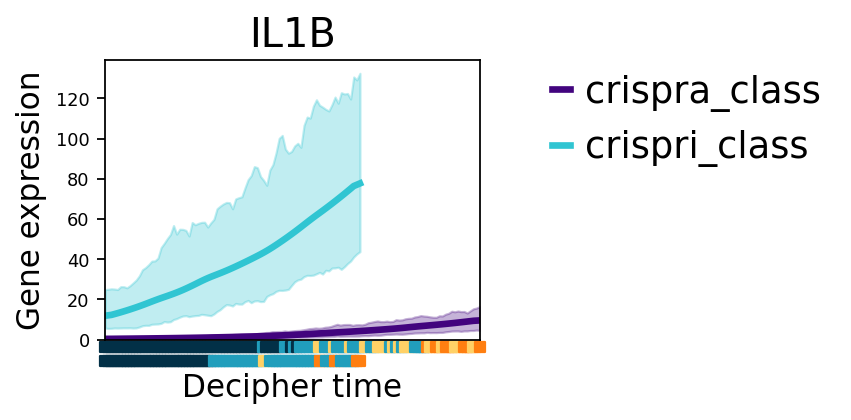

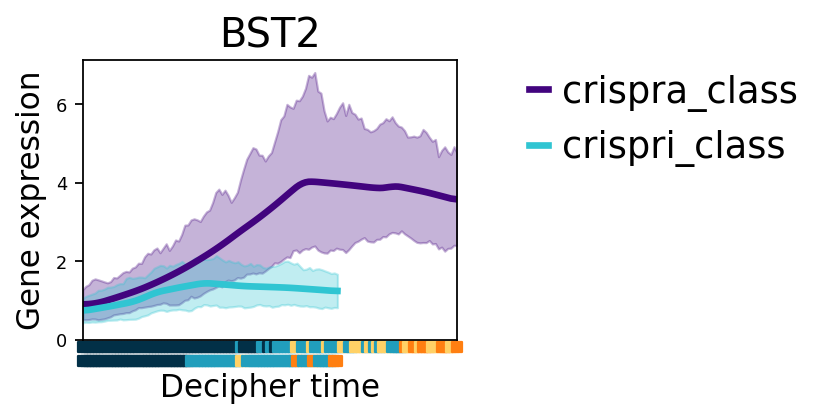

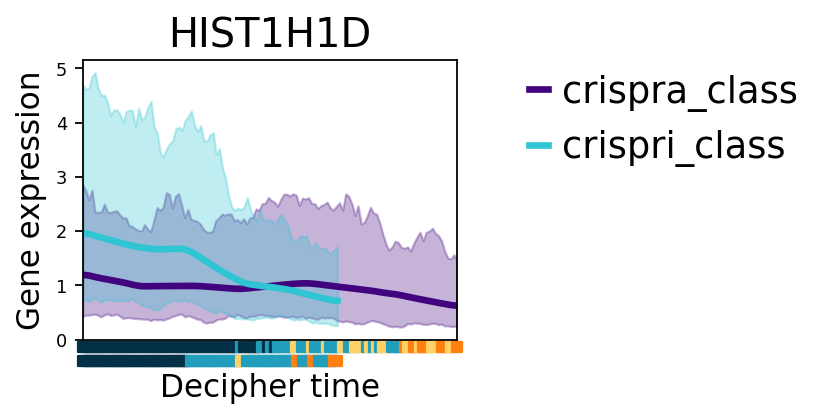

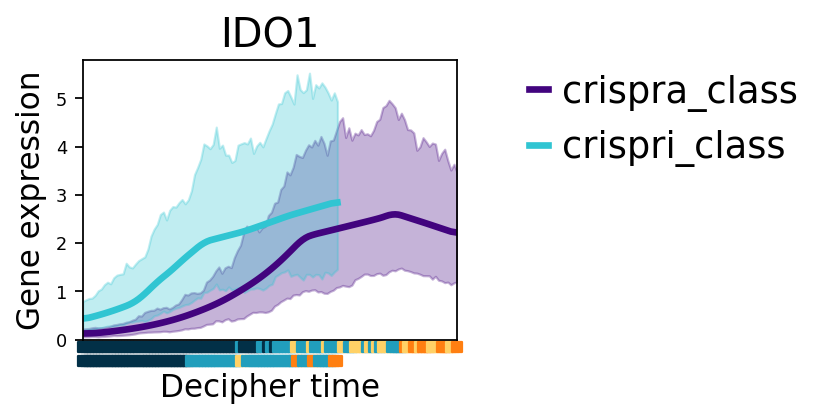

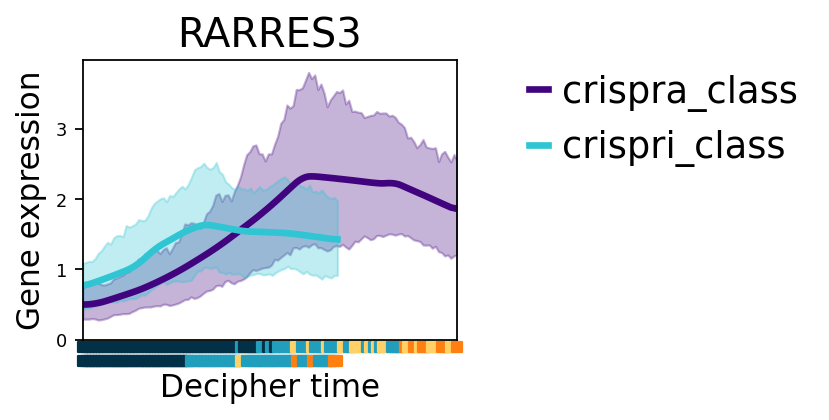

...

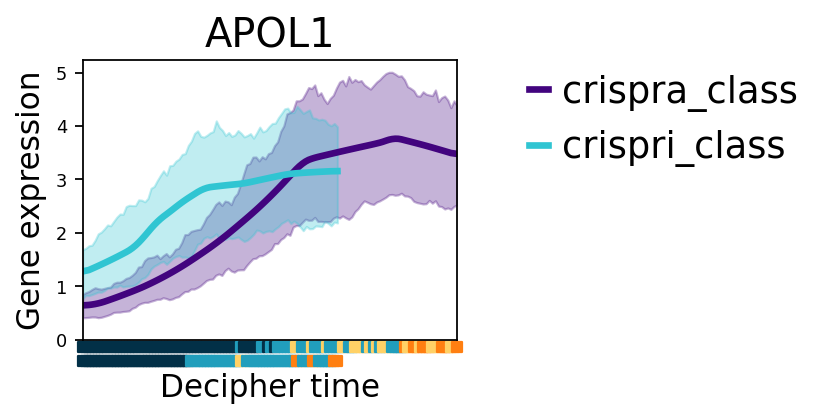

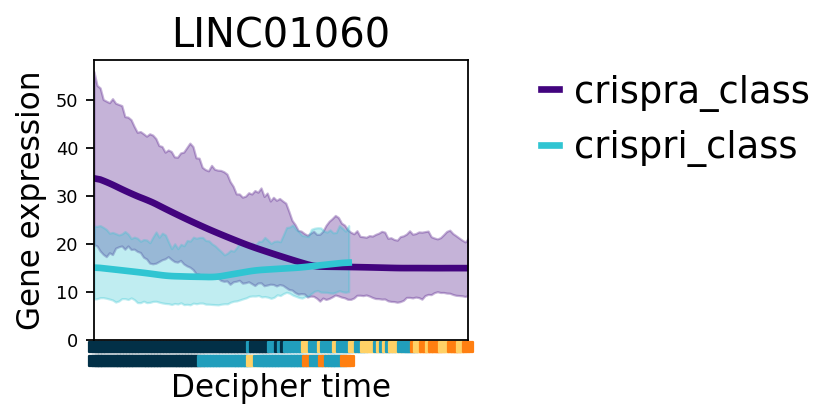

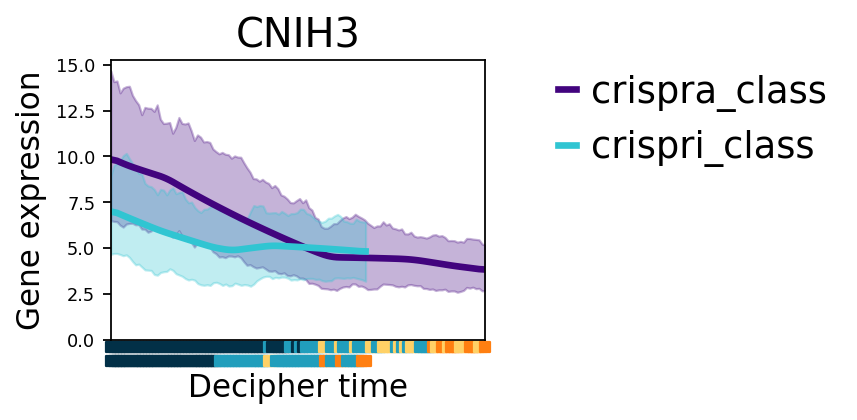

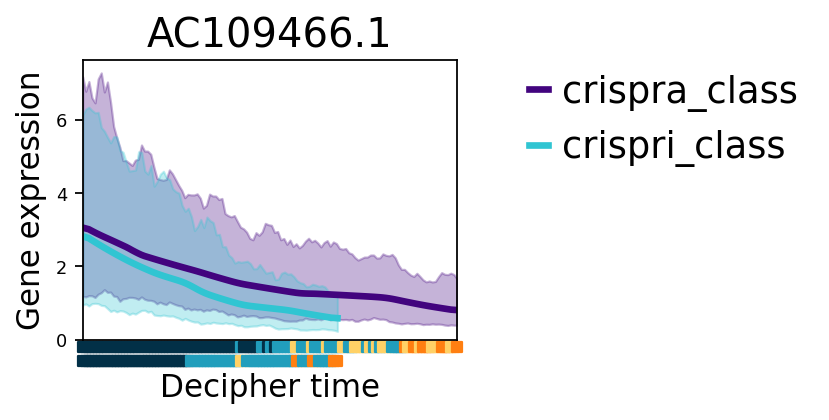

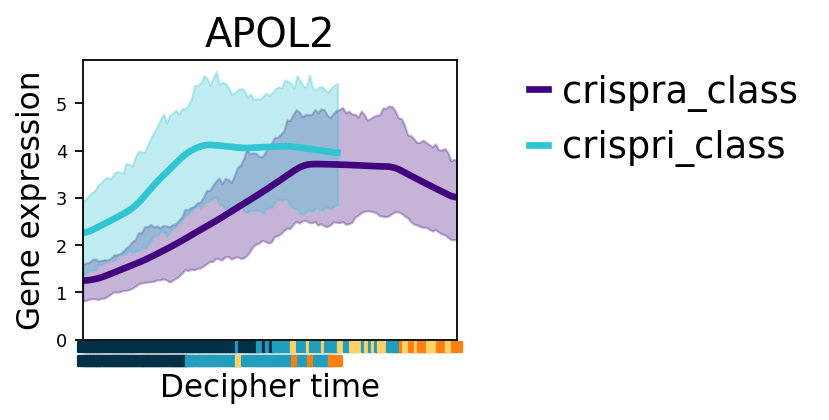

In [49]:

colors = {'Untreated' : '#023047','1to0.25':'#219EBC','1to0.5':'#FFD166','1to1' :'#FF7F11'}
for i in gene_list:
    print(i)
    dc.pl.gene_patterns(adata_concat, i, palette=combined_colors, cell_type_key="treatment")
    #plt.legend(loc='lower right', bbox_to_anchor=(3, 1))  # Change 'upper right' to your desired location
    plt.legend(loc='lower right', bbox_to_anchor=(2, 0.5), frameon = False)  # Adjust location as needed
    # Show the plot
    plt.savefig(f'{figures_dir}/'+ i + '_full_expression_plot.pdf',dpi = 300, bbox_inches='tight')
    plt.savefig(f'{figures_dir}/'+ i + '_full_expression_plot.png',dpi = 300, bbox_inches='tight')
    plt.savefig(f'{figures_dir}/'+ i + '_full_expression_plot.svg',dpi = 300, bbox_inches='tight')
    #plt.show()

In [50]:
def compare_two_perturbations(adata_concat, pert1, pert2):
    # Create a DataFrame with gene_id and perturbation
    gene_pert_df = pd.DataFrame({
        'gene_id': adata_concat.obs['gene_id'],
        'perturbation': adata_concat.obs['perturbation']
    })
    
    # Get genes for each perturbation
    genes_pert1 = set(gene_pert_df[gene_pert_df['perturbation'] == pert1]['gene_id'].unique())
    genes_pert2 = set(gene_pert_df[gene_pert_df['perturbation'] == pert2]['gene_id'].unique())
    
    # Find overlapping genes
    overlapping_genes = genes_pert1.intersection(genes_pert2)
    
    print(f"Found {len(overlapping_genes)} gene IDs present in both '{pert1}' and '{pert2}'")
    print(list(overlapping_genes))
    
    return list(overlapping_genes)

# Usage example (replace with your actual perturbation names)
overlap = compare_two_perturbations(adata_concat, "crispri", 'crispra')

Found 524 gene IDs present in both 'crispri' and 'crispra'
['TYK2', 'VRK3', 'TP53RK', 'MAP2K2', 'LATS1', 'LRRK1', 'MAP3K5', 'MYLK', 'FGR', 'EPHA7', 'PDGFRB', 'EIF2AK3', 'INSR', 'INSRR', 'MAP3K13', 'RPS6KL1', 'PIM1', 'CDK4', 'BLK', 'EIF2AK4', 'TYRO3', 'DYRK2', 'PLK5', 'BRAF', 'MAPK13', 'IRAK3', 'DAPK2', 'MARK3', 'IRAK1', 'FGFR4', 'HIPK3', 'PIM3', 'STK17B', 'CAMK2A', 'PRKG1', 'BMPR2', 'CSNK1G1', 'MET', 'CDC7', 'MTOR', 'BMPR1B', 'KIAA1804', 'RIOK3', 'BUB1B', 'AXL', 'random', 'PEAK1', 'ACVR1C', 'PLK3', 'ABL1', 'NEK10', 'CDK7', 'JAK1', 'DYRK1A', 'DCLK1', 'PDK1', 'NUAK2', 'SRPK3', 'PLK2', 'MAST4', 'EPHA1', 'NIM1', 'CLK3', 'STK3', 'HIPK4', 'PRKACG', 'PTK2', 'PRKD3', 'CDK17', 'PRPF4B', 'CAMK1D', 'MAPK4', 'NEK8', 'ADCK4', 'NEK2', 'CDKL4', 'DAPK1', 'MUSK', 'PIK3CD', 'PDK3', 'RPS6KB2', 'BCKDK', 'CLK4', 'PRKAA1', 'MAP3K11', 'CDK11A', 'RYK', 'PASK', 'CAMKK1', 'PIK3C2A', 'STK25', 'TLK2', 'LMTK3', 'MLKL', 'PRKACA', 'TAOK3', 'TRIM24', 'TRIM28', 'CDK9', 'ERBB4', 'CSNK1G3', 'ALK', 'MAP3K6', 'ACVR2B', 'T

In [51]:
# def add_cell_type_band(
#     adata, trajectory_name, cell_type_key, ax, palette, n_neighbors=50, offset=1
# ):
#     trajectory = adata.uns["decipher"]["trajectories"][trajectory_name]
#     if (
#         "cell_types" not in trajectory
#         or trajectory["cell_types"]["key"] != cell_type_key
#         or (trajectory["cell_types"]["n_neighbors"] != n_neighbors)
#     ):
#         knc = KNeighborsClassifier(n_neighbors=n_neighbors)
#         knc.fit(adata.obsm[trajectory["rep_key"]], adata.obs[cell_type_key])
#         cell_types = knc.predict(trajectory["points"])
#         trajectory["cell_types"] = {
#             "key": cell_type_key,
#             "n_neighbors": n_neighbors,
#             "values": cell_types,
#         }

#     times = trajectory["times"]
#     cell_types = trajectory["cell_types"]["values"]

#     if palette is None:
#         logging.info("No palette provided for the cell types, using default.")
#         ct = np.unique(cell_types)
#         palette = dict(zip(ct, sns.color_palette(n_colors=len(ct))))

#     plt.scatter(
#         times,
#         np.zeros(len(times)) - 0.05 * offset + 0.025,
#         c=[palette[c] for c in cell_types],
#         marker="s",
#         s=20,
#         transform=plt.gca().get_xaxis_transform(),
#         clip_on=False,
#         edgecolors=None,
#     )
#     ax.xaxis.labelpad = 5 + 5 * offset

In [52]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from scipy import stats
import numpy as np

# Your data setup
data = pd.DataFrame({
    'decipher_time': adata_concat.obs['decipher_time'],
    'gene_id': adata_concat.obs['gene_id'],
    'treatment_perturbation': adata_concat.obs['treatment_perturbation'],
    'perturbation': adata_concat.obs['perturbation'],
    'gene_id_perturbation': adata_concat.obs['gene_id'].astype(str) + '' + adata_concat.obs['perturbation'].astype(str)
})

# Filter for crispri only (or adjust as needed)
data_filtered = data[data['gene_id_perturbation'].str.contains('crispri')]

# Get NTC data once
ntc_data = data_filtered[data_filtered['gene_id'] == 'NTC']['decipher_time'].dropna()

# Get all unique gene_ids except NTC
all_genes = data_filtered['gene_id'].unique()
comparison_genes = [gene for gene in all_genes if gene != 'NTC']

print(f"Comparing {len(comparison_genes)} genes with NTC (n={len(ntc_data)})")
print("="*80)

# Store results
results_list = []

# Loop through each gene
for gene in comparison_genes:
    gene_data = data_filtered[data_filtered['gene_id'] == gene]['decipher_time'].dropna()
    
    if len(gene_data) > 0:  # Only proceed if there's data
        # KS test
        ks_stat, ks_pvalue = stats.ks_2samp(ntc_data, gene_data)
        
        # Mann-Whitney U test
        mw_stat, mw_pvalue = stats.mannwhitneyu(ntc_data, gene_data, alternative='two-sided')
        
        # Effect size (Cohen's d)
        def cohens_d(group1, group2):
            n1, n2 = len(group1), len(group2)
            if n1 > 1 and n2 > 1:
                pooled_std = np.sqrt(((n1-1)*group1.var() + (n2-1)*group2.var()) / (n1+n2-2))
                if pooled_std > 0:
                    return (group1.mean() - group2.mean()) / pooled_std
            return np.nan
        
        effect_size = cohens_d(ntc_data, gene_data)
        
        # Store results
        results_list.append({
            'gene_id': gene,
            'n_cells': len(gene_data),
            'mean_diff': gene_data.mean() - ntc_data.mean(),
            'ks_statistic': ks_stat,
            'ks_pvalue': ks_pvalue,
            'mw_statistic': mw_stat,
            'mw_pvalue': mw_pvalue,
            'cohens_d': effect_size,
            'significant_ks': ks_pvalue < 0.05,
            'significant_mw': mw_pvalue < 0.05
        })
        
        print(f"{gene:15s} (n={len(gene_data):4d}): KS p={ks_pvalue:.4f}, MW p={mw_pvalue:.4f}, Cohen's d={effect_size:.3f}")

# Convert to DataFrame for easier analysis
results_df = pd.DataFrame(results_list)

print("\n" + "="*80)
print("SUMMARY:")
print(f"Total genes tested: {len(results_df)}")
print(f"Significant by KS test: {results_df['significant_ks'].sum()}")
print(f"Significant by MW test: {results_df['significant_mw'].sum()}")

# Sort by p-value to see most significant
print(f"\nTop 10 most significant (by KS test):")
top_significant = results_df.sort_values('ks_pvalue').head(10)
print(top_significant[['gene_id', 'n_cells', 'ks_pvalue', 'mw_pvalue', 'cohens_d']].to_string(index=False))

Comparing 523 genes with NTC (n=891)
STK35           (n=  81): KS p=0.0116, MW p=0.0512, Cohen's d=-0.251
TRIB1           (n= 111): KS p=0.9967, MW p=0.9947, Cohen's d=0.018
MAP3K11         (n= 152): KS p=0.3548, MW p=0.5674, Cohen's d=0.079
ACVR2B          (n=  78): KS p=0.9877, MW p=0.8859, Cohen's d=0.049
MAP2K1          (n=  99): KS p=0.6904, MW p=0.4767, Cohen's d=0.088
PIK3C2G         (n=  72): KS p=0.7871, MW p=0.6009, Cohen's d=-0.048
GRK6            (n=  53): KS p=0.0581, MW p=0.0549, Cohen's d=0.288
DYRK4           (n=  98): KS p=0.9192, MW p=0.9060, Cohen's d=0.013
MAPK7           (n= 159): KS p=0.9913, MW p=0.9363, Cohen's d=0.014
SPEG            (n= 154): KS p=0.4999, MW p=0.2826, Cohen's d=0.102
GRK1            (n=  57): KS p=0.9618, MW p=0.8543, Cohen's d=-0.018
FRK             (n=  78): KS p=0.0616, MW p=0.2606, Cohen's d=-0.190
CDK6            (n= 160): KS p=0.9988, MW p=0.9981, Cohen's d=0.007
PDK2            (n= 140): KS p=0.7815, MW p=0.9697, Cohen's d=0.035
MYLK2  

In [53]:
significant_genes = results_df[results_df['significant_ks'] | results_df['significant_mw']]
significant_genes_crispri = significant_genes
significant_genes_crispri.to_csv(f'{figures_dir}/significant_genes_crispri.csv', index=False)

In [54]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from scipy import stats
import numpy as np

# Your data setup
data = pd.DataFrame({
    'decipher_time': adata_concat.obs['decipher_time'],
    'gene_id': adata_concat.obs['gene_id'],
    'treatment_perturbation': adata_concat.obs['treatment_perturbation'],
    'perturbation': adata_concat.obs['perturbation'],
    'gene_id_perturbation': adata_concat.obs['gene_id'].astype(str) + '' + adata_concat.obs['perturbation'].astype(str)
})

# Filter for crispri only (or adjust as needed)
data_filtered = data[data['gene_id_perturbation'].str.contains('crispra')]

# Get NTC data once
ntc_data = data_filtered[data_filtered['gene_id'] == 'NTC']['decipher_time'].dropna()

# Get all unique gene_ids except NTC
all_genes = data_filtered['gene_id'].unique()
comparison_genes = [gene for gene in all_genes if gene != 'NTC']

print(f"Comparing {len(comparison_genes)} genes with NTC (n={len(ntc_data)})")
print("="*80)

# Store results
results_list = []

# Loop through each gene
for gene in comparison_genes:
    gene_data = data_filtered[data_filtered['gene_id'] == gene]['decipher_time'].dropna()
    
    if len(gene_data) > 0:  # Only proceed if there's data
        # KS test
        ks_stat, ks_pvalue = stats.ks_2samp(ntc_data, gene_data)
        
        # Mann-Whitney U test
        mw_stat, mw_pvalue = stats.mannwhitneyu(ntc_data, gene_data, alternative='two-sided')
        
        # Effect size (Cohen's d)
        def cohens_d(group1, group2):
            n1, n2 = len(group1), len(group2)
            if n1 > 1 and n2 > 1:
                pooled_std = np.sqrt(((n1-1)*group1.var() + (n2-1)*group2.var()) / (n1+n2-2))
                if pooled_std > 0:
                    return (group1.mean() - group2.mean()) / pooled_std
            return np.nan
        
        effect_size = cohens_d(ntc_data, gene_data)
        
        # Store results
        results_list.append({
            'gene_id': gene,
            'n_cells': len(gene_data),
            'mean_diff': gene_data.mean() - ntc_data.mean(),
            'ks_statistic': ks_stat,
            'ks_pvalue': ks_pvalue,
            'mw_statistic': mw_stat,
            'mw_pvalue': mw_pvalue,
            'cohens_d': effect_size,
            'significant_ks': ks_pvalue < 0.05,
            'significant_mw': mw_pvalue < 0.05
        })
        
        print(f"{gene:15s} (n={len(gene_data):4d}): KS p={ks_pvalue:.4f}, MW p={mw_pvalue:.4f}, Cohen's d={effect_size:.3f}")

# Convert to DataFrame for easier analysis
results_df = pd.DataFrame(results_list)

print("\n" + "="*80)
print("SUMMARY:")
print(f"Total genes tested: {len(results_df)}")
print(f"Significant by KS test: {results_df['significant_ks'].sum()}")
print(f"Significant by MW test: {results_df['significant_mw'].sum()}")

# Sort by p-value to see most significant
print(f"\nTop 10 most significant (by KS test):")
top_significant = results_df.sort_values('ks_pvalue').head(10)
print(top_significant[['gene_id', 'n_cells', 'ks_pvalue', 'mw_pvalue', 'cohens_d']].to_string(index=False))

Comparing 523 genes with NTC (n=8291)
TAF1            (n=  94): KS p=0.2988, MW p=0.3490, Cohen's d=0.097
random          (n= 349): KS p=0.9530, MW p=0.6375, Cohen's d=0.006
CDK6            (n= 260): KS p=0.3404, MW p=0.6707, Cohen's d=-0.042
RET             (n= 364): KS p=0.9613, MW p=0.7760, Cohen's d=-0.030
MAPK8           (n= 160): KS p=0.4179, MW p=0.1140, Cohen's d=0.119
BMPR1A          (n= 109): KS p=0.1130, MW p=0.1284, Cohen's d=-0.167
ACVRL1          (n= 160): KS p=0.8419, MW p=0.4279, Cohen's d=0.055
LRRK1           (n= 188): KS p=0.6798, MW p=0.3712, Cohen's d=-0.082
ABL2            (n= 227): KS p=0.4815, MW p=0.3152, Cohen's d=0.069
NEK2            (n= 167): KS p=0.4029, MW p=0.2845, Cohen's d=-0.052
TEC             (n=  81): KS p=0.9860, MW p=0.9594, Cohen's d=0.005
CDC7            (n=  87): KS p=0.0795, MW p=0.0582, Cohen's d=0.140
CDKL3           (n= 281): KS p=0.6969, MW p=0.3839, Cohen's d=-0.054
PAK6            (n= 287): KS p=0.5185, MW p=0.3453, Cohen's d=0.057
TEK 

In [55]:
significant_genes = results_df[results_df['significant_ks'] | results_df['significant_mw']]
significant_genes_crispra = significant_genes

In [56]:
significant_genes_crispra.to_csv(f'{figures_dir}/significant_genes_crispra.csv', index=False)

In [57]:
combined_genes = set(significant_genes_crispri['gene_id']).union(set(significant_genes_crispra['gene_id']))

# Convert the combined set back to a list if needed
combined_genes_list = list(combined_genes)

print(f"Total unique genes: {len(combined_genes_list)}")
print(combined_genes_list)

Total unique genes: 70
['CDC42BPG', 'STYK1', 'CAMKV', 'SRPK3', 'FES', 'MAST4', 'LATS2', 'PLK1', 'RPS6KA5', 'PAK1', 'STK36', 'MAP4K5', 'SRPK1', 'MYLK', 'STK40', 'LMTK3', 'NLK', 'IRAK1', 'STK32A', 'SBK1', 'EPHA10', 'ULK3', 'STK17B', 'ITK', 'GRK7', 'GAK', 'ULK2', 'MAPKAPK5', 'SNRK', 'PINK1', 'PRKD3', 'EPHA2', 'IGF1R', 'AKT1', 'TSSK4', 'PRKG2', 'GSK3A', 'STK38L', 'PIK3CB', 'IRAK4', 'MAPKAPK2', 'MET', 'MAP4K2', 'LIMK1', 'CDC7', 'TLK1', 'MTOR', 'KIAA1804', 'MAPK10', 'AATK', 'STK32B', 'CASK', 'PIM1', 'AURKB', 'NEK9', 'MAPK6', 'ATR', 'MKNK1', 'PLK3', 'CDK11A', 'DCLK1', 'SGK494', 'ROR2', 'CDC42BPA', 'SYK', 'RIOK1', 'STK35', 'CAMKK1', 'PDGFRA', 'NTRK3']


In [58]:
# Compare states
from sklearn.neighbors import KNeighborsClassifier

data = pd.DataFrame({
    'decipher_time': adata_concat.obs['decipher_time'],
    'gene_id': adata_concat.obs['gene_id'],
    'treatment_perturbation': adata_concat.obs['treatment_perturbation'],
    'perturbation': adata_concat.obs['perturbation'],
    'gene_id_perturbation': adata_concat.obs['gene_id'].astype(str) + '_' + adata_concat.obs['perturbation'].astype(str)
    })

# If you want to filter for specific gene_ids
# Convert categorical columns to string before concatenation


In [59]:
def add_cell_type_band(
    adata, trajectory_name, cell_type_key, ax, palette, n_neighbors=50, offset=1
):
    trajectory = adata.uns["decipher"]["trajectories"][trajectory_name]
    if (
        "cell_types" not in trajectory
        or trajectory["cell_types"]["key"] != cell_type_key
        or (trajectory["cell_types"]["n_neighbors"] != n_neighbors)
    ):
        knc = KNeighborsClassifier(n_neighbors=n_neighbors)
        knc.fit(adata.obsm[trajectory["rep_key"]], adata.obs[cell_type_key])
        cell_types = knc.predict(trajectory["points"])
        trajectory["cell_types"] = {
            "key": cell_type_key,
            "n_neighbors": n_neighbors,
            "values": cell_types,
        }
    times = trajectory["times"]
    cell_types = trajectory["cell_types"]["values"]
    if palette is None:
        logging.info("No palette provided for the cell types, using default.")
        ct = np.unique(cell_types)
        palette = dict(zip(ct, sns.color_palette(n_colors=len(ct))))
    
    # Fixed: Use ax.scatter() instead of plt.scatter() and ax.get_xaxis_transform()
    ax.scatter(
        times,
        np.zeros(len(times)) - 0.05 * offset + 0.025,
        c=[palette[c] for c in cell_types],
        marker="s",
        s=20,
        transform=ax.get_xaxis_transform(),  # Use the passed ax parameter
        clip_on=False,
        edgecolors=None,
    )
    ax.xaxis.labelpad = 5 + 5 * offset

In [60]:
crispr_colors

{'crispri': '#30C5D2', 'crispra': '#42047e'}

In [61]:
crispr_colors['crispri']

'#30C5D2'

Added crispri_class to axes[0] for crispri
Added crispra_class to axes[1] for crispra


2026-02-13 18:43:54,248 | INFO : maxp pruned
2026-02-13 18:43:54,252 | INFO : cmap pruned
2026-02-13 18:43:54,252 | INFO : kern dropped
2026-02-13 18:43:54,253 | INFO : post pruned
2026-02-13 18:43:54,253 | INFO : FFTM dropped
2026-02-13 18:43:54,254 | INFO : GPOS pruned
2026-02-13 18:43:54,255 | INFO : GSUB pruned
2026-02-13 18:43:54,258 | INFO : glyf pruned
2026-02-13 18:43:54,258 | INFO : Added gid0 to subset
2026-02-13 18:43:54,258 | INFO : Added first four glyphs to subset
2026-02-13 18:43:54,258 | INFO : Closing glyph list over 'GSUB': 34 glyphs before
2026-02-13 18:43:54,258 | INFO : Glyph names: ['.notdef', '.null', 'B', 'C', 'D', 'G', 'N', 'P', 'T', 'a', 'b', 'c', 'colon', 'e', 'five', 'four', 'h', 'i', 'm', 'n', 'nonmarkingreturn', 'o', 'one', 'p', 'period', 'r', 's', 'space', 't', 'two', 'u', 'underscore', 'y', 'zero']
2026-02-13 18:43:54,259 | INFO : Glyph IDs:   [0, 1, 2, 3, 17, 19, 20, 21, 23, 24, 29, 37, 38, 39, 42, 49, 51, 55, 66, 68, 69, 70, 72, 75, 76, 80, 81, 82, 83,

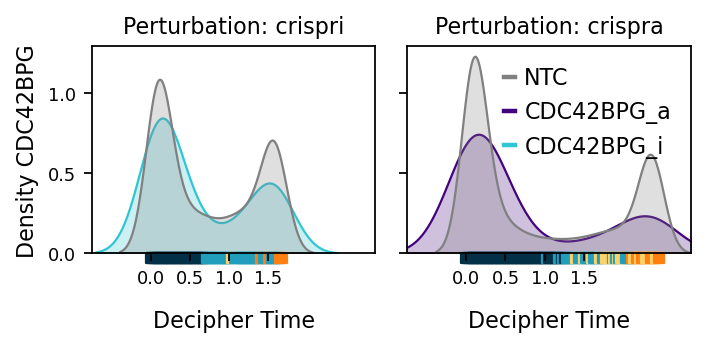

2026-02-13 18:43:54,533 | INFO : maxp pruned
2026-02-13 18:43:54,536 | INFO : cmap pruned
2026-02-13 18:43:54,537 | INFO : kern dropped
2026-02-13 18:43:54,537 | INFO : post pruned
2026-02-13 18:43:54,537 | INFO : FFTM dropped
2026-02-13 18:43:54,538 | INFO : GPOS pruned
2026-02-13 18:43:54,539 | INFO : GSUB pruned
2026-02-13 18:43:54,542 | INFO : glyf pruned
2026-02-13 18:43:54,542 | INFO : Added gid0 to subset
2026-02-13 18:43:54,542 | INFO : Added first four glyphs to subset
2026-02-13 18:43:54,542 | INFO : Closing glyph list over 'GSUB': 33 glyphs before
2026-02-13 18:43:54,542 | INFO : Glyph names: ['.notdef', '.null', 'C', 'D', 'K', 'N', 'P', 'S', 'T', 'Y', 'a', 'b', 'c', 'colon', 'e', 'five', 'h', 'i', 'm', 'n', 'nonmarkingreturn', 'o', 'one', 'p', 'period', 'r', 's', 'space', 't', 'u', 'underscore', 'y', 'zero']
2026-02-13 18:43:54,543 | INFO : Glyph IDs:   [0, 1, 2, 3, 17, 19, 20, 24, 29, 38, 39, 46, 49, 51, 54, 55, 60, 66, 68, 69, 70, 72, 75, 76, 80, 81, 82, 83, 85, 86, 87, 8

Added crispri_class to axes[0] for crispri
Added crispra_class to axes[1] for crispra


2026-02-13 18:43:54,900 | INFO : GSUB subsetted
2026-02-13 18:43:54,900 | INFO : name subsetting not needed
2026-02-13 18:43:54,901 | INFO : glyf subsetted
2026-02-13 18:43:54,901 | INFO : head pruned
2026-02-13 18:43:54,902 | INFO : OS/2 Unicode ranges pruned: [0]
2026-02-13 18:43:54,902 | INFO : OS/2 CodePage ranges pruned: [0]
2026-02-13 18:43:54,902 | INFO : glyf pruned
2026-02-13 18:43:54,902 | INFO : GDEF pruned
2026-02-13 18:43:54,902 | INFO : GPOS pruned
2026-02-13 18:43:54,903 | INFO : GSUB pruned
2026-02-13 18:43:54,904 | INFO : name pruned


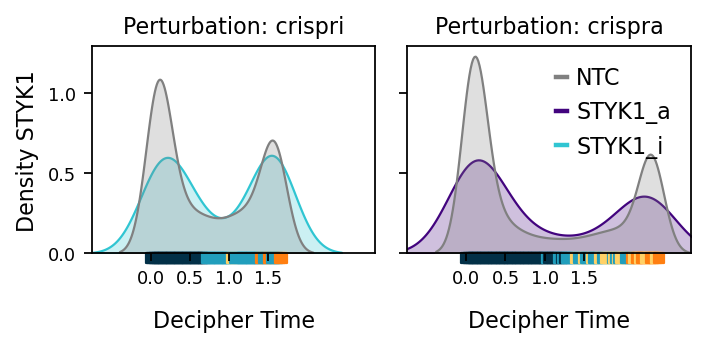

2026-02-13 18:43:55,187 | INFO : maxp pruned
2026-02-13 18:43:55,190 | INFO : cmap pruned
2026-02-13 18:43:55,190 | INFO : kern dropped
2026-02-13 18:43:55,191 | INFO : post pruned
2026-02-13 18:43:55,191 | INFO : FFTM dropped
2026-02-13 18:43:55,191 | INFO : GPOS pruned
2026-02-13 18:43:55,193 | INFO : GSUB pruned
2026-02-13 18:43:55,195 | INFO : glyf pruned
2026-02-13 18:43:55,196 | INFO : Added gid0 to subset
2026-02-13 18:43:55,196 | INFO : Added first four glyphs to subset
2026-02-13 18:43:55,196 | INFO : Closing glyph list over 'GSUB': 34 glyphs before
2026-02-13 18:43:55,196 | INFO : Glyph names: ['.notdef', '.null', 'A', 'C', 'D', 'K', 'M', 'N', 'P', 'T', 'V', 'a', 'b', 'c', 'colon', 'e', 'five', 'h', 'i', 'm', 'n', 'nonmarkingreturn', 'o', 'one', 'p', 'period', 'r', 's', 'space', 't', 'u', 'underscore', 'y', 'zero']
2026-02-13 18:43:55,196 | INFO : Glyph IDs:   [0, 1, 2, 3, 17, 19, 20, 24, 29, 36, 38, 39, 46, 48, 49, 51, 55, 57, 66, 68, 69, 70, 72, 75, 76, 80, 81, 82, 83, 85, 

Added crispri_class to axes[0] for crispri
Added crispra_class to axes[1] for crispra


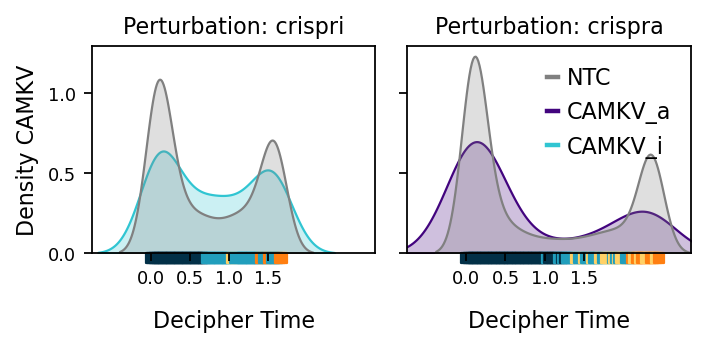

2026-02-13 18:43:55,500 | INFO : maxp pruned
2026-02-13 18:43:55,504 | INFO : cmap pruned
2026-02-13 18:43:55,504 | INFO : kern dropped
2026-02-13 18:43:55,504 | INFO : post pruned
2026-02-13 18:43:55,504 | INFO : FFTM dropped
2026-02-13 18:43:55,505 | INFO : GPOS pruned
2026-02-13 18:43:55,506 | INFO : GSUB pruned
2026-02-13 18:43:55,509 | INFO : glyf pruned
2026-02-13 18:43:55,509 | INFO : Added gid0 to subset
2026-02-13 18:43:55,510 | INFO : Added first four glyphs to subset
2026-02-13 18:43:55,510 | INFO : Closing glyph list over 'GSUB': 34 glyphs before
2026-02-13 18:43:55,510 | INFO : Glyph names: ['.notdef', '.null', 'C', 'D', 'K', 'N', 'P', 'R', 'S', 'T', 'a', 'b', 'c', 'colon', 'e', 'five', 'h', 'i', 'm', 'n', 'nonmarkingreturn', 'o', 'one', 'p', 'period', 'r', 's', 'space', 't', 'three', 'u', 'underscore', 'y', 'zero']
2026-02-13 18:43:55,510 | INFO : Glyph IDs:   [0, 1, 2, 3, 17, 19, 20, 22, 24, 29, 38, 39, 46, 49, 51, 53, 54, 55, 66, 68, 69, 70, 72, 75, 76, 80, 81, 82, 83, 

Added crispri_class to axes[0] for crispri
Added crispra_class to axes[1] for crispra


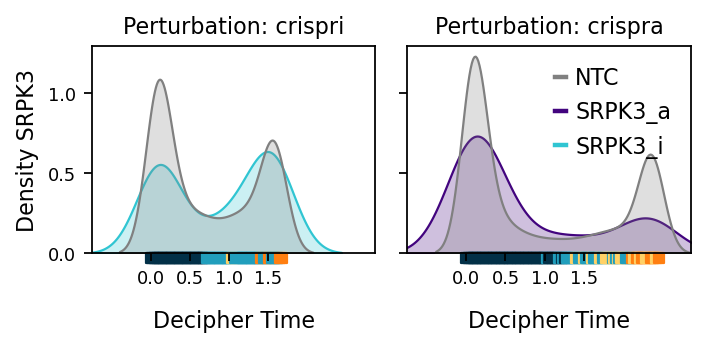

2026-02-13 18:43:55,793 | INFO : maxp pruned
2026-02-13 18:43:55,796 | INFO : cmap pruned
2026-02-13 18:43:55,796 | INFO : kern dropped
2026-02-13 18:43:55,797 | INFO : post pruned
2026-02-13 18:43:55,797 | INFO : FFTM dropped
2026-02-13 18:43:55,798 | INFO : GPOS pruned
2026-02-13 18:43:55,799 | INFO : GSUB pruned
2026-02-13 18:43:55,801 | INFO : glyf pruned
2026-02-13 18:43:55,802 | INFO : Added gid0 to subset
2026-02-13 18:43:55,802 | INFO : Added first four glyphs to subset
2026-02-13 18:43:55,802 | INFO : Closing glyph list over 'GSUB': 33 glyphs before
2026-02-13 18:43:55,802 | INFO : Glyph names: ['.notdef', '.null', 'C', 'D', 'E', 'F', 'N', 'P', 'S', 'T', 'a', 'b', 'c', 'colon', 'e', 'five', 'h', 'i', 'm', 'n', 'nonmarkingreturn', 'o', 'one', 'p', 'period', 'r', 's', 'space', 't', 'u', 'underscore', 'y', 'zero']
2026-02-13 18:43:55,803 | INFO : Glyph IDs:   [0, 1, 2, 3, 17, 19, 20, 24, 29, 38, 39, 40, 41, 49, 51, 54, 55, 66, 68, 69, 70, 72, 75, 76, 80, 81, 82, 83, 85, 86, 87, 8

Added crispri_class to axes[0] for crispri
Added crispra_class to axes[1] for crispra


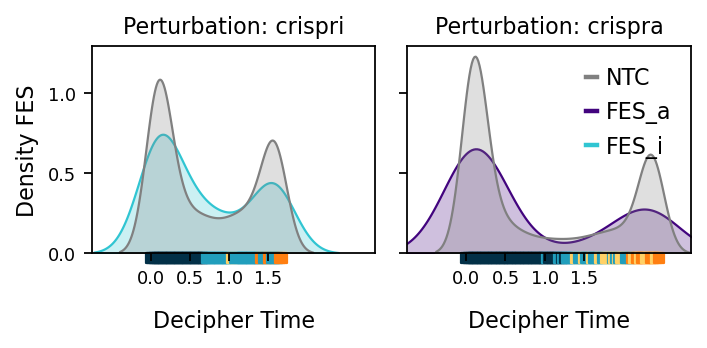

2026-02-13 18:43:56,077 | INFO : maxp pruned
2026-02-13 18:43:56,081 | INFO : cmap pruned
2026-02-13 18:43:56,081 | INFO : kern dropped
2026-02-13 18:43:56,081 | INFO : post pruned
2026-02-13 18:43:56,081 | INFO : FFTM dropped
2026-02-13 18:43:56,082 | INFO : GPOS pruned
2026-02-13 18:43:56,083 | INFO : GSUB pruned
2026-02-13 18:43:56,086 | INFO : glyf pruned
2026-02-13 18:43:56,086 | INFO : Added gid0 to subset
2026-02-13 18:43:56,086 | INFO : Added first four glyphs to subset
2026-02-13 18:43:56,086 | INFO : Closing glyph list over 'GSUB': 34 glyphs before
2026-02-13 18:43:56,086 | INFO : Glyph names: ['.notdef', '.null', 'A', 'C', 'D', 'M', 'N', 'P', 'S', 'T', 'a', 'b', 'c', 'colon', 'e', 'five', 'four', 'h', 'i', 'm', 'n', 'nonmarkingreturn', 'o', 'one', 'p', 'period', 'r', 's', 'space', 't', 'u', 'underscore', 'y', 'zero']
2026-02-13 18:43:56,087 | INFO : Glyph IDs:   [0, 1, 2, 3, 17, 19, 20, 23, 24, 29, 36, 38, 39, 48, 49, 51, 54, 55, 66, 68, 69, 70, 72, 75, 76, 80, 81, 82, 83, 8

Added crispri_class to axes[0] for crispri
Added crispra_class to axes[1] for crispra


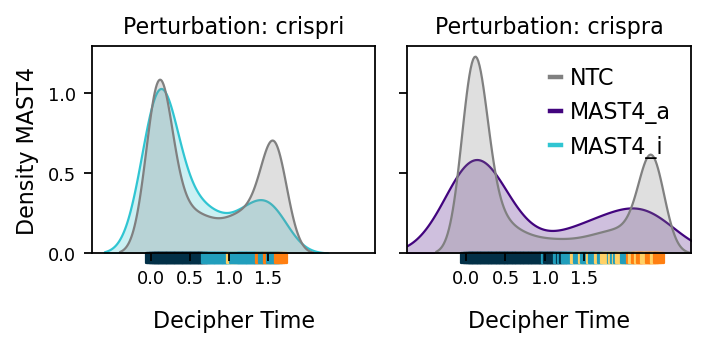

2026-02-13 18:43:56,354 | INFO : maxp pruned
2026-02-13 18:43:56,358 | INFO : cmap pruned
2026-02-13 18:43:56,359 | INFO : kern dropped
2026-02-13 18:43:56,359 | INFO : post pruned
2026-02-13 18:43:56,359 | INFO : FFTM dropped
2026-02-13 18:43:56,360 | INFO : GPOS pruned
2026-02-13 18:43:56,361 | INFO : GSUB pruned
2026-02-13 18:43:56,364 | INFO : glyf pruned
2026-02-13 18:43:56,364 | INFO : Added gid0 to subset
2026-02-13 18:43:56,365 | INFO : Added first four glyphs to subset
2026-02-13 18:43:56,365 | INFO : Closing glyph list over 'GSUB': 34 glyphs before
2026-02-13 18:43:56,365 | INFO : Glyph names: ['.notdef', '.null', 'A', 'C', 'D', 'L', 'N', 'P', 'S', 'T', 'a', 'b', 'c', 'colon', 'e', 'five', 'h', 'i', 'm', 'n', 'nonmarkingreturn', 'o', 'one', 'p', 'period', 'r', 's', 'space', 't', 'two', 'u', 'underscore', 'y', 'zero']
2026-02-13 18:43:56,366 | INFO : Glyph IDs:   [0, 1, 2, 3, 17, 19, 20, 21, 24, 29, 36, 38, 39, 47, 49, 51, 54, 55, 66, 68, 69, 70, 72, 75, 76, 80, 81, 82, 83, 85

Added crispri_class to axes[0] for crispri
Added crispra_class to axes[1] for crispra


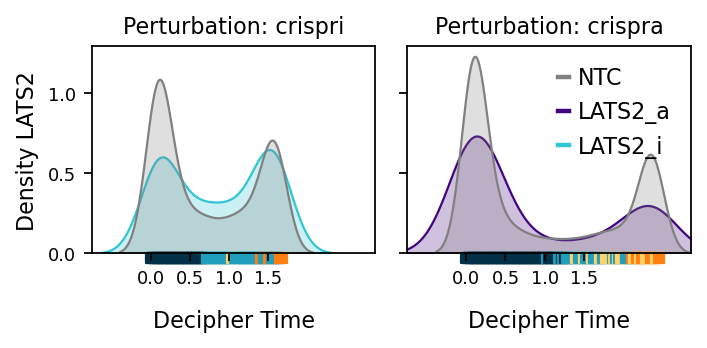

2026-02-13 18:43:56,656 | INFO : maxp pruned
2026-02-13 18:43:56,660 | INFO : cmap pruned
2026-02-13 18:43:56,660 | INFO : kern dropped
2026-02-13 18:43:56,660 | INFO : post pruned
2026-02-13 18:43:56,660 | INFO : FFTM dropped
2026-02-13 18:43:56,661 | INFO : GPOS pruned
2026-02-13 18:43:56,662 | INFO : GSUB pruned
2026-02-13 18:43:56,665 | INFO : glyf pruned
2026-02-13 18:43:56,666 | INFO : Added gid0 to subset
2026-02-13 18:43:56,666 | INFO : Added first four glyphs to subset
2026-02-13 18:43:56,666 | INFO : Closing glyph list over 'GSUB': 32 glyphs before
2026-02-13 18:43:56,666 | INFO : Glyph names: ['.notdef', '.null', 'C', 'D', 'K', 'L', 'N', 'P', 'T', 'a', 'b', 'c', 'colon', 'e', 'five', 'h', 'i', 'm', 'n', 'nonmarkingreturn', 'o', 'one', 'p', 'period', 'r', 's', 'space', 't', 'u', 'underscore', 'y', 'zero']
2026-02-13 18:43:56,667 | INFO : Glyph IDs:   [0, 1, 2, 3, 17, 19, 20, 24, 29, 38, 39, 46, 47, 49, 51, 55, 66, 68, 69, 70, 72, 75, 76, 80, 81, 82, 83, 85, 86, 87, 88, 92]
20

Added crispri_class to axes[0] for crispri
Added crispra_class to axes[1] for crispra


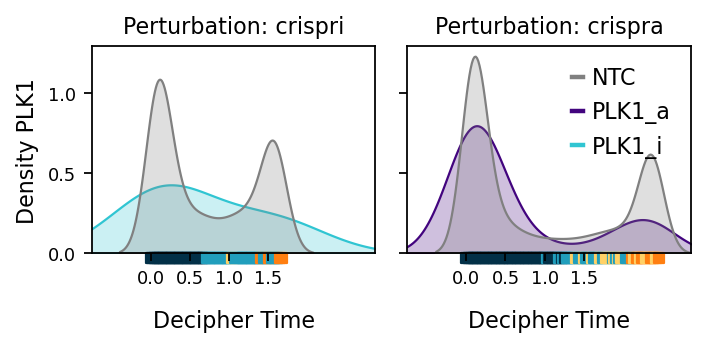

2026-02-13 18:43:56,943 | INFO : maxp pruned
2026-02-13 18:43:56,947 | INFO : cmap pruned
2026-02-13 18:43:56,947 | INFO : kern dropped
2026-02-13 18:43:56,947 | INFO : post pruned
2026-02-13 18:43:56,947 | INFO : FFTM dropped
2026-02-13 18:43:56,948 | INFO : GPOS pruned
2026-02-13 18:43:56,949 | INFO : GSUB pruned
2026-02-13 18:43:56,952 | INFO : glyf pruned
2026-02-13 18:43:56,953 | INFO : Added gid0 to subset
2026-02-13 18:43:56,953 | INFO : Added first four glyphs to subset
2026-02-13 18:43:56,953 | INFO : Closing glyph list over 'GSUB': 35 glyphs before
2026-02-13 18:43:56,953 | INFO : Glyph names: ['.notdef', '.null', 'A', 'C', 'D', 'K', 'N', 'P', 'R', 'S', 'T', 'a', 'b', 'c', 'colon', 'e', 'five', 'h', 'i', 'm', 'n', 'nonmarkingreturn', 'o', 'one', 'p', 'period', 'r', 's', 'six', 'space', 't', 'u', 'underscore', 'y', 'zero']
2026-02-13 18:43:56,954 | INFO : Glyph IDs:   [0, 1, 2, 3, 17, 19, 20, 24, 25, 29, 36, 38, 39, 46, 49, 51, 53, 54, 55, 66, 68, 69, 70, 72, 75, 76, 80, 81, 8

Added crispri_class to axes[0] for crispri
Added crispra_class to axes[1] for crispra


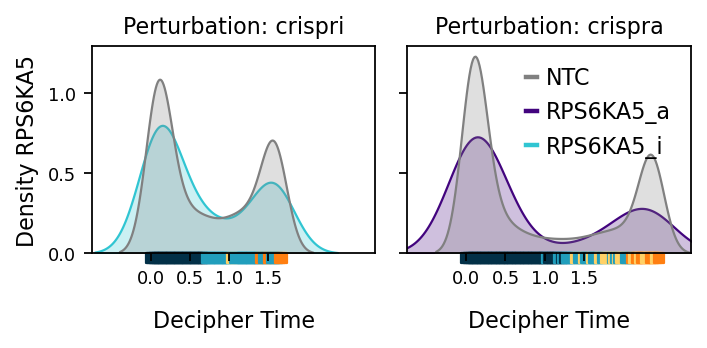

2026-02-13 18:43:57,229 | INFO : maxp pruned
2026-02-13 18:43:57,233 | INFO : cmap pruned
2026-02-13 18:43:57,233 | INFO : kern dropped
2026-02-13 18:43:57,233 | INFO : post pruned
2026-02-13 18:43:57,234 | INFO : FFTM dropped
2026-02-13 18:43:57,234 | INFO : GPOS pruned
2026-02-13 18:43:57,236 | INFO : GSUB pruned
2026-02-13 18:43:57,239 | INFO : glyf pruned
2026-02-13 18:43:57,239 | INFO : Added gid0 to subset
2026-02-13 18:43:57,239 | INFO : Added first four glyphs to subset
2026-02-13 18:43:57,239 | INFO : Closing glyph list over 'GSUB': 32 glyphs before
2026-02-13 18:43:57,239 | INFO : Glyph names: ['.notdef', '.null', 'A', 'C', 'D', 'K', 'N', 'P', 'T', 'a', 'b', 'c', 'colon', 'e', 'five', 'h', 'i', 'm', 'n', 'nonmarkingreturn', 'o', 'one', 'p', 'period', 'r', 's', 'space', 't', 'u', 'underscore', 'y', 'zero']
2026-02-13 18:43:57,240 | INFO : Glyph IDs:   [0, 1, 2, 3, 17, 19, 20, 24, 29, 36, 38, 39, 46, 49, 51, 55, 66, 68, 69, 70, 72, 75, 76, 80, 81, 82, 83, 85, 86, 87, 88, 92]
20

Added crispri_class to axes[0] for crispri
Added crispra_class to axes[1] for crispra


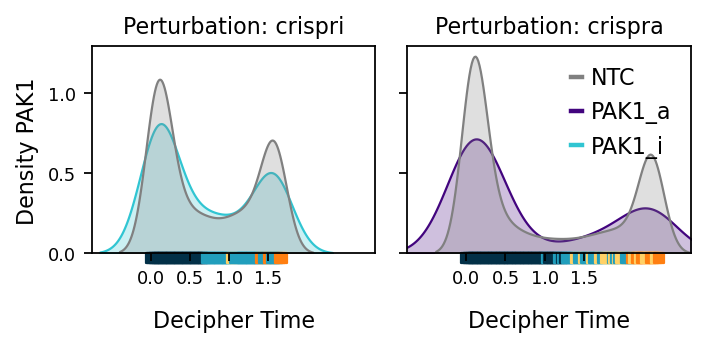

2026-02-13 18:43:57,507 | INFO : maxp pruned
2026-02-13 18:43:57,511 | INFO : cmap pruned
2026-02-13 18:43:57,511 | INFO : kern dropped
2026-02-13 18:43:57,511 | INFO : post pruned
2026-02-13 18:43:57,511 | INFO : FFTM dropped
2026-02-13 18:43:57,512 | INFO : GPOS pruned
2026-02-13 18:43:57,513 | INFO : GSUB pruned
2026-02-13 18:43:57,516 | INFO : glyf pruned
2026-02-13 18:43:57,517 | INFO : Added gid0 to subset
2026-02-13 18:43:57,517 | INFO : Added first four glyphs to subset
2026-02-13 18:43:57,517 | INFO : Closing glyph list over 'GSUB': 34 glyphs before
2026-02-13 18:43:57,517 | INFO : Glyph names: ['.notdef', '.null', 'C', 'D', 'K', 'N', 'P', 'S', 'T', 'a', 'b', 'c', 'colon', 'e', 'five', 'h', 'i', 'm', 'n', 'nonmarkingreturn', 'o', 'one', 'p', 'period', 'r', 's', 'six', 'space', 't', 'three', 'u', 'underscore', 'y', 'zero']
2026-02-13 18:43:57,518 | INFO : Glyph IDs:   [0, 1, 2, 3, 17, 19, 20, 22, 24, 25, 29, 38, 39, 46, 49, 51, 54, 55, 66, 68, 69, 70, 72, 75, 76, 80, 81, 82, 83

Added crispri_class to axes[0] for crispri
Added crispra_class to axes[1] for crispra


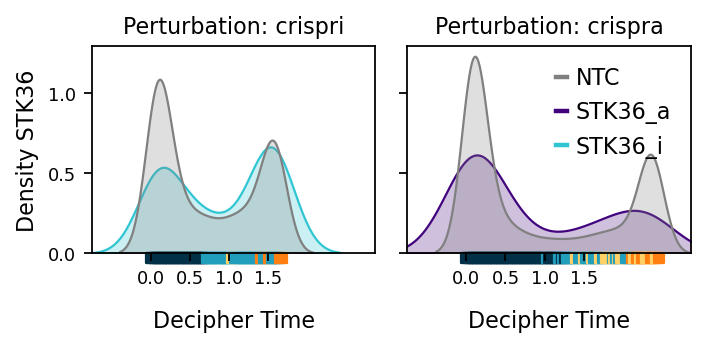

2026-02-13 18:43:57,792 | INFO : maxp pruned
2026-02-13 18:43:57,796 | INFO : cmap pruned
2026-02-13 18:43:57,797 | INFO : kern dropped
2026-02-13 18:43:57,797 | INFO : post pruned
2026-02-13 18:43:57,797 | INFO : FFTM dropped
2026-02-13 18:43:57,798 | INFO : GPOS pruned
2026-02-13 18:43:57,799 | INFO : GSUB pruned
2026-02-13 18:43:57,802 | INFO : glyf pruned
2026-02-13 18:43:57,802 | INFO : Added gid0 to subset
2026-02-13 18:43:57,802 | INFO : Added first four glyphs to subset
2026-02-13 18:43:57,803 | INFO : Closing glyph list over 'GSUB': 34 glyphs before
2026-02-13 18:43:57,803 | INFO : Glyph names: ['.notdef', '.null', 'A', 'C', 'D', 'K', 'M', 'N', 'P', 'T', 'a', 'b', 'c', 'colon', 'e', 'five', 'four', 'h', 'i', 'm', 'n', 'nonmarkingreturn', 'o', 'one', 'p', 'period', 'r', 's', 'space', 't', 'u', 'underscore', 'y', 'zero']
2026-02-13 18:43:57,803 | INFO : Glyph IDs:   [0, 1, 2, 3, 17, 19, 20, 23, 24, 29, 36, 38, 39, 46, 48, 49, 51, 55, 66, 68, 69, 70, 72, 75, 76, 80, 81, 82, 83, 8

Added crispri_class to axes[0] for crispri
Added crispra_class to axes[1] for crispra


2026-02-13 18:43:58,103 | INFO : Closed glyph list over 'MATH': 34 glyphs after
2026-02-13 18:43:58,104 | INFO : Glyph names: ['.notdef', '.null', 'A', 'C', 'D', 'K', 'M', 'N', 'P', 'T', 'a', 'b', 'c', 'colon', 'e', 'five', 'four', 'h', 'i', 'm', 'n', 'nonmarkingreturn', 'o', 'one', 'p', 'period', 'r', 's', 'space', 't', 'u', 'underscore', 'y', 'zero']
2026-02-13 18:43:58,104 | INFO : Glyph IDs:   [0, 1, 2, 3, 17, 19, 20, 23, 24, 29, 36, 38, 39, 46, 48, 49, 51, 55, 66, 68, 69, 70, 72, 75, 76, 80, 81, 82, 83, 85, 86, 87, 88, 92]
2026-02-13 18:43:58,104 | INFO : Closing glyph list over 'glyf': 34 glyphs before
2026-02-13 18:43:58,104 | INFO : Glyph names: ['.notdef', '.null', 'A', 'C', 'D', 'K', 'M', 'N', 'P', 'T', 'a', 'b', 'c', 'colon', 'e', 'five', 'four', 'h', 'i', 'm', 'n', 'nonmarkingreturn', 'o', 'one', 'p', 'period', 'r', 's', 'space', 't', 'u', 'underscore', 'y', 'zero']
2026-02-13 18:43:58,104 | INFO : Glyph IDs:   [0, 1, 2, 3, 17, 19, 20, 23, 24, 29, 36, 38, 39, 46, 48, 49, 51

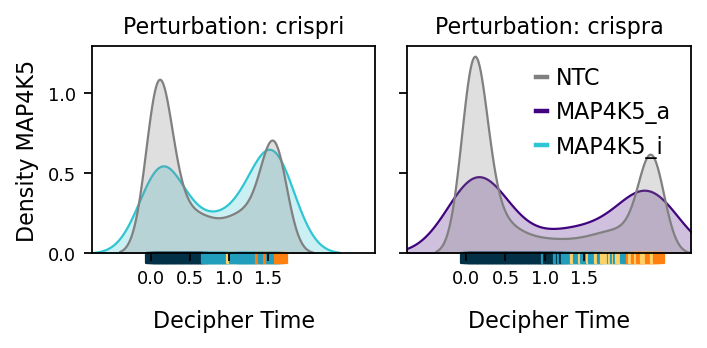

2026-02-13 18:43:58,378 | INFO : maxp pruned
2026-02-13 18:43:58,381 | INFO : cmap pruned
2026-02-13 18:43:58,382 | INFO : kern dropped
2026-02-13 18:43:58,382 | INFO : post pruned
2026-02-13 18:43:58,382 | INFO : FFTM dropped
2026-02-13 18:43:58,383 | INFO : GPOS pruned
2026-02-13 18:43:58,384 | INFO : GSUB pruned
2026-02-13 18:43:58,387 | INFO : glyf pruned
2026-02-13 18:43:58,387 | INFO : Added gid0 to subset
2026-02-13 18:43:58,387 | INFO : Added first four glyphs to subset
2026-02-13 18:43:58,387 | INFO : Closing glyph list over 'GSUB': 33 glyphs before
2026-02-13 18:43:58,387 | INFO : Glyph names: ['.notdef', '.null', 'C', 'D', 'K', 'N', 'P', 'R', 'S', 'T', 'a', 'b', 'c', 'colon', 'e', 'five', 'h', 'i', 'm', 'n', 'nonmarkingreturn', 'o', 'one', 'p', 'period', 'r', 's', 'space', 't', 'u', 'underscore', 'y', 'zero']
2026-02-13 18:43:58,388 | INFO : Glyph IDs:   [0, 1, 2, 3, 17, 19, 20, 24, 29, 38, 39, 46, 49, 51, 53, 54, 55, 66, 68, 69, 70, 72, 75, 76, 80, 81, 82, 83, 85, 86, 87, 8

Added crispri_class to axes[0] for crispri
Added crispra_class to axes[1] for crispra


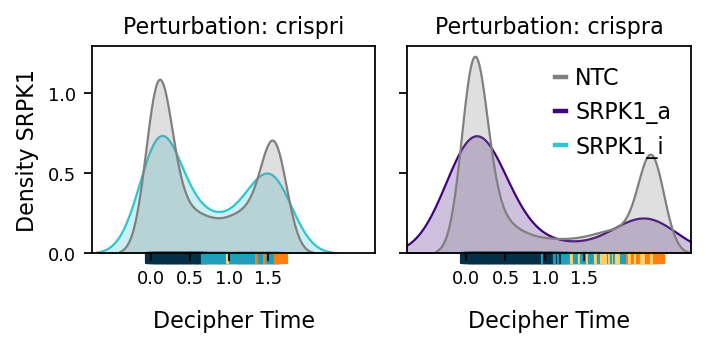

2026-02-13 18:43:58,660 | INFO : maxp pruned
2026-02-13 18:43:58,664 | INFO : cmap pruned
2026-02-13 18:43:58,664 | INFO : kern dropped
2026-02-13 18:43:58,665 | INFO : post pruned
2026-02-13 18:43:58,665 | INFO : FFTM dropped
2026-02-13 18:43:58,665 | INFO : GPOS pruned
2026-02-13 18:43:58,666 | INFO : GSUB pruned
2026-02-13 18:43:58,669 | INFO : glyf pruned
2026-02-13 18:43:58,670 | INFO : Added gid0 to subset
2026-02-13 18:43:58,670 | INFO : Added first four glyphs to subset
2026-02-13 18:43:58,670 | INFO : Closing glyph list over 'GSUB': 34 glyphs before
2026-02-13 18:43:58,670 | INFO : Glyph names: ['.notdef', '.null', 'C', 'D', 'K', 'L', 'M', 'N', 'P', 'T', 'Y', 'a', 'b', 'c', 'colon', 'e', 'five', 'h', 'i', 'm', 'n', 'nonmarkingreturn', 'o', 'one', 'p', 'period', 'r', 's', 'space', 't', 'u', 'underscore', 'y', 'zero']
2026-02-13 18:43:58,671 | INFO : Glyph IDs:   [0, 1, 2, 3, 17, 19, 20, 24, 29, 38, 39, 46, 47, 48, 49, 51, 55, 60, 66, 68, 69, 70, 72, 75, 76, 80, 81, 82, 83, 85, 

Added crispri_class to axes[0] for crispri
Added crispra_class to axes[1] for crispra


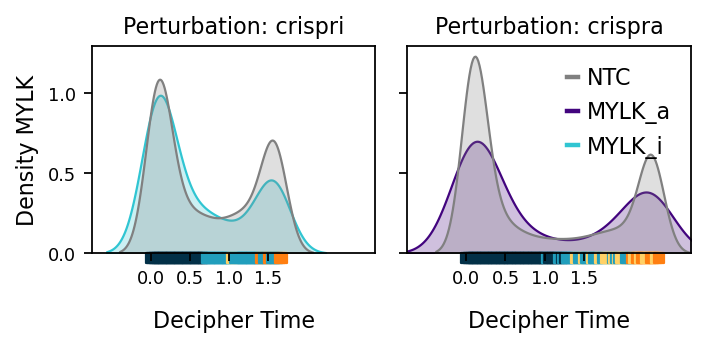

2026-02-13 18:43:58,950 | INFO : maxp pruned
2026-02-13 18:43:58,954 | INFO : cmap pruned
2026-02-13 18:43:58,954 | INFO : kern dropped
2026-02-13 18:43:58,955 | INFO : post pruned
2026-02-13 18:43:58,955 | INFO : FFTM dropped
2026-02-13 18:43:58,956 | INFO : GPOS pruned
2026-02-13 18:43:58,957 | INFO : GSUB pruned
2026-02-13 18:43:58,959 | INFO : glyf pruned
2026-02-13 18:43:58,960 | INFO : Added gid0 to subset
2026-02-13 18:43:58,960 | INFO : Added first four glyphs to subset
2026-02-13 18:43:58,960 | INFO : Closing glyph list over 'GSUB': 33 glyphs before
2026-02-13 18:43:58,960 | INFO : Glyph names: ['.notdef', '.null', 'C', 'D', 'K', 'N', 'P', 'S', 'T', 'a', 'b', 'c', 'colon', 'e', 'five', 'four', 'h', 'i', 'm', 'n', 'nonmarkingreturn', 'o', 'one', 'p', 'period', 'r', 's', 'space', 't', 'u', 'underscore', 'y', 'zero']
2026-02-13 18:43:58,960 | INFO : Glyph IDs:   [0, 1, 2, 3, 17, 19, 20, 23, 24, 29, 38, 39, 46, 49, 51, 54, 55, 66, 68, 69, 70, 72, 75, 76, 80, 81, 82, 83, 85, 86, 87

Added crispri_class to axes[0] for crispri
Added crispra_class to axes[1] for crispra


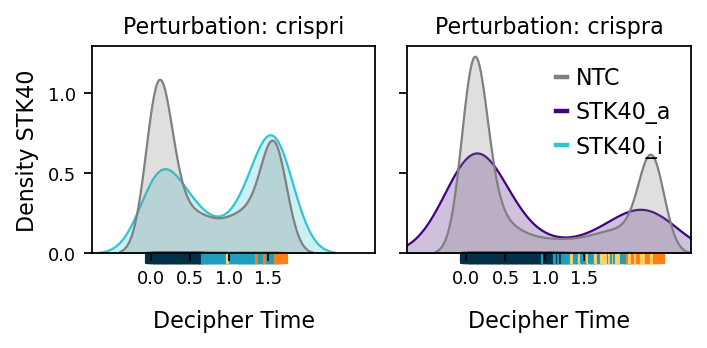

2026-02-13 18:43:59,232 | INFO : maxp pruned
2026-02-13 18:43:59,236 | INFO : cmap pruned
2026-02-13 18:43:59,237 | INFO : kern dropped
2026-02-13 18:43:59,237 | INFO : post pruned
2026-02-13 18:43:59,237 | INFO : FFTM dropped
2026-02-13 18:43:59,238 | INFO : GPOS pruned
2026-02-13 18:43:59,239 | INFO : GSUB pruned
2026-02-13 18:43:59,242 | INFO : glyf pruned
2026-02-13 18:43:59,242 | INFO : Added gid0 to subset
2026-02-13 18:43:59,242 | INFO : Added first four glyphs to subset
2026-02-13 18:43:59,242 | INFO : Closing glyph list over 'GSUB': 34 glyphs before
2026-02-13 18:43:59,243 | INFO : Glyph names: ['.notdef', '.null', 'C', 'D', 'K', 'L', 'M', 'N', 'P', 'T', 'a', 'b', 'c', 'colon', 'e', 'five', 'h', 'i', 'm', 'n', 'nonmarkingreturn', 'o', 'one', 'p', 'period', 'r', 's', 'space', 't', 'three', 'u', 'underscore', 'y', 'zero']
2026-02-13 18:43:59,243 | INFO : Glyph IDs:   [0, 1, 2, 3, 17, 19, 20, 22, 24, 29, 38, 39, 46, 47, 48, 49, 51, 55, 66, 68, 69, 70, 72, 75, 76, 80, 81, 82, 83, 

Added crispri_class to axes[0] for crispri
Added crispra_class to axes[1] for crispra


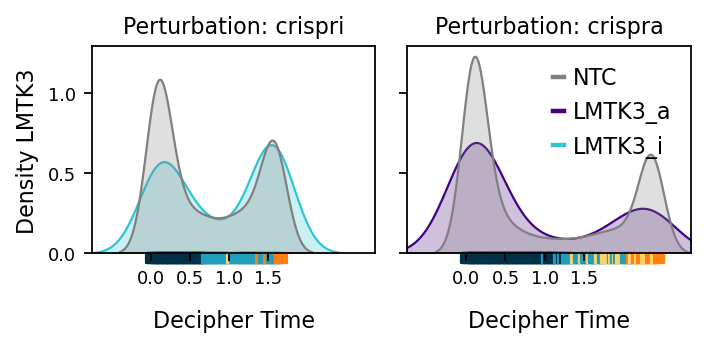

2026-02-13 18:43:59,523 | INFO : maxp pruned
2026-02-13 18:43:59,526 | INFO : cmap pruned
2026-02-13 18:43:59,527 | INFO : kern dropped
2026-02-13 18:43:59,527 | INFO : post pruned
2026-02-13 18:43:59,527 | INFO : FFTM dropped
2026-02-13 18:43:59,528 | INFO : GPOS pruned
2026-02-13 18:43:59,529 | INFO : GSUB pruned
2026-02-13 18:43:59,532 | INFO : glyf pruned
2026-02-13 18:43:59,532 | INFO : Added gid0 to subset
2026-02-13 18:43:59,533 | INFO : Added first four glyphs to subset
2026-02-13 18:43:59,533 | INFO : Closing glyph list over 'GSUB': 32 glyphs before
2026-02-13 18:43:59,533 | INFO : Glyph names: ['.notdef', '.null', 'C', 'D', 'K', 'L', 'N', 'P', 'T', 'a', 'b', 'c', 'colon', 'e', 'five', 'h', 'i', 'm', 'n', 'nonmarkingreturn', 'o', 'one', 'p', 'period', 'r', 's', 'space', 't', 'u', 'underscore', 'y', 'zero']
2026-02-13 18:43:59,533 | INFO : Glyph IDs:   [0, 1, 2, 3, 17, 19, 20, 24, 29, 38, 39, 46, 47, 49, 51, 55, 66, 68, 69, 70, 72, 75, 76, 80, 81, 82, 83, 85, 86, 87, 88, 92]
20

Added crispri_class to axes[0] for crispri
Added crispra_class to axes[1] for crispra


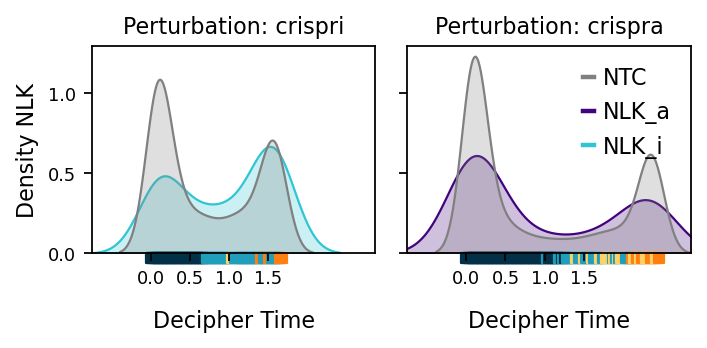

2026-02-13 18:43:59,807 | INFO : maxp pruned
2026-02-13 18:43:59,811 | INFO : cmap pruned
2026-02-13 18:43:59,811 | INFO : kern dropped
2026-02-13 18:43:59,811 | INFO : post pruned
2026-02-13 18:43:59,811 | INFO : FFTM dropped
2026-02-13 18:43:59,812 | INFO : GPOS pruned
2026-02-13 18:43:59,813 | INFO : GSUB pruned
2026-02-13 18:43:59,816 | INFO : glyf pruned
2026-02-13 18:43:59,817 | INFO : Added gid0 to subset
2026-02-13 18:43:59,817 | INFO : Added first four glyphs to subset
2026-02-13 18:43:59,817 | INFO : Closing glyph list over 'GSUB': 34 glyphs before
2026-02-13 18:43:59,818 | INFO : Glyph names: ['.notdef', '.null', 'A', 'C', 'D', 'I', 'K', 'N', 'P', 'R', 'T', 'a', 'b', 'c', 'colon', 'e', 'five', 'h', 'i', 'm', 'n', 'nonmarkingreturn', 'o', 'one', 'p', 'period', 'r', 's', 'space', 't', 'u', 'underscore', 'y', 'zero']
2026-02-13 18:43:59,818 | INFO : Glyph IDs:   [0, 1, 2, 3, 17, 19, 20, 24, 29, 36, 38, 39, 44, 46, 49, 51, 53, 55, 66, 68, 69, 70, 72, 75, 76, 80, 81, 82, 83, 85, 

Added crispri_class to axes[0] for crispri
Added crispra_class to axes[1] for crispra


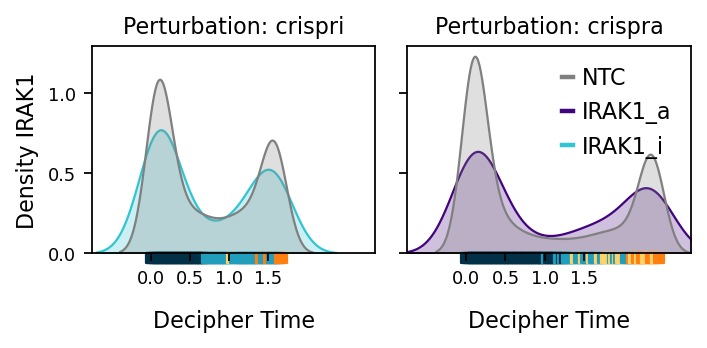

2026-02-13 18:44:00,101 | INFO : maxp pruned
2026-02-13 18:44:00,105 | INFO : cmap pruned
2026-02-13 18:44:00,105 | INFO : kern dropped
2026-02-13 18:44:00,105 | INFO : post pruned
2026-02-13 18:44:00,106 | INFO : FFTM dropped
2026-02-13 18:44:00,106 | INFO : GPOS pruned
2026-02-13 18:44:00,107 | INFO : GSUB pruned
2026-02-13 18:44:00,110 | INFO : glyf pruned
2026-02-13 18:44:00,111 | INFO : Added gid0 to subset
2026-02-13 18:44:00,111 | INFO : Added first four glyphs to subset
2026-02-13 18:44:00,111 | INFO : Closing glyph list over 'GSUB': 35 glyphs before
2026-02-13 18:44:00,111 | INFO : Glyph names: ['.notdef', '.null', 'A', 'C', 'D', 'K', 'N', 'P', 'S', 'T', 'a', 'b', 'c', 'colon', 'e', 'five', 'h', 'i', 'm', 'n', 'nonmarkingreturn', 'o', 'one', 'p', 'period', 'r', 's', 'space', 't', 'three', 'two', 'u', 'underscore', 'y', 'zero']
2026-02-13 18:44:00,111 | INFO : Glyph IDs:   [0, 1, 2, 3, 17, 19, 20, 21, 22, 24, 29, 36, 38, 39, 46, 49, 51, 54, 55, 66, 68, 69, 70, 72, 75, 76, 80, 8

Added crispri_class to axes[0] for crispri
Added crispra_class to axes[1] for crispra


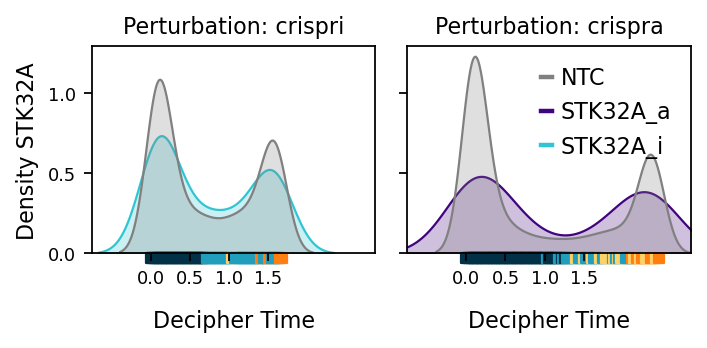

2026-02-13 18:44:00,386 | INFO : maxp pruned
2026-02-13 18:44:00,390 | INFO : cmap pruned
2026-02-13 18:44:00,390 | INFO : kern dropped
2026-02-13 18:44:00,390 | INFO : post pruned
2026-02-13 18:44:00,390 | INFO : FFTM dropped
2026-02-13 18:44:00,391 | INFO : GPOS pruned
2026-02-13 18:44:00,392 | INFO : GSUB pruned
2026-02-13 18:44:00,395 | INFO : glyf pruned
2026-02-13 18:44:00,396 | INFO : Added gid0 to subset
2026-02-13 18:44:00,396 | INFO : Added first four glyphs to subset
2026-02-13 18:44:00,396 | INFO : Closing glyph list over 'GSUB': 33 glyphs before
2026-02-13 18:44:00,396 | INFO : Glyph names: ['.notdef', '.null', 'B', 'C', 'D', 'K', 'N', 'P', 'S', 'T', 'a', 'b', 'c', 'colon', 'e', 'five', 'h', 'i', 'm', 'n', 'nonmarkingreturn', 'o', 'one', 'p', 'period', 'r', 's', 'space', 't', 'u', 'underscore', 'y', 'zero']
2026-02-13 18:44:00,396 | INFO : Glyph IDs:   [0, 1, 2, 3, 17, 19, 20, 24, 29, 37, 38, 39, 46, 49, 51, 54, 55, 66, 68, 69, 70, 72, 75, 76, 80, 81, 82, 83, 85, 86, 87, 8

Added crispri_class to axes[0] for crispri
Added crispra_class to axes[1] for crispra


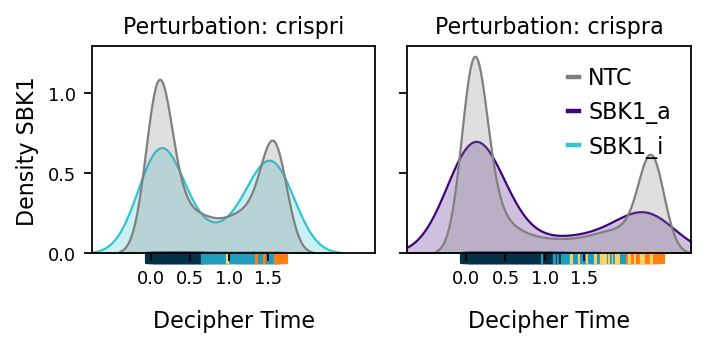

2026-02-13 18:44:00,669 | INFO : maxp pruned
2026-02-13 18:44:00,674 | INFO : cmap pruned
2026-02-13 18:44:00,674 | INFO : kern dropped
2026-02-13 18:44:00,674 | INFO : post pruned
2026-02-13 18:44:00,674 | INFO : FFTM dropped
2026-02-13 18:44:00,675 | INFO : GPOS pruned
2026-02-13 18:44:00,676 | INFO : GSUB pruned
2026-02-13 18:44:00,679 | INFO : glyf pruned
2026-02-13 18:44:00,679 | INFO : Added gid0 to subset
2026-02-13 18:44:00,680 | INFO : Added first four glyphs to subset
2026-02-13 18:44:00,680 | INFO : Closing glyph list over 'GSUB': 33 glyphs before
2026-02-13 18:44:00,680 | INFO : Glyph names: ['.notdef', '.null', 'A', 'C', 'D', 'E', 'H', 'N', 'P', 'T', 'a', 'b', 'c', 'colon', 'e', 'five', 'h', 'i', 'm', 'n', 'nonmarkingreturn', 'o', 'one', 'p', 'period', 'r', 's', 'space', 't', 'u', 'underscore', 'y', 'zero']
2026-02-13 18:44:00,680 | INFO : Glyph IDs:   [0, 1, 2, 3, 17, 19, 20, 24, 29, 36, 38, 39, 40, 43, 49, 51, 55, 66, 68, 69, 70, 72, 75, 76, 80, 81, 82, 83, 85, 86, 87, 8

Added crispri_class to axes[0] for crispri
Added crispra_class to axes[1] for crispra


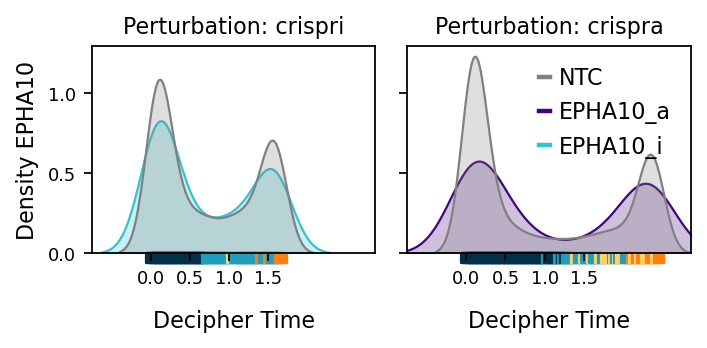

2026-02-13 18:44:00,964 | INFO : maxp pruned
2026-02-13 18:44:00,968 | INFO : cmap pruned
2026-02-13 18:44:00,968 | INFO : kern dropped
2026-02-13 18:44:00,969 | INFO : post pruned
2026-02-13 18:44:00,969 | INFO : FFTM dropped


Added crispri_class to axes[0] for crispri
Added crispra_class to axes[1] for crispra


2026-02-13 18:44:01,262 | INFO : GPOS pruned
2026-02-13 18:44:01,263 | INFO : GSUB pruned
2026-02-13 18:44:01,266 | INFO : glyf pruned
2026-02-13 18:44:01,266 | INFO : Added gid0 to subset
2026-02-13 18:44:01,267 | INFO : Added first four glyphs to subset
2026-02-13 18:44:01,267 | INFO : Closing glyph list over 'GSUB': 34 glyphs before
2026-02-13 18:44:01,267 | INFO : Glyph names: ['.notdef', '.null', 'C', 'D', 'K', 'L', 'N', 'P', 'T', 'U', 'a', 'b', 'c', 'colon', 'e', 'five', 'h', 'i', 'm', 'n', 'nonmarkingreturn', 'o', 'one', 'p', 'period', 'r', 's', 'space', 't', 'three', 'u', 'underscore', 'y', 'zero']
2026-02-13 18:44:01,267 | INFO : Glyph IDs:   [0, 1, 2, 3, 17, 19, 20, 22, 24, 29, 38, 39, 46, 47, 49, 51, 55, 56, 66, 68, 69, 70, 72, 75, 76, 80, 81, 82, 83, 85, 86, 87, 88, 92]
2026-02-13 18:44:01,268 | INFO : Closed glyph list over 'GSUB': 34 glyphs after
2026-02-13 18:44:01,268 | INFO : Glyph names: ['.notdef', '.null', 'C', 'D', 'K', 'L', 'N', 'P', 'T', 'U', 'a', 'b', 'c', 'colo

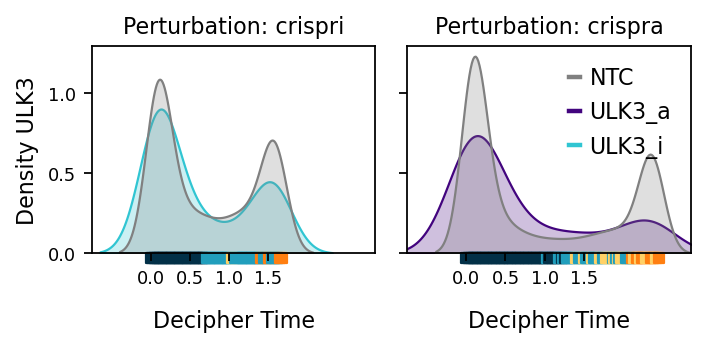

2026-02-13 18:44:01,573 | INFO : maxp pruned
2026-02-13 18:44:01,577 | INFO : cmap pruned
2026-02-13 18:44:01,577 | INFO : kern dropped
2026-02-13 18:44:01,577 | INFO : post pruned
2026-02-13 18:44:01,577 | INFO : FFTM dropped
2026-02-13 18:44:01,578 | INFO : GPOS pruned
2026-02-13 18:44:01,579 | INFO : GSUB pruned
2026-02-13 18:44:01,582 | INFO : glyf pruned
2026-02-13 18:44:01,583 | INFO : Added gid0 to subset
2026-02-13 18:44:01,583 | INFO : Added first four glyphs to subset
2026-02-13 18:44:01,583 | INFO : Closing glyph list over 'GSUB': 34 glyphs before
2026-02-13 18:44:01,583 | INFO : Glyph names: ['.notdef', '.null', 'B', 'C', 'D', 'K', 'N', 'P', 'S', 'T', 'a', 'b', 'c', 'colon', 'e', 'five', 'h', 'i', 'm', 'n', 'nonmarkingreturn', 'o', 'one', 'p', 'period', 'r', 's', 'seven', 'space', 't', 'u', 'underscore', 'y', 'zero']
2026-02-13 18:44:01,584 | INFO : Glyph IDs:   [0, 1, 2, 3, 17, 19, 20, 24, 26, 29, 37, 38, 39, 46, 49, 51, 54, 55, 66, 68, 69, 70, 72, 75, 76, 80, 81, 82, 83, 

Added crispri_class to axes[0] for crispri
Added crispra_class to axes[1] for crispra


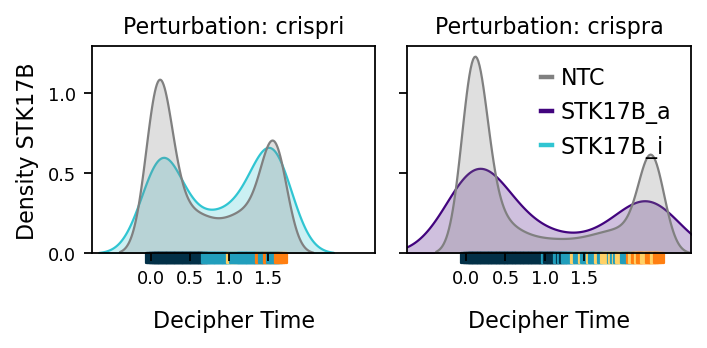

2026-02-13 18:44:01,860 | INFO : maxp pruned
2026-02-13 18:44:01,864 | INFO : cmap pruned
2026-02-13 18:44:01,864 | INFO : kern dropped
2026-02-13 18:44:01,864 | INFO : post pruned
2026-02-13 18:44:01,864 | INFO : FFTM dropped
2026-02-13 18:44:01,865 | INFO : GPOS pruned
2026-02-13 18:44:01,866 | INFO : GSUB pruned
2026-02-13 18:44:01,869 | INFO : glyf pruned
2026-02-13 18:44:01,869 | INFO : Added gid0 to subset
2026-02-13 18:44:01,869 | INFO : Added first four glyphs to subset
2026-02-13 18:44:01,869 | INFO : Closing glyph list over 'GSUB': 32 glyphs before
2026-02-13 18:44:01,869 | INFO : Glyph names: ['.notdef', '.null', 'C', 'D', 'I', 'K', 'N', 'P', 'T', 'a', 'b', 'c', 'colon', 'e', 'five', 'h', 'i', 'm', 'n', 'nonmarkingreturn', 'o', 'one', 'p', 'period', 'r', 's', 'space', 't', 'u', 'underscore', 'y', 'zero']
2026-02-13 18:44:01,870 | INFO : Glyph IDs:   [0, 1, 2, 3, 17, 19, 20, 24, 29, 38, 39, 44, 46, 49, 51, 55, 66, 68, 69, 70, 72, 75, 76, 80, 81, 82, 83, 85, 86, 87, 88, 92]
20

Added crispri_class to axes[0] for crispri
Added crispra_class to axes[1] for crispra


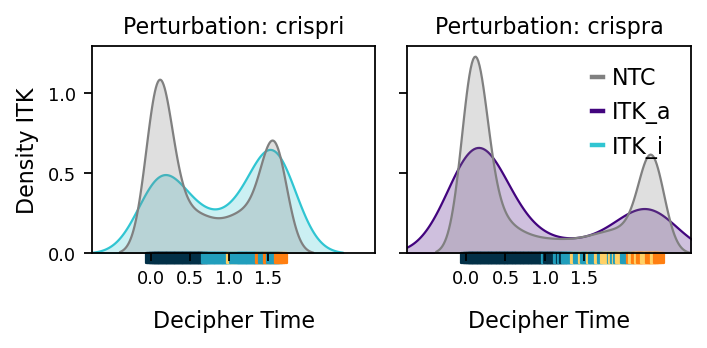

2026-02-13 18:44:02,185 | INFO : maxp pruned
2026-02-13 18:44:02,189 | INFO : cmap pruned
2026-02-13 18:44:02,189 | INFO : kern dropped
2026-02-13 18:44:02,189 | INFO : post pruned
2026-02-13 18:44:02,189 | INFO : FFTM dropped
2026-02-13 18:44:02,191 | INFO : GPOS pruned
2026-02-13 18:44:02,192 | INFO : GSUB pruned
2026-02-13 18:44:02,194 | INFO : glyf pruned
2026-02-13 18:44:02,195 | INFO : Added gid0 to subset
2026-02-13 18:44:02,195 | INFO : Added first four glyphs to subset
2026-02-13 18:44:02,195 | INFO : Closing glyph list over 'GSUB': 34 glyphs before
2026-02-13 18:44:02,195 | INFO : Glyph names: ['.notdef', '.null', 'C', 'D', 'G', 'K', 'N', 'P', 'R', 'T', 'a', 'b', 'c', 'colon', 'e', 'five', 'h', 'i', 'm', 'n', 'nonmarkingreturn', 'o', 'one', 'p', 'period', 'r', 's', 'seven', 'space', 't', 'u', 'underscore', 'y', 'zero']
2026-02-13 18:44:02,196 | INFO : Glyph IDs:   [0, 1, 2, 3, 17, 19, 20, 24, 26, 29, 38, 39, 42, 46, 49, 51, 53, 55, 66, 68, 69, 70, 72, 75, 76, 80, 81, 82, 83, 

Added crispri_class to axes[0] for crispri
Added crispra_class to axes[1] for crispra


2026-02-13 18:44:02,211 | INFO : GSUB subsetted
2026-02-13 18:44:02,211 | INFO : name subsetting not needed
2026-02-13 18:44:02,212 | INFO : glyf subsetted
2026-02-13 18:44:02,212 | INFO : head pruned
2026-02-13 18:44:02,212 | INFO : OS/2 Unicode ranges pruned: [0]
2026-02-13 18:44:02,212 | INFO : OS/2 CodePage ranges pruned: [0]
2026-02-13 18:44:02,212 | INFO : glyf pruned
2026-02-13 18:44:02,212 | INFO : GDEF pruned
2026-02-13 18:44:02,213 | INFO : GPOS pruned
2026-02-13 18:44:02,213 | INFO : GSUB pruned
2026-02-13 18:44:02,215 | INFO : name pruned


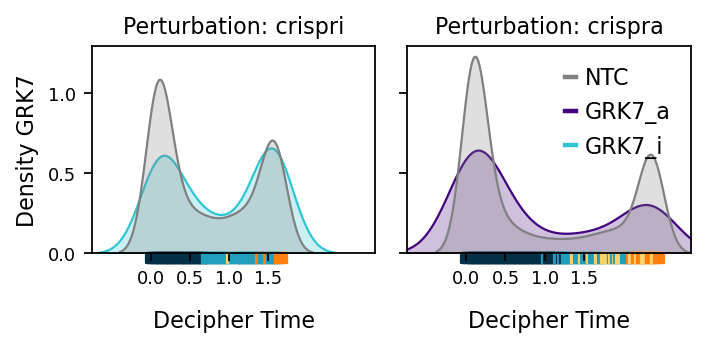

2026-02-13 18:44:02,468 | INFO : maxp pruned
2026-02-13 18:44:02,471 | INFO : cmap pruned
2026-02-13 18:44:02,472 | INFO : kern dropped
2026-02-13 18:44:02,472 | INFO : post pruned
2026-02-13 18:44:02,472 | INFO : FFTM dropped
2026-02-13 18:44:02,473 | INFO : GPOS pruned
2026-02-13 18:44:02,474 | INFO : GSUB pruned
2026-02-13 18:44:02,477 | INFO : glyf pruned
2026-02-13 18:44:02,478 | INFO : Added gid0 to subset
2026-02-13 18:44:02,478 | INFO : Added first four glyphs to subset
2026-02-13 18:44:02,478 | INFO : Closing glyph list over 'GSUB': 33 glyphs before
2026-02-13 18:44:02,478 | INFO : Glyph names: ['.notdef', '.null', 'A', 'C', 'D', 'G', 'K', 'N', 'P', 'T', 'a', 'b', 'c', 'colon', 'e', 'five', 'h', 'i', 'm', 'n', 'nonmarkingreturn', 'o', 'one', 'p', 'period', 'r', 's', 'space', 't', 'u', 'underscore', 'y', 'zero']
2026-02-13 18:44:02,479 | INFO : Glyph IDs:   [0, 1, 2, 3, 17, 19, 20, 24, 29, 36, 38, 39, 42, 46, 49, 51, 55, 66, 68, 69, 70, 72, 75, 76, 80, 81, 82, 83, 85, 86, 87, 8

Added crispri_class to axes[0] for crispri
Added crispra_class to axes[1] for crispra


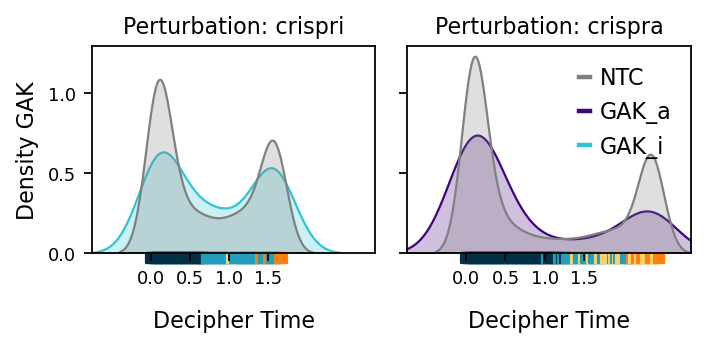

2026-02-13 18:44:02,750 | INFO : maxp pruned
2026-02-13 18:44:02,754 | INFO : cmap pruned
2026-02-13 18:44:02,754 | INFO : kern dropped
2026-02-13 18:44:02,754 | INFO : post pruned
2026-02-13 18:44:02,754 | INFO : FFTM dropped
2026-02-13 18:44:02,755 | INFO : GPOS pruned
2026-02-13 18:44:02,756 | INFO : GSUB pruned
2026-02-13 18:44:02,759 | INFO : glyf pruned
2026-02-13 18:44:02,760 | INFO : Added gid0 to subset
2026-02-13 18:44:02,760 | INFO : Added first four glyphs to subset
2026-02-13 18:44:02,760 | INFO : Closing glyph list over 'GSUB': 34 glyphs before
2026-02-13 18:44:02,760 | INFO : Glyph names: ['.notdef', '.null', 'C', 'D', 'K', 'L', 'N', 'P', 'T', 'U', 'a', 'b', 'c', 'colon', 'e', 'five', 'h', 'i', 'm', 'n', 'nonmarkingreturn', 'o', 'one', 'p', 'period', 'r', 's', 'space', 't', 'two', 'u', 'underscore', 'y', 'zero']
2026-02-13 18:44:02,761 | INFO : Glyph IDs:   [0, 1, 2, 3, 17, 19, 20, 21, 24, 29, 38, 39, 46, 47, 49, 51, 55, 56, 66, 68, 69, 70, 72, 75, 76, 80, 81, 82, 83, 85

Added crispri_class to axes[0] for crispri
Added crispra_class to axes[1] for crispra


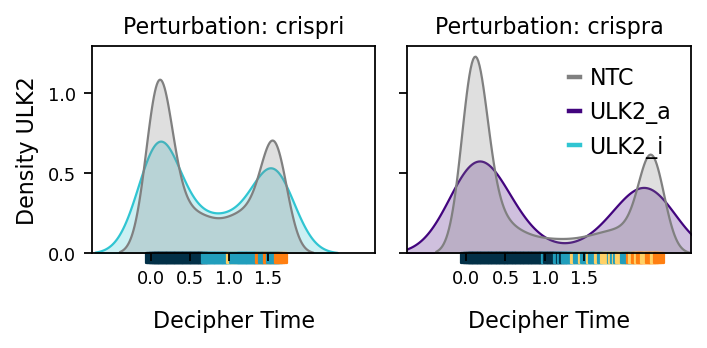

2026-02-13 18:44:03,036 | INFO : maxp pruned
2026-02-13 18:44:03,040 | INFO : cmap pruned
2026-02-13 18:44:03,040 | INFO : kern dropped
2026-02-13 18:44:03,040 | INFO : post pruned
2026-02-13 18:44:03,040 | INFO : FFTM dropped
2026-02-13 18:44:03,041 | INFO : GPOS pruned
2026-02-13 18:44:03,043 | INFO : GSUB pruned
2026-02-13 18:44:03,046 | INFO : glyf pruned
2026-02-13 18:44:03,046 | INFO : Added gid0 to subset
2026-02-13 18:44:03,046 | INFO : Added first four glyphs to subset
2026-02-13 18:44:03,046 | INFO : Closing glyph list over 'GSUB': 33 glyphs before
2026-02-13 18:44:03,046 | INFO : Glyph names: ['.notdef', '.null', 'A', 'C', 'D', 'K', 'M', 'N', 'P', 'T', 'a', 'b', 'c', 'colon', 'e', 'five', 'h', 'i', 'm', 'n', 'nonmarkingreturn', 'o', 'one', 'p', 'period', 'r', 's', 'space', 't', 'u', 'underscore', 'y', 'zero']
2026-02-13 18:44:03,047 | INFO : Glyph IDs:   [0, 1, 2, 3, 17, 19, 20, 24, 29, 36, 38, 39, 46, 48, 49, 51, 55, 66, 68, 69, 70, 72, 75, 76, 80, 81, 82, 83, 85, 86, 87, 8

Added crispri_class to axes[0] for crispri
Added crispra_class to axes[1] for crispra


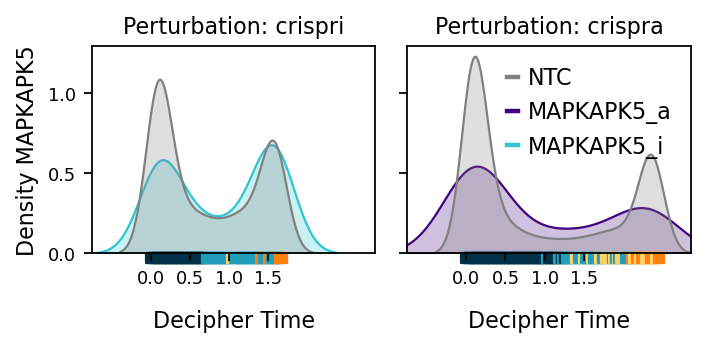

2026-02-13 18:44:03,334 | INFO : maxp pruned
2026-02-13 18:44:03,338 | INFO : cmap pruned
2026-02-13 18:44:03,338 | INFO : kern dropped
2026-02-13 18:44:03,338 | INFO : post pruned
2026-02-13 18:44:03,338 | INFO : FFTM dropped
2026-02-13 18:44:03,340 | INFO : GPOS pruned
2026-02-13 18:44:03,342 | INFO : GSUB pruned
2026-02-13 18:44:03,344 | INFO : glyf pruned
2026-02-13 18:44:03,345 | INFO : Added gid0 to subset
2026-02-13 18:44:03,345 | INFO : Added first four glyphs to subset
2026-02-13 18:44:03,345 | INFO : Closing glyph list over 'GSUB': 33 glyphs before
2026-02-13 18:44:03,345 | INFO : Glyph names: ['.notdef', '.null', 'C', 'D', 'K', 'N', 'P', 'R', 'S', 'T', 'a', 'b', 'c', 'colon', 'e', 'five', 'h', 'i', 'm', 'n', 'nonmarkingreturn', 'o', 'one', 'p', 'period', 'r', 's', 'space', 't', 'u', 'underscore', 'y', 'zero']
2026-02-13 18:44:03,346 | INFO : Glyph IDs:   [0, 1, 2, 3, 17, 19, 20, 24, 29, 38, 39, 46, 49, 51, 53, 54, 55, 66, 68, 69, 70, 72, 75, 76, 80, 81, 82, 83, 85, 86, 87, 8

Added crispri_class to axes[0] for crispri
Added crispra_class to axes[1] for crispra


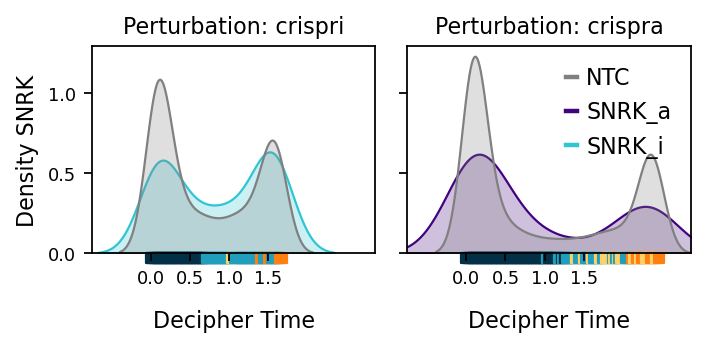

2026-02-13 18:44:03,623 | INFO : maxp pruned
2026-02-13 18:44:03,626 | INFO : cmap pruned
2026-02-13 18:44:03,627 | INFO : kern dropped
2026-02-13 18:44:03,627 | INFO : post pruned
2026-02-13 18:44:03,627 | INFO : FFTM dropped
2026-02-13 18:44:03,628 | INFO : GPOS pruned
2026-02-13 18:44:03,629 | INFO : GSUB pruned
2026-02-13 18:44:03,632 | INFO : glyf pruned
2026-02-13 18:44:03,632 | INFO : Added gid0 to subset
2026-02-13 18:44:03,633 | INFO : Added first four glyphs to subset
2026-02-13 18:44:03,633 | INFO : Closing glyph list over 'GSUB': 32 glyphs before
2026-02-13 18:44:03,633 | INFO : Glyph names: ['.notdef', '.null', 'C', 'D', 'I', 'K', 'N', 'P', 'T', 'a', 'b', 'c', 'colon', 'e', 'five', 'h', 'i', 'm', 'n', 'nonmarkingreturn', 'o', 'one', 'p', 'period', 'r', 's', 'space', 't', 'u', 'underscore', 'y', 'zero']
2026-02-13 18:44:03,633 | INFO : Glyph IDs:   [0, 1, 2, 3, 17, 19, 20, 24, 29, 38, 39, 44, 46, 49, 51, 55, 66, 68, 69, 70, 72, 75, 76, 80, 81, 82, 83, 85, 86, 87, 88, 92]
20

Added crispri_class to axes[0] for crispri
Added crispra_class to axes[1] for crispra


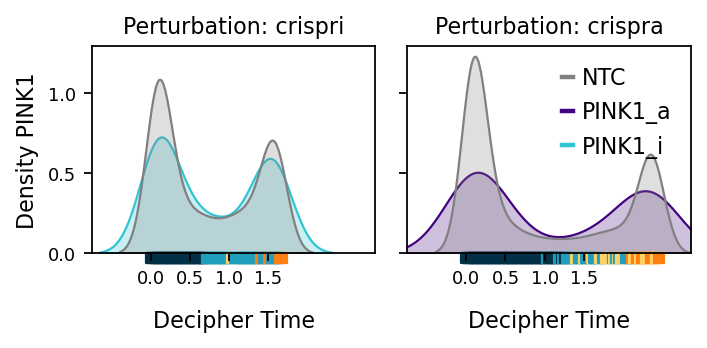

2026-02-13 18:44:03,908 | INFO : maxp pruned
2026-02-13 18:44:03,912 | INFO : cmap pruned
2026-02-13 18:44:03,912 | INFO : kern dropped
2026-02-13 18:44:03,912 | INFO : post pruned
2026-02-13 18:44:03,912 | INFO : FFTM dropped
2026-02-13 18:44:03,913 | INFO : GPOS pruned
2026-02-13 18:44:03,914 | INFO : GSUB pruned
2026-02-13 18:44:03,917 | INFO : glyf pruned
2026-02-13 18:44:03,918 | INFO : Added gid0 to subset
2026-02-13 18:44:03,918 | INFO : Added first four glyphs to subset
2026-02-13 18:44:03,918 | INFO : Closing glyph list over 'GSUB': 33 glyphs before
2026-02-13 18:44:03,918 | INFO : Glyph names: ['.notdef', '.null', 'C', 'D', 'K', 'N', 'P', 'R', 'T', 'a', 'b', 'c', 'colon', 'e', 'five', 'h', 'i', 'm', 'n', 'nonmarkingreturn', 'o', 'one', 'p', 'period', 'r', 's', 'space', 't', 'three', 'u', 'underscore', 'y', 'zero']
2026-02-13 18:44:03,919 | INFO : Glyph IDs:   [0, 1, 2, 3, 17, 19, 20, 22, 24, 29, 38, 39, 46, 49, 51, 53, 55, 66, 68, 69, 70, 72, 75, 76, 80, 81, 82, 83, 85, 86, 8

Added crispri_class to axes[0] for crispri
Added crispra_class to axes[1] for crispra


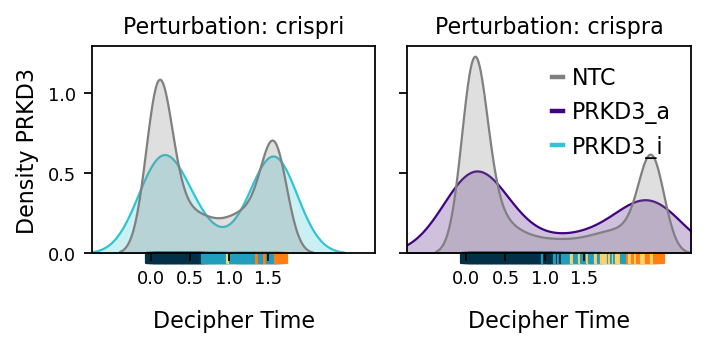

2026-02-13 18:44:04,201 | INFO : maxp pruned
2026-02-13 18:44:04,205 | INFO : cmap pruned
2026-02-13 18:44:04,205 | INFO : kern dropped
2026-02-13 18:44:04,205 | INFO : post pruned
2026-02-13 18:44:04,205 | INFO : FFTM dropped
2026-02-13 18:44:04,206 | INFO : GPOS pruned
2026-02-13 18:44:04,208 | INFO : GSUB pruned


Added crispri_class to axes[0] for crispri
Added crispra_class to axes[1] for crispra


2026-02-13 18:44:04,512 | INFO : glyf pruned
2026-02-13 18:44:04,513 | INFO : Added gid0 to subset
2026-02-13 18:44:04,513 | INFO : Added first four glyphs to subset
2026-02-13 18:44:04,513 | INFO : Closing glyph list over 'GSUB': 34 glyphs before
2026-02-13 18:44:04,513 | INFO : Glyph names: ['.notdef', '.null', 'A', 'C', 'D', 'E', 'H', 'N', 'P', 'T', 'a', 'b', 'c', 'colon', 'e', 'five', 'h', 'i', 'm', 'n', 'nonmarkingreturn', 'o', 'one', 'p', 'period', 'r', 's', 'space', 't', 'two', 'u', 'underscore', 'y', 'zero']
2026-02-13 18:44:04,514 | INFO : Glyph IDs:   [0, 1, 2, 3, 17, 19, 20, 21, 24, 29, 36, 38, 39, 40, 43, 49, 51, 55, 66, 68, 69, 70, 72, 75, 76, 80, 81, 82, 83, 85, 86, 87, 88, 92]
2026-02-13 18:44:04,515 | INFO : Closed glyph list over 'GSUB': 34 glyphs after
2026-02-13 18:44:04,515 | INFO : Glyph names: ['.notdef', '.null', 'A', 'C', 'D', 'E', 'H', 'N', 'P', 'T', 'a', 'b', 'c', 'colon', 'e', 'five', 'h', 'i', 'm', 'n', 'nonmarkingreturn', 'o', 'one', 'p', 'period', 'r', 's'

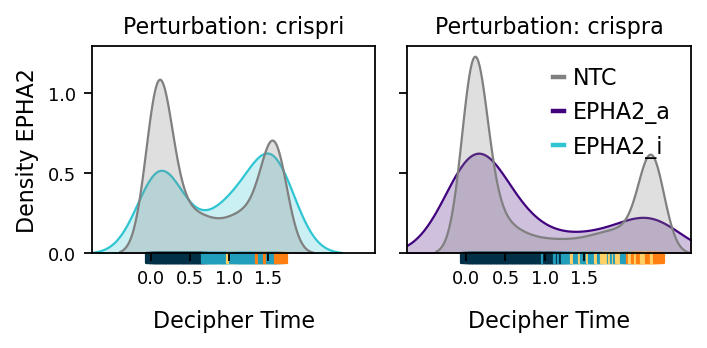

2026-02-13 18:44:04,786 | INFO : maxp pruned
2026-02-13 18:44:04,790 | INFO : cmap pruned
2026-02-13 18:44:04,790 | INFO : kern dropped
2026-02-13 18:44:04,790 | INFO : post pruned
2026-02-13 18:44:04,790 | INFO : FFTM dropped
2026-02-13 18:44:04,791 | INFO : GPOS pruned
2026-02-13 18:44:04,792 | INFO : GSUB pruned
2026-02-13 18:44:04,794 | INFO : glyf pruned
2026-02-13 18:44:04,795 | INFO : Added gid0 to subset
2026-02-13 18:44:04,795 | INFO : Added first four glyphs to subset
2026-02-13 18:44:04,795 | INFO : Closing glyph list over 'GSUB': 34 glyphs before
2026-02-13 18:44:04,795 | INFO : Glyph names: ['.notdef', '.null', 'C', 'D', 'F', 'G', 'I', 'N', 'P', 'R', 'T', 'a', 'b', 'c', 'colon', 'e', 'five', 'h', 'i', 'm', 'n', 'nonmarkingreturn', 'o', 'one', 'p', 'period', 'r', 's', 'space', 't', 'u', 'underscore', 'y', 'zero']
2026-02-13 18:44:04,796 | INFO : Glyph IDs:   [0, 1, 2, 3, 17, 19, 20, 24, 29, 38, 39, 41, 42, 44, 49, 51, 53, 55, 66, 68, 69, 70, 72, 75, 76, 80, 81, 82, 83, 85, 

Added crispri_class to axes[0] for crispri
Added crispra_class to axes[1] for crispra


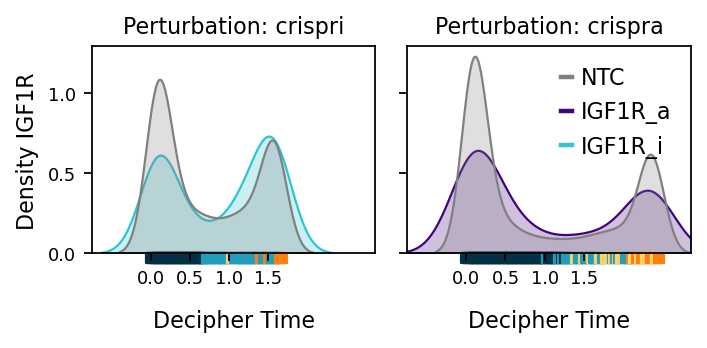

2026-02-13 18:44:05,071 | INFO : maxp pruned
2026-02-13 18:44:05,075 | INFO : cmap pruned
2026-02-13 18:44:05,076 | INFO : kern dropped
2026-02-13 18:44:05,076 | INFO : post pruned
2026-02-13 18:44:05,076 | INFO : FFTM dropped
2026-02-13 18:44:05,076 | INFO : GPOS pruned
2026-02-13 18:44:05,078 | INFO : GSUB pruned
2026-02-13 18:44:05,081 | INFO : glyf pruned
2026-02-13 18:44:05,081 | INFO : Added gid0 to subset
2026-02-13 18:44:05,082 | INFO : Added first four glyphs to subset
2026-02-13 18:44:05,082 | INFO : Closing glyph list over 'GSUB': 32 glyphs before
2026-02-13 18:44:05,082 | INFO : Glyph names: ['.notdef', '.null', 'A', 'C', 'D', 'K', 'N', 'P', 'T', 'a', 'b', 'c', 'colon', 'e', 'five', 'h', 'i', 'm', 'n', 'nonmarkingreturn', 'o', 'one', 'p', 'period', 'r', 's', 'space', 't', 'u', 'underscore', 'y', 'zero']
2026-02-13 18:44:05,082 | INFO : Glyph IDs:   [0, 1, 2, 3, 17, 19, 20, 24, 29, 36, 38, 39, 46, 49, 51, 55, 66, 68, 69, 70, 72, 75, 76, 80, 81, 82, 83, 85, 86, 87, 88, 92]
20

Added crispri_class to axes[0] for crispri
Added crispra_class to axes[1] for crispra


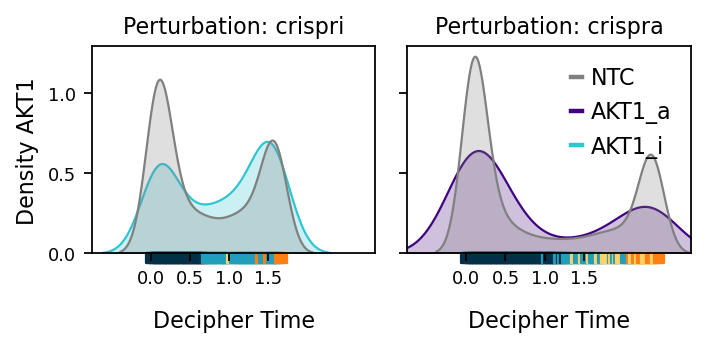

2026-02-13 18:44:05,359 | INFO : maxp pruned
2026-02-13 18:44:05,363 | INFO : cmap pruned
2026-02-13 18:44:05,363 | INFO : kern dropped
2026-02-13 18:44:05,363 | INFO : post pruned
2026-02-13 18:44:05,363 | INFO : FFTM dropped
2026-02-13 18:44:05,364 | INFO : GPOS pruned
2026-02-13 18:44:05,365 | INFO : GSUB pruned
2026-02-13 18:44:05,369 | INFO : glyf pruned
2026-02-13 18:44:05,369 | INFO : Added gid0 to subset
2026-02-13 18:44:05,369 | INFO : Added first four glyphs to subset
2026-02-13 18:44:05,369 | INFO : Closing glyph list over 'GSUB': 33 glyphs before
2026-02-13 18:44:05,369 | INFO : Glyph names: ['.notdef', '.null', 'C', 'D', 'K', 'N', 'P', 'S', 'T', 'a', 'b', 'c', 'colon', 'e', 'five', 'four', 'h', 'i', 'm', 'n', 'nonmarkingreturn', 'o', 'one', 'p', 'period', 'r', 's', 'space', 't', 'u', 'underscore', 'y', 'zero']
2026-02-13 18:44:05,370 | INFO : Glyph IDs:   [0, 1, 2, 3, 17, 19, 20, 23, 24, 29, 38, 39, 46, 49, 51, 54, 55, 66, 68, 69, 70, 72, 75, 76, 80, 81, 82, 83, 85, 86, 87

Added crispri_class to axes[0] for crispri
Added crispra_class to axes[1] for crispra


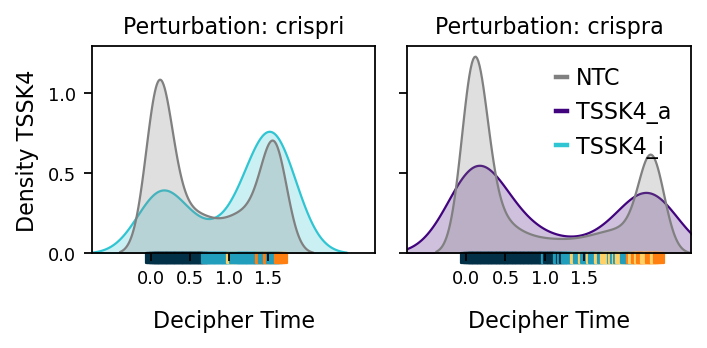

2026-02-13 18:44:05,667 | INFO : maxp pruned
2026-02-13 18:44:05,671 | INFO : cmap pruned
2026-02-13 18:44:05,672 | INFO : kern dropped
2026-02-13 18:44:05,672 | INFO : post pruned
2026-02-13 18:44:05,672 | INFO : FFTM dropped
2026-02-13 18:44:05,673 | INFO : GPOS pruned
2026-02-13 18:44:05,674 | INFO : GSUB pruned
2026-02-13 18:44:05,677 | INFO : glyf pruned
2026-02-13 18:44:05,677 | INFO : Added gid0 to subset
2026-02-13 18:44:05,678 | INFO : Added first four glyphs to subset
2026-02-13 18:44:05,678 | INFO : Closing glyph list over 'GSUB': 34 glyphs before
2026-02-13 18:44:05,678 | INFO : Glyph names: ['.notdef', '.null', 'C', 'D', 'G', 'K', 'N', 'P', 'R', 'T', 'a', 'b', 'c', 'colon', 'e', 'five', 'h', 'i', 'm', 'n', 'nonmarkingreturn', 'o', 'one', 'p', 'period', 'r', 's', 'space', 't', 'two', 'u', 'underscore', 'y', 'zero']
2026-02-13 18:44:05,678 | INFO : Glyph IDs:   [0, 1, 2, 3, 17, 19, 20, 21, 24, 29, 38, 39, 42, 46, 49, 51, 53, 55, 66, 68, 69, 70, 72, 75, 76, 80, 81, 82, 83, 85

Added crispri_class to axes[0] for crispri
Added crispra_class to axes[1] for crispra


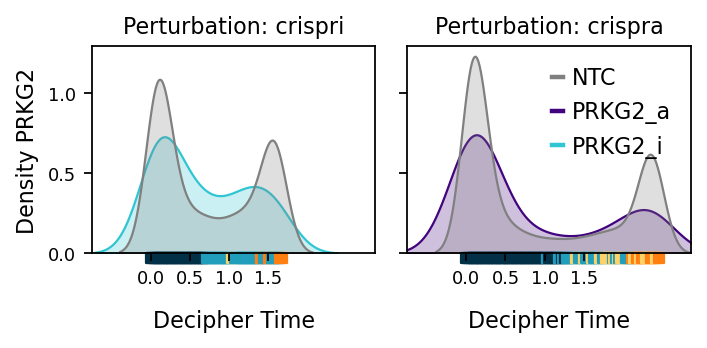

2026-02-13 18:44:05,960 | INFO : maxp pruned
2026-02-13 18:44:05,964 | INFO : cmap pruned
2026-02-13 18:44:05,964 | INFO : kern dropped
2026-02-13 18:44:05,964 | INFO : post pruned
2026-02-13 18:44:05,965 | INFO : FFTM dropped
2026-02-13 18:44:05,965 | INFO : GPOS pruned
2026-02-13 18:44:05,967 | INFO : GSUB pruned
2026-02-13 18:44:05,970 | INFO : glyf pruned
2026-02-13 18:44:05,970 | INFO : Added gid0 to subset
2026-02-13 18:44:05,970 | INFO : Added first four glyphs to subset
2026-02-13 18:44:05,970 | INFO : Closing glyph list over 'GSUB': 35 glyphs before
2026-02-13 18:44:05,970 | INFO : Glyph names: ['.notdef', '.null', 'A', 'C', 'D', 'G', 'K', 'N', 'P', 'S', 'T', 'a', 'b', 'c', 'colon', 'e', 'five', 'h', 'i', 'm', 'n', 'nonmarkingreturn', 'o', 'one', 'p', 'period', 'r', 's', 'space', 't', 'three', 'u', 'underscore', 'y', 'zero']
2026-02-13 18:44:05,971 | INFO : Glyph IDs:   [0, 1, 2, 3, 17, 19, 20, 22, 24, 29, 36, 38, 39, 42, 46, 49, 51, 54, 55, 66, 68, 69, 70, 72, 75, 76, 80, 81,

Added crispri_class to axes[0] for crispri
Added crispra_class to axes[1] for crispra


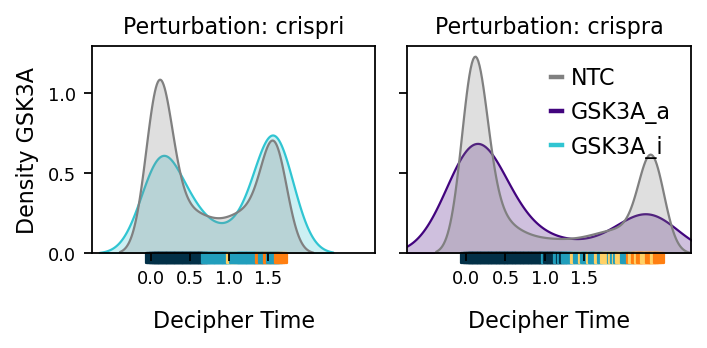

2026-02-13 18:44:06,247 | INFO : maxp pruned
2026-02-13 18:44:06,251 | INFO : cmap pruned
2026-02-13 18:44:06,252 | INFO : kern dropped
2026-02-13 18:44:06,252 | INFO : post pruned
2026-02-13 18:44:06,252 | INFO : FFTM dropped
2026-02-13 18:44:06,253 | INFO : GPOS pruned
2026-02-13 18:44:06,254 | INFO : GSUB pruned
2026-02-13 18:44:06,257 | INFO : glyf pruned
2026-02-13 18:44:06,257 | INFO : Added gid0 to subset
2026-02-13 18:44:06,257 | INFO : Added first four glyphs to subset
2026-02-13 18:44:06,257 | INFO : Closing glyph list over 'GSUB': 35 glyphs before
2026-02-13 18:44:06,257 | INFO : Glyph names: ['.notdef', '.null', 'C', 'D', 'K', 'L', 'N', 'P', 'S', 'T', 'a', 'b', 'c', 'colon', 'e', 'eight', 'five', 'h', 'i', 'm', 'n', 'nonmarkingreturn', 'o', 'one', 'p', 'period', 'r', 's', 'space', 't', 'three', 'u', 'underscore', 'y', 'zero']
2026-02-13 18:44:06,258 | INFO : Glyph IDs:   [0, 1, 2, 3, 17, 19, 20, 22, 24, 27, 29, 38, 39, 46, 47, 49, 51, 54, 55, 66, 68, 69, 70, 72, 75, 76, 80,

Added crispri_class to axes[0] for crispri
Added crispra_class to axes[1] for crispra


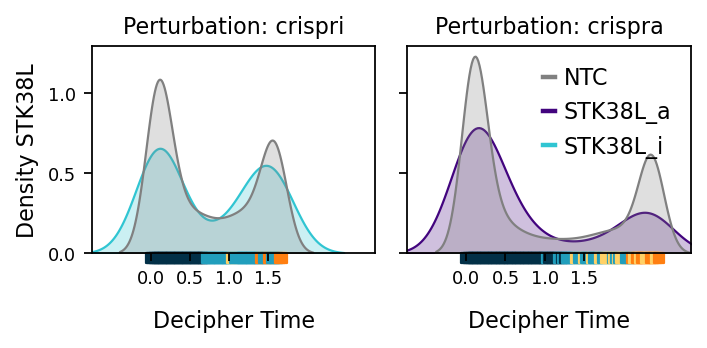

2026-02-13 18:44:06,534 | INFO : maxp pruned
2026-02-13 18:44:06,539 | INFO : cmap pruned
2026-02-13 18:44:06,539 | INFO : kern dropped
2026-02-13 18:44:06,539 | INFO : post pruned
2026-02-13 18:44:06,539 | INFO : FFTM dropped
2026-02-13 18:44:06,540 | INFO : GPOS pruned
2026-02-13 18:44:06,541 | INFO : GSUB pruned
2026-02-13 18:44:06,544 | INFO : glyf pruned
2026-02-13 18:44:06,545 | INFO : Added gid0 to subset
2026-02-13 18:44:06,545 | INFO : Added first four glyphs to subset
2026-02-13 18:44:06,545 | INFO : Closing glyph list over 'GSUB': 34 glyphs before
2026-02-13 18:44:06,545 | INFO : Glyph names: ['.notdef', '.null', 'B', 'C', 'D', 'I', 'K', 'N', 'P', 'T', 'a', 'b', 'c', 'colon', 'e', 'five', 'h', 'i', 'm', 'n', 'nonmarkingreturn', 'o', 'one', 'p', 'period', 'r', 's', 'space', 't', 'three', 'u', 'underscore', 'y', 'zero']
2026-02-13 18:44:06,545 | INFO : Glyph IDs:   [0, 1, 2, 3, 17, 19, 20, 22, 24, 29, 37, 38, 39, 44, 46, 49, 51, 55, 66, 68, 69, 70, 72, 75, 76, 80, 81, 82, 83, 

Added crispri_class to axes[0] for crispri
Added crispra_class to axes[1] for crispra


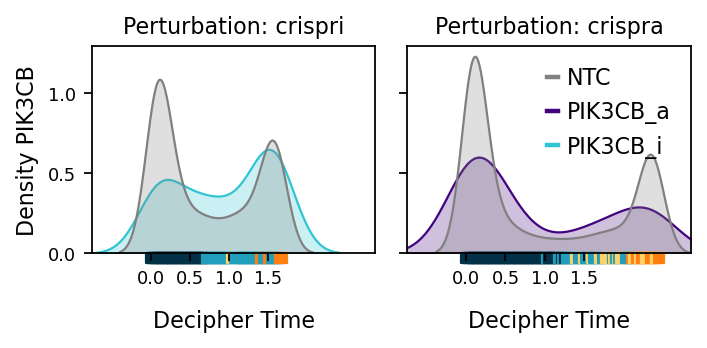

2026-02-13 18:44:06,818 | INFO : maxp pruned
2026-02-13 18:44:06,822 | INFO : cmap pruned
2026-02-13 18:44:06,823 | INFO : kern dropped
2026-02-13 18:44:06,823 | INFO : post pruned
2026-02-13 18:44:06,823 | INFO : FFTM dropped
2026-02-13 18:44:06,824 | INFO : GPOS pruned
2026-02-13 18:44:06,825 | INFO : GSUB pruned
2026-02-13 18:44:06,828 | INFO : glyf pruned
2026-02-13 18:44:06,829 | INFO : Added gid0 to subset
2026-02-13 18:44:06,829 | INFO : Added first four glyphs to subset
2026-02-13 18:44:06,829 | INFO : Closing glyph list over 'GSUB': 35 glyphs before
2026-02-13 18:44:06,829 | INFO : Glyph names: ['.notdef', '.null', 'A', 'C', 'D', 'I', 'K', 'N', 'P', 'R', 'T', 'a', 'b', 'c', 'colon', 'e', 'five', 'four', 'h', 'i', 'm', 'n', 'nonmarkingreturn', 'o', 'one', 'p', 'period', 'r', 's', 'space', 't', 'u', 'underscore', 'y', 'zero']
2026-02-13 18:44:06,829 | INFO : Glyph IDs:   [0, 1, 2, 3, 17, 19, 20, 23, 24, 29, 36, 38, 39, 44, 46, 49, 51, 53, 55, 66, 68, 69, 70, 72, 75, 76, 80, 81, 

Added crispri_class to axes[0] for crispri
Added crispra_class to axes[1] for crispra


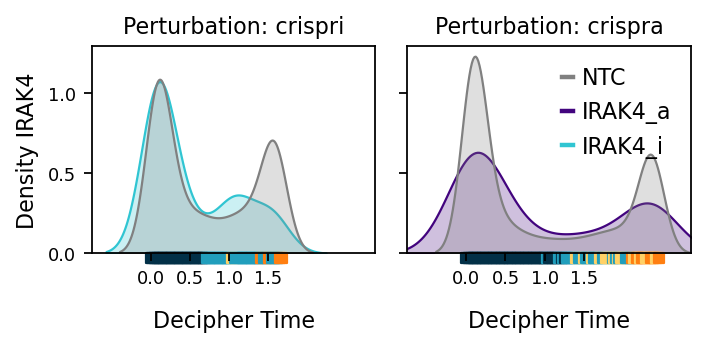

2026-02-13 18:44:07,103 | INFO : maxp pruned
2026-02-13 18:44:07,107 | INFO : cmap pruned
2026-02-13 18:44:07,107 | INFO : kern dropped
2026-02-13 18:44:07,107 | INFO : post pruned
2026-02-13 18:44:07,108 | INFO : FFTM dropped
2026-02-13 18:44:07,109 | INFO : GPOS pruned
2026-02-13 18:44:07,110 | INFO : GSUB pruned
2026-02-13 18:44:07,112 | INFO : glyf pruned
2026-02-13 18:44:07,113 | INFO : Added gid0 to subset
2026-02-13 18:44:07,113 | INFO : Added first four glyphs to subset
2026-02-13 18:44:07,113 | INFO : Closing glyph list over 'GSUB': 34 glyphs before
2026-02-13 18:44:07,113 | INFO : Glyph names: ['.notdef', '.null', 'A', 'C', 'D', 'K', 'M', 'N', 'P', 'T', 'a', 'b', 'c', 'colon', 'e', 'five', 'h', 'i', 'm', 'n', 'nonmarkingreturn', 'o', 'one', 'p', 'period', 'r', 's', 'space', 't', 'two', 'u', 'underscore', 'y', 'zero']
2026-02-13 18:44:07,114 | INFO : Glyph IDs:   [0, 1, 2, 3, 17, 19, 20, 21, 24, 29, 36, 38, 39, 46, 48, 49, 51, 55, 66, 68, 69, 70, 72, 75, 76, 80, 81, 82, 83, 85

Added crispri_class to axes[0] for crispri
Added crispra_class to axes[1] for crispra


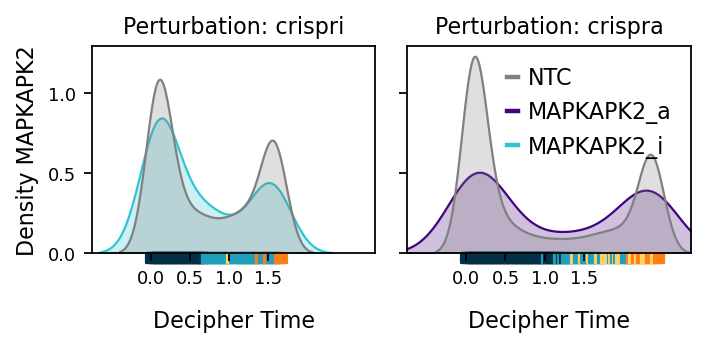

2026-02-13 18:44:07,391 | INFO : maxp pruned
2026-02-13 18:44:07,395 | INFO : cmap pruned
2026-02-13 18:44:07,395 | INFO : kern dropped
2026-02-13 18:44:07,396 | INFO : post pruned
2026-02-13 18:44:07,396 | INFO : FFTM dropped
2026-02-13 18:44:07,396 | INFO : GPOS pruned
2026-02-13 18:44:07,398 | INFO : GSUB pruned


Added crispri_class to axes[0] for crispri
Added crispra_class to axes[1] for crispra


2026-02-13 18:44:07,696 | INFO : glyf pruned
2026-02-13 18:44:07,697 | INFO : Added gid0 to subset
2026-02-13 18:44:07,698 | INFO : Added first four glyphs to subset
2026-02-13 18:44:07,698 | INFO : Closing glyph list over 'GSUB': 32 glyphs before
2026-02-13 18:44:07,698 | INFO : Glyph names: ['.notdef', '.null', 'C', 'D', 'E', 'M', 'N', 'P', 'T', 'a', 'b', 'c', 'colon', 'e', 'five', 'h', 'i', 'm', 'n', 'nonmarkingreturn', 'o', 'one', 'p', 'period', 'r', 's', 'space', 't', 'u', 'underscore', 'y', 'zero']
2026-02-13 18:44:07,698 | INFO : Glyph IDs:   [0, 1, 2, 3, 17, 19, 20, 24, 29, 38, 39, 40, 48, 49, 51, 55, 66, 68, 69, 70, 72, 75, 76, 80, 81, 82, 83, 85, 86, 87, 88, 92]
2026-02-13 18:44:07,699 | INFO : Closed glyph list over 'GSUB': 32 glyphs after
2026-02-13 18:44:07,700 | INFO : Glyph names: ['.notdef', '.null', 'C', 'D', 'E', 'M', 'N', 'P', 'T', 'a', 'b', 'c', 'colon', 'e', 'five', 'h', 'i', 'm', 'n', 'nonmarkingreturn', 'o', 'one', 'p', 'period', 'r', 's', 'space', 't', 'u', 'und

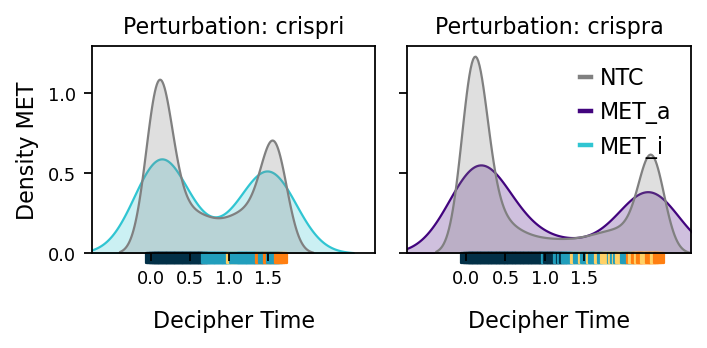

2026-02-13 18:44:07,971 | INFO : maxp pruned
2026-02-13 18:44:07,975 | INFO : cmap pruned
2026-02-13 18:44:07,975 | INFO : kern dropped
2026-02-13 18:44:07,975 | INFO : post pruned
2026-02-13 18:44:07,975 | INFO : FFTM dropped
2026-02-13 18:44:07,976 | INFO : GPOS pruned
2026-02-13 18:44:07,978 | INFO : GSUB pruned
2026-02-13 18:44:07,980 | INFO : glyf pruned
2026-02-13 18:44:07,981 | INFO : Added gid0 to subset
2026-02-13 18:44:07,981 | INFO : Added first four glyphs to subset
2026-02-13 18:44:07,981 | INFO : Closing glyph list over 'GSUB': 35 glyphs before
2026-02-13 18:44:07,981 | INFO : Glyph names: ['.notdef', '.null', 'A', 'C', 'D', 'K', 'M', 'N', 'P', 'T', 'a', 'b', 'c', 'colon', 'e', 'five', 'four', 'h', 'i', 'm', 'n', 'nonmarkingreturn', 'o', 'one', 'p', 'period', 'r', 's', 'space', 't', 'two', 'u', 'underscore', 'y', 'zero']
2026-02-13 18:44:07,982 | INFO : Glyph IDs:   [0, 1, 2, 3, 17, 19, 20, 21, 23, 24, 29, 36, 38, 39, 46, 48, 49, 51, 55, 66, 68, 69, 70, 72, 75, 76, 80, 81

Added crispri_class to axes[0] for crispri
Added crispra_class to axes[1] for crispra


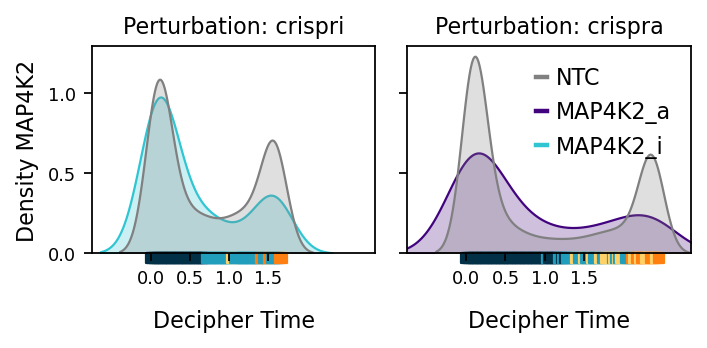

2026-02-13 18:44:08,260 | INFO : maxp pruned
2026-02-13 18:44:08,265 | INFO : cmap pruned
2026-02-13 18:44:08,265 | INFO : kern dropped
2026-02-13 18:44:08,265 | INFO : post pruned
2026-02-13 18:44:08,265 | INFO : FFTM dropped
2026-02-13 18:44:08,266 | INFO : GPOS pruned
2026-02-13 18:44:08,267 | INFO : GSUB pruned
2026-02-13 18:44:08,271 | INFO : glyf pruned
2026-02-13 18:44:08,272 | INFO : Added gid0 to subset
2026-02-13 18:44:08,272 | INFO : Added first four glyphs to subset
2026-02-13 18:44:08,272 | INFO : Closing glyph list over 'GSUB': 34 glyphs before
2026-02-13 18:44:08,272 | INFO : Glyph names: ['.notdef', '.null', 'C', 'D', 'I', 'K', 'L', 'M', 'N', 'P', 'T', 'a', 'b', 'c', 'colon', 'e', 'five', 'h', 'i', 'm', 'n', 'nonmarkingreturn', 'o', 'one', 'p', 'period', 'r', 's', 'space', 't', 'u', 'underscore', 'y', 'zero']
2026-02-13 18:44:08,273 | INFO : Glyph IDs:   [0, 1, 2, 3, 17, 19, 20, 24, 29, 38, 39, 44, 46, 47, 48, 49, 51, 55, 66, 68, 69, 70, 72, 75, 76, 80, 81, 82, 83, 85, 

Added crispri_class to axes[0] for crispri
Added crispra_class to axes[1] for crispra


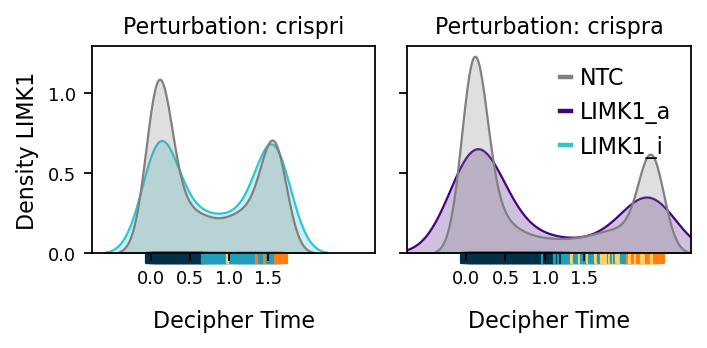

2026-02-13 18:44:08,560 | INFO : maxp pruned
2026-02-13 18:44:08,564 | INFO : cmap pruned
2026-02-13 18:44:08,564 | INFO : kern dropped
2026-02-13 18:44:08,564 | INFO : post pruned
2026-02-13 18:44:08,564 | INFO : FFTM dropped
2026-02-13 18:44:08,566 | INFO : GPOS pruned
2026-02-13 18:44:08,567 | INFO : GSUB pruned
2026-02-13 18:44:08,571 | INFO : glyf pruned
2026-02-13 18:44:08,572 | INFO : Added gid0 to subset
2026-02-13 18:44:08,572 | INFO : Added first four glyphs to subset
2026-02-13 18:44:08,572 | INFO : Closing glyph list over 'GSUB': 31 glyphs before
2026-02-13 18:44:08,572 | INFO : Glyph names: ['.notdef', '.null', 'C', 'D', 'N', 'P', 'T', 'a', 'b', 'c', 'colon', 'e', 'five', 'h', 'i', 'm', 'n', 'nonmarkingreturn', 'o', 'one', 'p', 'period', 'r', 's', 'seven', 'space', 't', 'u', 'underscore', 'y', 'zero']
2026-02-13 18:44:08,573 | INFO : Glyph IDs:   [0, 1, 2, 3, 17, 19, 20, 24, 26, 29, 38, 39, 49, 51, 55, 66, 68, 69, 70, 72, 75, 76, 80, 81, 82, 83, 85, 86, 87, 88, 92]
2026-02

Added crispri_class to axes[0] for crispri
Added crispra_class to axes[1] for crispra


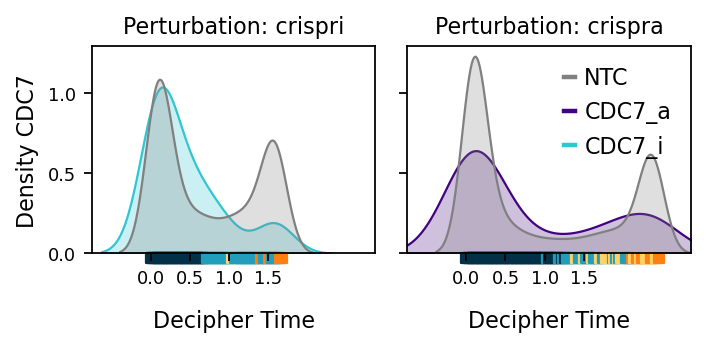

2026-02-13 18:44:08,854 | INFO : maxp pruned
2026-02-13 18:44:08,858 | INFO : cmap pruned
2026-02-13 18:44:08,858 | INFO : kern dropped
2026-02-13 18:44:08,858 | INFO : post pruned
2026-02-13 18:44:08,858 | INFO : FFTM dropped
2026-02-13 18:44:08,859 | INFO : GPOS pruned
2026-02-13 18:44:08,860 | INFO : GSUB pruned
2026-02-13 18:44:08,863 | INFO : glyf pruned
2026-02-13 18:44:08,864 | INFO : Added gid0 to subset
2026-02-13 18:44:08,864 | INFO : Added first four glyphs to subset
2026-02-13 18:44:08,864 | INFO : Closing glyph list over 'GSUB': 32 glyphs before
2026-02-13 18:44:08,864 | INFO : Glyph names: ['.notdef', '.null', 'C', 'D', 'K', 'L', 'N', 'P', 'T', 'a', 'b', 'c', 'colon', 'e', 'five', 'h', 'i', 'm', 'n', 'nonmarkingreturn', 'o', 'one', 'p', 'period', 'r', 's', 'space', 't', 'u', 'underscore', 'y', 'zero']
2026-02-13 18:44:08,865 | INFO : Glyph IDs:   [0, 1, 2, 3, 17, 19, 20, 24, 29, 38, 39, 46, 47, 49, 51, 55, 66, 68, 69, 70, 72, 75, 76, 80, 81, 82, 83, 85, 86, 87, 88, 92]
20

Added crispri_class to axes[0] for crispri
Added crispra_class to axes[1] for crispra


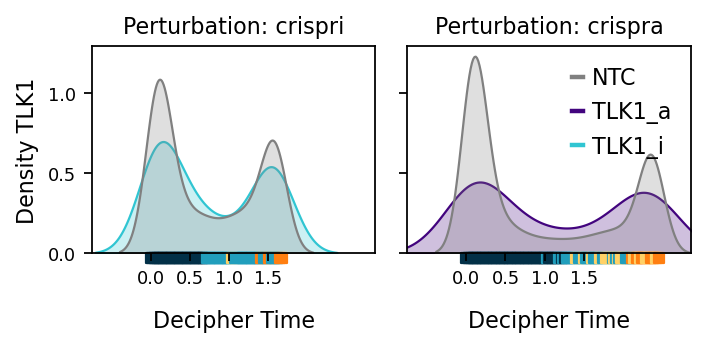

2026-02-13 18:44:09,129 | INFO : maxp pruned
2026-02-13 18:44:09,133 | INFO : cmap pruned
2026-02-13 18:44:09,134 | INFO : kern dropped
2026-02-13 18:44:09,134 | INFO : post pruned
2026-02-13 18:44:09,134 | INFO : FFTM dropped
2026-02-13 18:44:09,135 | INFO : GPOS pruned
2026-02-13 18:44:09,136 | INFO : GSUB pruned
2026-02-13 18:44:09,139 | INFO : glyf pruned
2026-02-13 18:44:09,139 | INFO : Added gid0 to subset
2026-02-13 18:44:09,139 | INFO : Added first four glyphs to subset
2026-02-13 18:44:09,139 | INFO : Closing glyph list over 'GSUB': 33 glyphs before
2026-02-13 18:44:09,139 | INFO : Glyph names: ['.notdef', '.null', 'C', 'D', 'M', 'N', 'O', 'P', 'R', 'T', 'a', 'b', 'c', 'colon', 'e', 'five', 'h', 'i', 'm', 'n', 'nonmarkingreturn', 'o', 'one', 'p', 'period', 'r', 's', 'space', 't', 'u', 'underscore', 'y', 'zero']
2026-02-13 18:44:09,140 | INFO : Glyph IDs:   [0, 1, 2, 3, 17, 19, 20, 24, 29, 38, 39, 48, 49, 50, 51, 53, 55, 66, 68, 69, 70, 72, 75, 76, 80, 81, 82, 83, 85, 86, 87, 8

Added crispri_class to axes[0] for crispri
Added crispra_class to axes[1] for crispra


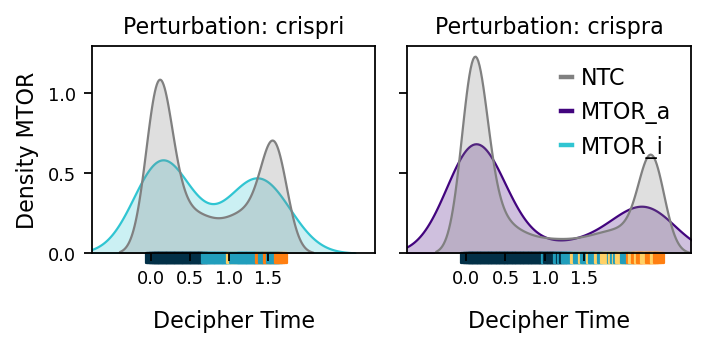

2026-02-13 18:44:09,419 | INFO : maxp pruned
2026-02-13 18:44:09,423 | INFO : cmap pruned
2026-02-13 18:44:09,423 | INFO : kern dropped
2026-02-13 18:44:09,423 | INFO : post pruned
2026-02-13 18:44:09,423 | INFO : FFTM dropped
2026-02-13 18:44:09,424 | INFO : GPOS pruned
2026-02-13 18:44:09,425 | INFO : GSUB pruned
2026-02-13 18:44:09,428 | INFO : glyf pruned
2026-02-13 18:44:09,429 | INFO : Added gid0 to subset
2026-02-13 18:44:09,429 | INFO : Added first four glyphs to subset
2026-02-13 18:44:09,429 | INFO : Closing glyph list over 'GSUB': 35 glyphs before
2026-02-13 18:44:09,429 | INFO : Glyph names: ['.notdef', '.null', 'A', 'C', 'D', 'I', 'K', 'N', 'P', 'T', 'a', 'b', 'c', 'colon', 'e', 'eight', 'five', 'four', 'h', 'i', 'm', 'n', 'nonmarkingreturn', 'o', 'one', 'p', 'period', 'r', 's', 'space', 't', 'u', 'underscore', 'y', 'zero']
2026-02-13 18:44:09,430 | INFO : Glyph IDs:   [0, 1, 2, 3, 17, 19, 20, 23, 24, 27, 29, 36, 38, 39, 44, 46, 49, 51, 55, 66, 68, 69, 70, 72, 75, 76, 80, 

Added crispri_class to axes[0] for crispri
Added crispra_class to axes[1] for crispra


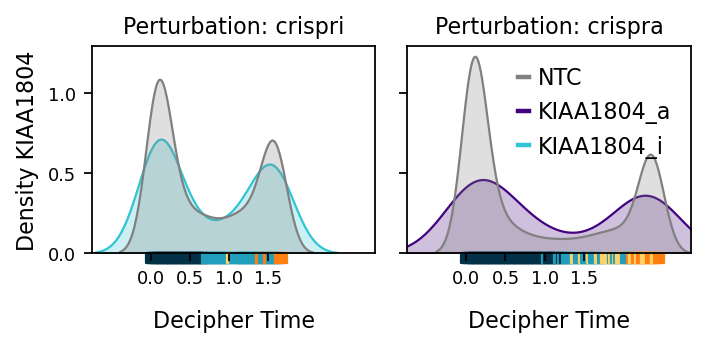

2026-02-13 18:44:09,699 | INFO : maxp pruned
2026-02-13 18:44:09,703 | INFO : cmap pruned
2026-02-13 18:44:09,704 | INFO : kern dropped
2026-02-13 18:44:09,704 | INFO : post pruned
2026-02-13 18:44:09,704 | INFO : FFTM dropped
2026-02-13 18:44:09,705 | INFO : GPOS pruned
2026-02-13 18:44:09,706 | INFO : GSUB pruned
2026-02-13 18:44:09,709 | INFO : glyf pruned
2026-02-13 18:44:09,710 | INFO : Added gid0 to subset
2026-02-13 18:44:09,710 | INFO : Added first four glyphs to subset
2026-02-13 18:44:09,710 | INFO : Closing glyph list over 'GSUB': 33 glyphs before
2026-02-13 18:44:09,710 | INFO : Glyph names: ['.notdef', '.null', 'A', 'C', 'D', 'K', 'M', 'N', 'P', 'T', 'a', 'b', 'c', 'colon', 'e', 'five', 'h', 'i', 'm', 'n', 'nonmarkingreturn', 'o', 'one', 'p', 'period', 'r', 's', 'space', 't', 'u', 'underscore', 'y', 'zero']
2026-02-13 18:44:09,711 | INFO : Glyph IDs:   [0, 1, 2, 3, 17, 19, 20, 24, 29, 36, 38, 39, 46, 48, 49, 51, 55, 66, 68, 69, 70, 72, 75, 76, 80, 81, 82, 83, 85, 86, 87, 8

Added crispri_class to axes[0] for crispri
Added crispra_class to axes[1] for crispra


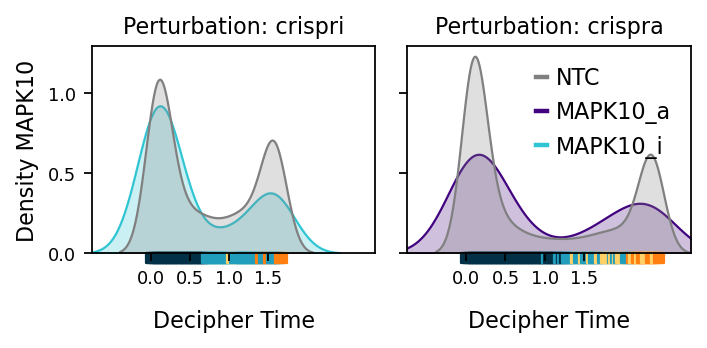

2026-02-13 18:44:09,970 | INFO : maxp pruned
2026-02-13 18:44:09,974 | INFO : cmap pruned
2026-02-13 18:44:09,974 | INFO : kern dropped
2026-02-13 18:44:09,974 | INFO : post pruned
2026-02-13 18:44:09,974 | INFO : FFTM dropped
2026-02-13 18:44:09,975 | INFO : GPOS pruned
2026-02-13 18:44:09,976 | INFO : GSUB pruned
2026-02-13 18:44:09,979 | INFO : glyf pruned
2026-02-13 18:44:09,980 | INFO : Added gid0 to subset
2026-02-13 18:44:09,980 | INFO : Added first four glyphs to subset
2026-02-13 18:44:09,980 | INFO : Closing glyph list over 'GSUB': 32 glyphs before
2026-02-13 18:44:09,980 | INFO : Glyph names: ['.notdef', '.null', 'A', 'C', 'D', 'K', 'N', 'P', 'T', 'a', 'b', 'c', 'colon', 'e', 'five', 'h', 'i', 'm', 'n', 'nonmarkingreturn', 'o', 'one', 'p', 'period', 'r', 's', 'space', 't', 'u', 'underscore', 'y', 'zero']
2026-02-13 18:44:09,981 | INFO : Glyph IDs:   [0, 1, 2, 3, 17, 19, 20, 24, 29, 36, 38, 39, 46, 49, 51, 55, 66, 68, 69, 70, 72, 75, 76, 80, 81, 82, 83, 85, 86, 87, 88, 92]
20

Added crispri_class to axes[0] for crispri
Added crispra_class to axes[1] for crispra


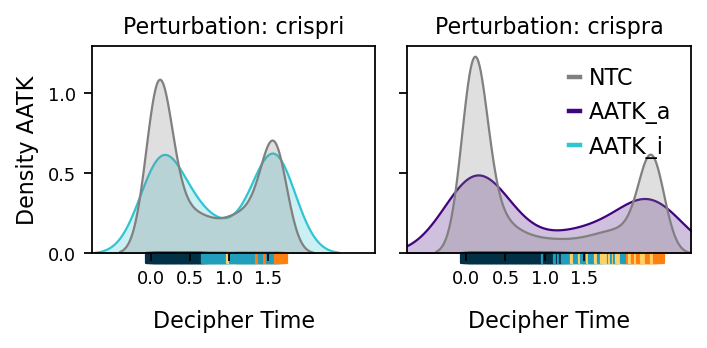

2026-02-13 18:44:10,285 | INFO : maxp pruned
2026-02-13 18:44:10,289 | INFO : cmap pruned
2026-02-13 18:44:10,289 | INFO : kern dropped
2026-02-13 18:44:10,289 | INFO : post pruned
2026-02-13 18:44:10,290 | INFO : FFTM dropped
2026-02-13 18:44:10,290 | INFO : GPOS pruned
2026-02-13 18:44:10,291 | INFO : GSUB pruned
2026-02-13 18:44:10,295 | INFO : glyf pruned
2026-02-13 18:44:10,295 | INFO : Added gid0 to subset
2026-02-13 18:44:10,295 | INFO : Added first four glyphs to subset
2026-02-13 18:44:10,295 | INFO : Closing glyph list over 'GSUB': 35 glyphs before
2026-02-13 18:44:10,296 | INFO : Glyph names: ['.notdef', '.null', 'B', 'C', 'D', 'K', 'N', 'P', 'S', 'T', 'a', 'b', 'c', 'colon', 'e', 'five', 'h', 'i', 'm', 'n', 'nonmarkingreturn', 'o', 'one', 'p', 'period', 'r', 's', 'space', 't', 'three', 'two', 'u', 'underscore', 'y', 'zero']
2026-02-13 18:44:10,296 | INFO : Glyph IDs:   [0, 1, 2, 3, 17, 19, 20, 21, 22, 24, 29, 37, 38, 39, 46, 49, 51, 54, 55, 66, 68, 69, 70, 72, 75, 76, 80, 8

Added crispri_class to axes[0] for crispri
Added crispra_class to axes[1] for crispra


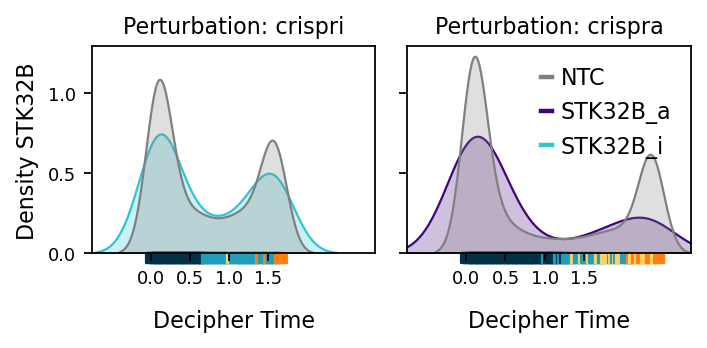

2026-02-13 18:44:10,567 | INFO : maxp pruned
2026-02-13 18:44:10,571 | INFO : cmap pruned
2026-02-13 18:44:10,571 | INFO : kern dropped
2026-02-13 18:44:10,572 | INFO : post pruned
2026-02-13 18:44:10,572 | INFO : FFTM dropped
2026-02-13 18:44:10,572 | INFO : GPOS pruned
2026-02-13 18:44:10,574 | INFO : GSUB pruned


Added crispri_class to axes[0] for crispri
Added crispra_class to axes[1] for crispra


2026-02-13 18:44:10,872 | INFO : glyf pruned
2026-02-13 18:44:10,873 | INFO : Added gid0 to subset
2026-02-13 18:44:10,873 | INFO : Added first four glyphs to subset
2026-02-13 18:44:10,874 | INFO : Closing glyph list over 'GSUB': 33 glyphs before
2026-02-13 18:44:10,874 | INFO : Glyph names: ['.notdef', '.null', 'A', 'C', 'D', 'K', 'N', 'P', 'S', 'T', 'a', 'b', 'c', 'colon', 'e', 'five', 'h', 'i', 'm', 'n', 'nonmarkingreturn', 'o', 'one', 'p', 'period', 'r', 's', 'space', 't', 'u', 'underscore', 'y', 'zero']
2026-02-13 18:44:10,874 | INFO : Glyph IDs:   [0, 1, 2, 3, 17, 19, 20, 24, 29, 36, 38, 39, 46, 49, 51, 54, 55, 66, 68, 69, 70, 72, 75, 76, 80, 81, 82, 83, 85, 86, 87, 88, 92]
2026-02-13 18:44:10,875 | INFO : Closed glyph list over 'GSUB': 33 glyphs after
2026-02-13 18:44:10,876 | INFO : Glyph names: ['.notdef', '.null', 'A', 'C', 'D', 'K', 'N', 'P', 'S', 'T', 'a', 'b', 'c', 'colon', 'e', 'five', 'h', 'i', 'm', 'n', 'nonmarkingreturn', 'o', 'one', 'p', 'period', 'r', 's', 'space', 

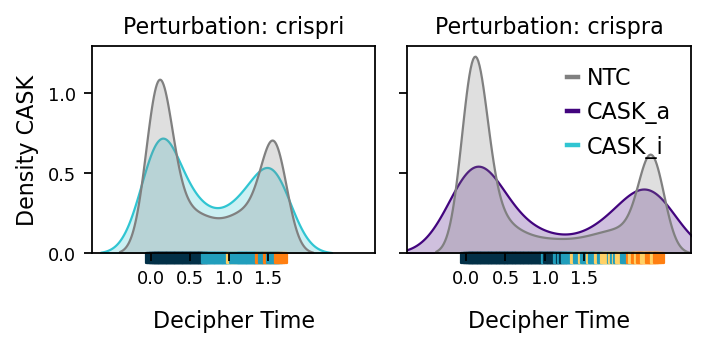

2026-02-13 18:44:11,147 | INFO : maxp pruned
2026-02-13 18:44:11,152 | INFO : cmap pruned
2026-02-13 18:44:11,152 | INFO : kern dropped
2026-02-13 18:44:11,152 | INFO : post pruned
2026-02-13 18:44:11,152 | INFO : FFTM dropped
2026-02-13 18:44:11,153 | INFO : GPOS pruned
2026-02-13 18:44:11,154 | INFO : GSUB pruned
2026-02-13 18:44:11,157 | INFO : glyf pruned
2026-02-13 18:44:11,158 | INFO : Added gid0 to subset
2026-02-13 18:44:11,158 | INFO : Added first four glyphs to subset
2026-02-13 18:44:11,158 | INFO : Closing glyph list over 'GSUB': 32 glyphs before
2026-02-13 18:44:11,158 | INFO : Glyph names: ['.notdef', '.null', 'C', 'D', 'I', 'M', 'N', 'P', 'T', 'a', 'b', 'c', 'colon', 'e', 'five', 'h', 'i', 'm', 'n', 'nonmarkingreturn', 'o', 'one', 'p', 'period', 'r', 's', 'space', 't', 'u', 'underscore', 'y', 'zero']
2026-02-13 18:44:11,159 | INFO : Glyph IDs:   [0, 1, 2, 3, 17, 19, 20, 24, 29, 38, 39, 44, 48, 49, 51, 55, 66, 68, 69, 70, 72, 75, 76, 80, 81, 82, 83, 85, 86, 87, 88, 92]
20

Added crispri_class to axes[0] for crispri
Added crispra_class to axes[1] for crispra


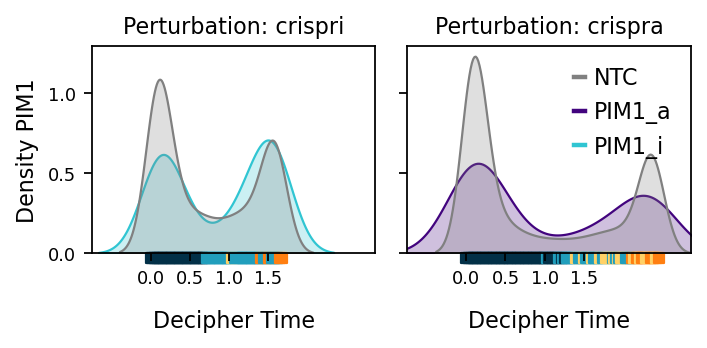

2026-02-13 18:44:11,421 | INFO : maxp pruned
2026-02-13 18:44:11,424 | INFO : cmap pruned
2026-02-13 18:44:11,425 | INFO : kern dropped
2026-02-13 18:44:11,425 | INFO : post pruned
2026-02-13 18:44:11,425 | INFO : FFTM dropped
2026-02-13 18:44:11,425 | INFO : GPOS pruned
2026-02-13 18:44:11,427 | INFO : GSUB pruned
2026-02-13 18:44:11,430 | INFO : glyf pruned
2026-02-13 18:44:11,430 | INFO : Added gid0 to subset
2026-02-13 18:44:11,430 | INFO : Added first four glyphs to subset
2026-02-13 18:44:11,430 | INFO : Closing glyph list over 'GSUB': 35 glyphs before
2026-02-13 18:44:11,430 | INFO : Glyph names: ['.notdef', '.null', 'A', 'B', 'C', 'D', 'K', 'N', 'P', 'R', 'T', 'U', 'a', 'b', 'c', 'colon', 'e', 'five', 'h', 'i', 'm', 'n', 'nonmarkingreturn', 'o', 'one', 'p', 'period', 'r', 's', 'space', 't', 'u', 'underscore', 'y', 'zero']
2026-02-13 18:44:11,431 | INFO : Glyph IDs:   [0, 1, 2, 3, 17, 19, 20, 24, 29, 36, 37, 38, 39, 46, 49, 51, 53, 55, 56, 66, 68, 69, 70, 72, 75, 76, 80, 81, 82,

Added crispri_class to axes[0] for crispri
Added crispra_class to axes[1] for crispra


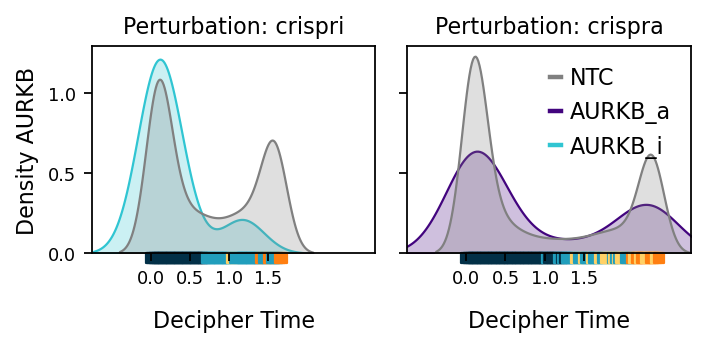

2026-02-13 18:44:11,698 | INFO : maxp pruned
2026-02-13 18:44:11,702 | INFO : cmap pruned
2026-02-13 18:44:11,703 | INFO : kern dropped
2026-02-13 18:44:11,703 | INFO : post pruned
2026-02-13 18:44:11,703 | INFO : FFTM dropped
2026-02-13 18:44:11,704 | INFO : GPOS pruned
2026-02-13 18:44:11,705 | INFO : GSUB pruned
2026-02-13 18:44:11,708 | INFO : glyf pruned
2026-02-13 18:44:11,708 | INFO : Added gid0 to subset
2026-02-13 18:44:11,708 | INFO : Added first four glyphs to subset
2026-02-13 18:44:11,708 | INFO : Closing glyph list over 'GSUB': 33 glyphs before
2026-02-13 18:44:11,708 | INFO : Glyph names: ['.notdef', '.null', 'C', 'D', 'E', 'K', 'N', 'P', 'T', 'a', 'b', 'c', 'colon', 'e', 'five', 'h', 'i', 'm', 'n', 'nine', 'nonmarkingreturn', 'o', 'one', 'p', 'period', 'r', 's', 'space', 't', 'u', 'underscore', 'y', 'zero']
2026-02-13 18:44:11,709 | INFO : Glyph IDs:   [0, 1, 2, 3, 17, 19, 20, 24, 28, 29, 38, 39, 40, 46, 49, 51, 55, 66, 68, 69, 70, 72, 75, 76, 80, 81, 82, 83, 85, 86, 87

Added crispri_class to axes[0] for crispri
Added crispra_class to axes[1] for crispra


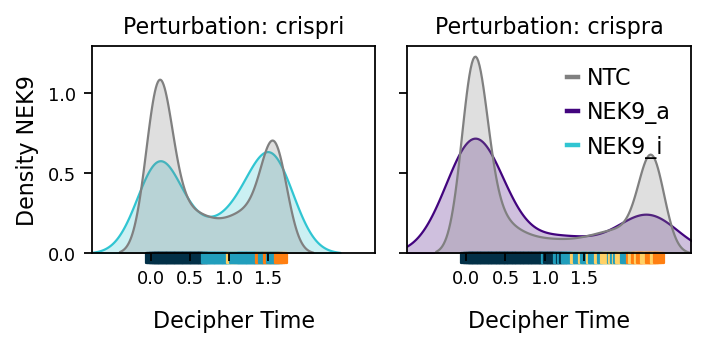

2026-02-13 18:44:11,981 | INFO : maxp pruned
2026-02-13 18:44:11,985 | INFO : cmap pruned
2026-02-13 18:44:11,985 | INFO : kern dropped
2026-02-13 18:44:11,985 | INFO : post pruned
2026-02-13 18:44:11,986 | INFO : FFTM dropped
2026-02-13 18:44:11,986 | INFO : GPOS pruned
2026-02-13 18:44:11,988 | INFO : GSUB pruned
2026-02-13 18:44:11,990 | INFO : glyf pruned
2026-02-13 18:44:11,991 | INFO : Added gid0 to subset
2026-02-13 18:44:11,991 | INFO : Added first four glyphs to subset
2026-02-13 18:44:11,991 | INFO : Closing glyph list over 'GSUB': 34 glyphs before
2026-02-13 18:44:11,991 | INFO : Glyph names: ['.notdef', '.null', 'A', 'C', 'D', 'K', 'M', 'N', 'P', 'T', 'a', 'b', 'c', 'colon', 'e', 'five', 'h', 'i', 'm', 'n', 'nonmarkingreturn', 'o', 'one', 'p', 'period', 'r', 's', 'six', 'space', 't', 'u', 'underscore', 'y', 'zero']
2026-02-13 18:44:11,992 | INFO : Glyph IDs:   [0, 1, 2, 3, 17, 19, 20, 24, 25, 29, 36, 38, 39, 46, 48, 49, 51, 55, 66, 68, 69, 70, 72, 75, 76, 80, 81, 82, 83, 85

Added crispri_class to axes[0] for crispri
Added crispra_class to axes[1] for crispra


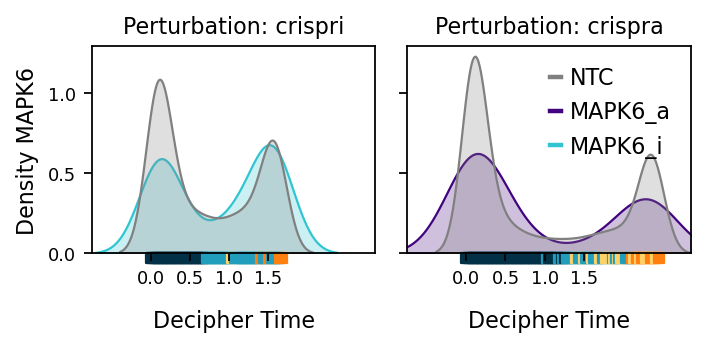

2026-02-13 18:44:12,268 | INFO : maxp pruned
2026-02-13 18:44:12,272 | INFO : cmap pruned
2026-02-13 18:44:12,272 | INFO : kern dropped
2026-02-13 18:44:12,273 | INFO : post pruned
2026-02-13 18:44:12,273 | INFO : FFTM dropped
2026-02-13 18:44:12,274 | INFO : GPOS pruned
2026-02-13 18:44:12,275 | INFO : GSUB pruned
2026-02-13 18:44:12,278 | INFO : glyf pruned
2026-02-13 18:44:12,278 | INFO : Added gid0 to subset
2026-02-13 18:44:12,278 | INFO : Added first four glyphs to subset
2026-02-13 18:44:12,278 | INFO : Closing glyph list over 'GSUB': 32 glyphs before
2026-02-13 18:44:12,278 | INFO : Glyph names: ['.notdef', '.null', 'A', 'C', 'D', 'N', 'P', 'R', 'T', 'a', 'b', 'c', 'colon', 'e', 'five', 'h', 'i', 'm', 'n', 'nonmarkingreturn', 'o', 'one', 'p', 'period', 'r', 's', 'space', 't', 'u', 'underscore', 'y', 'zero']
2026-02-13 18:44:12,279 | INFO : Glyph IDs:   [0, 1, 2, 3, 17, 19, 20, 24, 29, 36, 38, 39, 49, 51, 53, 55, 66, 68, 69, 70, 72, 75, 76, 80, 81, 82, 83, 85, 86, 87, 88, 92]
20

Added crispri_class to axes[0] for crispri
Added crispra_class to axes[1] for crispra


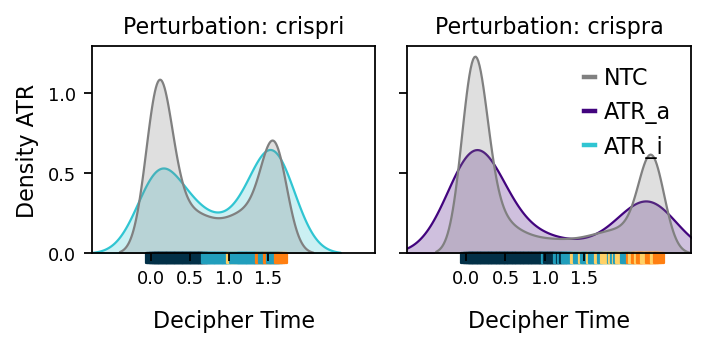

2026-02-13 18:44:12,551 | INFO : maxp pruned
2026-02-13 18:44:12,555 | INFO : cmap pruned
2026-02-13 18:44:12,556 | INFO : kern dropped
2026-02-13 18:44:12,556 | INFO : post pruned
2026-02-13 18:44:12,556 | INFO : FFTM dropped
2026-02-13 18:44:12,557 | INFO : GPOS pruned
2026-02-13 18:44:12,558 | INFO : GSUB pruned
2026-02-13 18:44:12,561 | INFO : glyf pruned
2026-02-13 18:44:12,562 | INFO : Added gid0 to subset
2026-02-13 18:44:12,562 | INFO : Added first four glyphs to subset
2026-02-13 18:44:12,562 | INFO : Closing glyph list over 'GSUB': 32 glyphs before
2026-02-13 18:44:12,562 | INFO : Glyph names: ['.notdef', '.null', 'C', 'D', 'K', 'M', 'N', 'P', 'T', 'a', 'b', 'c', 'colon', 'e', 'five', 'h', 'i', 'm', 'n', 'nonmarkingreturn', 'o', 'one', 'p', 'period', 'r', 's', 'space', 't', 'u', 'underscore', 'y', 'zero']
2026-02-13 18:44:12,563 | INFO : Glyph IDs:   [0, 1, 2, 3, 17, 19, 20, 24, 29, 38, 39, 46, 48, 49, 51, 55, 66, 68, 69, 70, 72, 75, 76, 80, 81, 82, 83, 85, 86, 87, 88, 92]
20

Added crispri_class to axes[0] for crispri
Added crispra_class to axes[1] for crispra


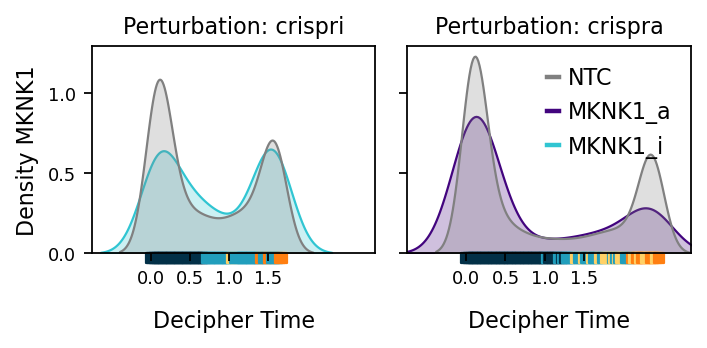

2026-02-13 18:44:12,830 | INFO : maxp pruned
2026-02-13 18:44:12,835 | INFO : cmap pruned
2026-02-13 18:44:12,835 | INFO : kern dropped
2026-02-13 18:44:12,835 | INFO : post pruned
2026-02-13 18:44:12,835 | INFO : FFTM dropped
2026-02-13 18:44:12,836 | INFO : GPOS pruned
2026-02-13 18:44:12,837 | INFO : GSUB pruned
2026-02-13 18:44:12,840 | INFO : glyf pruned
2026-02-13 18:44:12,841 | INFO : Added gid0 to subset
2026-02-13 18:44:12,841 | INFO : Added first four glyphs to subset
2026-02-13 18:44:12,841 | INFO : Closing glyph list over 'GSUB': 33 glyphs before
2026-02-13 18:44:12,841 | INFO : Glyph names: ['.notdef', '.null', 'C', 'D', 'K', 'L', 'N', 'P', 'T', 'a', 'b', 'c', 'colon', 'e', 'five', 'h', 'i', 'm', 'n', 'nonmarkingreturn', 'o', 'one', 'p', 'period', 'r', 's', 'space', 't', 'three', 'u', 'underscore', 'y', 'zero']
2026-02-13 18:44:12,842 | INFO : Glyph IDs:   [0, 1, 2, 3, 17, 19, 20, 22, 24, 29, 38, 39, 46, 47, 49, 51, 55, 66, 68, 69, 70, 72, 75, 76, 80, 81, 82, 83, 85, 86, 8

Added crispri_class to axes[0] for crispri
Added crispra_class to axes[1] for crispra


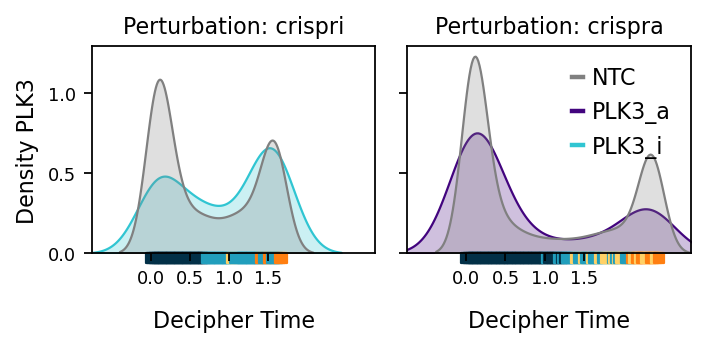

2026-02-13 18:44:13,117 | INFO : maxp pruned
2026-02-13 18:44:13,121 | INFO : cmap pruned
2026-02-13 18:44:13,121 | INFO : kern dropped
2026-02-13 18:44:13,121 | INFO : post pruned
2026-02-13 18:44:13,122 | INFO : FFTM dropped
2026-02-13 18:44:13,122 | INFO : GPOS pruned
2026-02-13 18:44:13,124 | INFO : GSUB pruned
2026-02-13 18:44:13,126 | INFO : glyf pruned
2026-02-13 18:44:13,127 | INFO : Added gid0 to subset
2026-02-13 18:44:13,127 | INFO : Added first four glyphs to subset
2026-02-13 18:44:13,127 | INFO : Closing glyph list over 'GSUB': 32 glyphs before
2026-02-13 18:44:13,127 | INFO : Glyph names: ['.notdef', '.null', 'A', 'C', 'D', 'K', 'N', 'P', 'T', 'a', 'b', 'c', 'colon', 'e', 'five', 'h', 'i', 'm', 'n', 'nonmarkingreturn', 'o', 'one', 'p', 'period', 'r', 's', 'space', 't', 'u', 'underscore', 'y', 'zero']
2026-02-13 18:44:13,127 | INFO : Glyph IDs:   [0, 1, 2, 3, 17, 19, 20, 24, 29, 36, 38, 39, 46, 49, 51, 55, 66, 68, 69, 70, 72, 75, 76, 80, 81, 82, 83, 85, 86, 87, 88, 92]
20

Added crispri_class to axes[0] for crispri
Added crispra_class to axes[1] for crispra


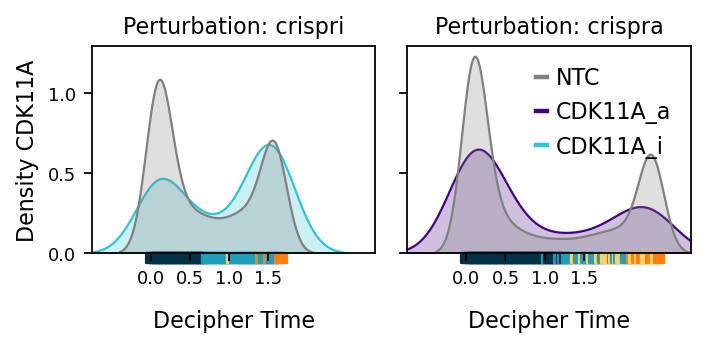

2026-02-13 18:44:13,408 | INFO : maxp pruned
2026-02-13 18:44:13,412 | INFO : cmap pruned
2026-02-13 18:44:13,412 | INFO : kern dropped
2026-02-13 18:44:13,412 | INFO : post pruned
2026-02-13 18:44:13,412 | INFO : FFTM dropped
2026-02-13 18:44:13,413 | INFO : GPOS pruned
2026-02-13 18:44:13,414 | INFO : GSUB pruned
2026-02-13 18:44:13,417 | INFO : glyf pruned
2026-02-13 18:44:13,418 | INFO : Added gid0 to subset
2026-02-13 18:44:13,418 | INFO : Added first four glyphs to subset
2026-02-13 18:44:13,418 | INFO : Closing glyph list over 'GSUB': 32 glyphs before
2026-02-13 18:44:13,418 | INFO : Glyph names: ['.notdef', '.null', 'C', 'D', 'K', 'L', 'N', 'P', 'T', 'a', 'b', 'c', 'colon', 'e', 'five', 'h', 'i', 'm', 'n', 'nonmarkingreturn', 'o', 'one', 'p', 'period', 'r', 's', 'space', 't', 'u', 'underscore', 'y', 'zero']
2026-02-13 18:44:13,419 | INFO : Glyph IDs:   [0, 1, 2, 3, 17, 19, 20, 24, 29, 38, 39, 46, 47, 49, 51, 55, 66, 68, 69, 70, 72, 75, 76, 80, 81, 82, 83, 85, 86, 87, 88, 92]
20

Added crispri_class to axes[0] for crispri
Added crispra_class to axes[1] for crispra


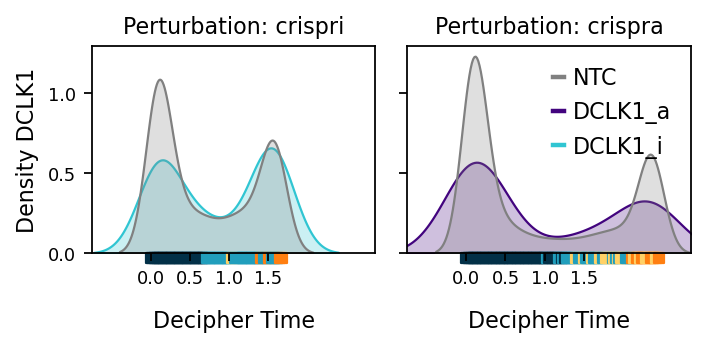

2026-02-13 18:44:13,694 | INFO : maxp pruned
2026-02-13 18:44:13,698 | INFO : cmap pruned
2026-02-13 18:44:13,698 | INFO : kern dropped
2026-02-13 18:44:13,698 | INFO : post pruned
2026-02-13 18:44:13,698 | INFO : FFTM dropped
2026-02-13 18:44:13,699 | INFO : GPOS pruned
2026-02-13 18:44:13,700 | INFO : GSUB pruned


Added crispri_class to axes[0] for crispri
Added crispra_class to axes[1] for crispra


2026-02-13 18:44:14,003 | INFO : glyf pruned
2026-02-13 18:44:14,004 | INFO : Added gid0 to subset
2026-02-13 18:44:14,004 | INFO : Added first four glyphs to subset
2026-02-13 18:44:14,005 | INFO : Closing glyph list over 'GSUB': 35 glyphs before
2026-02-13 18:44:14,005 | INFO : Glyph names: ['.notdef', '.null', 'C', 'D', 'G', 'K', 'N', 'P', 'S', 'T', 'a', 'b', 'c', 'colon', 'e', 'five', 'four', 'h', 'i', 'm', 'n', 'nine', 'nonmarkingreturn', 'o', 'one', 'p', 'period', 'r', 's', 'space', 't', 'u', 'underscore', 'y', 'zero']
2026-02-13 18:44:14,005 | INFO : Glyph IDs:   [0, 1, 2, 3, 17, 19, 20, 23, 24, 28, 29, 38, 39, 42, 46, 49, 51, 54, 55, 66, 68, 69, 70, 72, 75, 76, 80, 81, 82, 83, 85, 86, 87, 88, 92]
2026-02-13 18:44:14,006 | INFO : Closed glyph list over 'GSUB': 35 glyphs after
2026-02-13 18:44:14,007 | INFO : Glyph names: ['.notdef', '.null', 'C', 'D', 'G', 'K', 'N', 'P', 'S', 'T', 'a', 'b', 'c', 'colon', 'e', 'five', 'four', 'h', 'i', 'm', 'n', 'nine', 'nonmarkingreturn', 'o', '

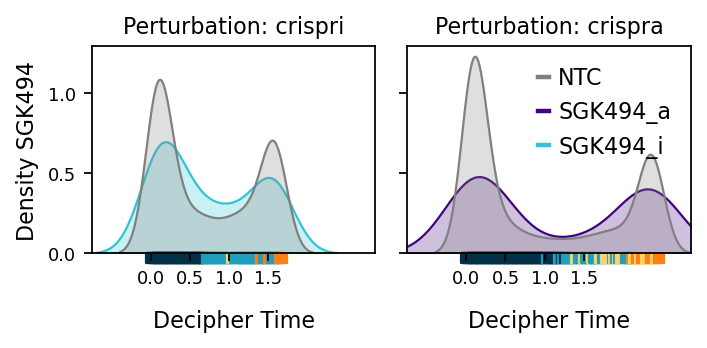

2026-02-13 18:44:14,272 | INFO : maxp pruned
2026-02-13 18:44:14,276 | INFO : cmap pruned
2026-02-13 18:44:14,276 | INFO : kern dropped
2026-02-13 18:44:14,277 | INFO : post pruned
2026-02-13 18:44:14,277 | INFO : FFTM dropped
2026-02-13 18:44:14,277 | INFO : GPOS pruned
2026-02-13 18:44:14,279 | INFO : GSUB pruned
2026-02-13 18:44:14,282 | INFO : glyf pruned
2026-02-13 18:44:14,282 | INFO : Added gid0 to subset
2026-02-13 18:44:14,282 | INFO : Added first four glyphs to subset
2026-02-13 18:44:14,282 | INFO : Closing glyph list over 'GSUB': 33 glyphs before
2026-02-13 18:44:14,283 | INFO : Glyph names: ['.notdef', '.null', 'C', 'D', 'N', 'O', 'P', 'R', 'T', 'a', 'b', 'c', 'colon', 'e', 'five', 'h', 'i', 'm', 'n', 'nonmarkingreturn', 'o', 'one', 'p', 'period', 'r', 's', 'space', 't', 'two', 'u', 'underscore', 'y', 'zero']
2026-02-13 18:44:14,283 | INFO : Glyph IDs:   [0, 1, 2, 3, 17, 19, 20, 21, 24, 29, 38, 39, 49, 50, 51, 53, 55, 66, 68, 69, 70, 72, 75, 76, 80, 81, 82, 83, 85, 86, 87,

Added crispri_class to axes[0] for crispri
Added crispra_class to axes[1] for crispra


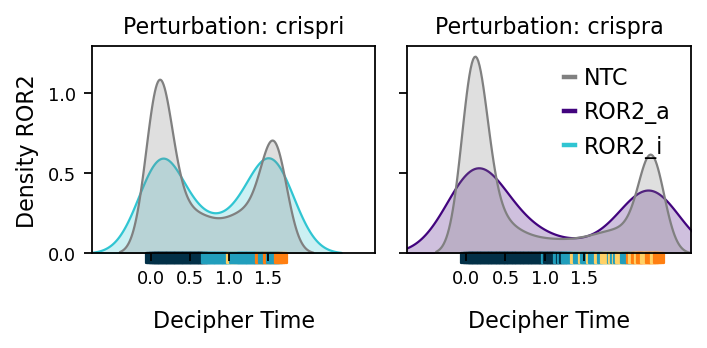

2026-02-13 18:44:14,591 | INFO : maxp pruned
2026-02-13 18:44:14,595 | INFO : cmap pruned
2026-02-13 18:44:14,595 | INFO : kern dropped
2026-02-13 18:44:14,595 | INFO : post pruned
2026-02-13 18:44:14,595 | INFO : FFTM dropped
2026-02-13 18:44:14,596 | INFO : GPOS pruned
2026-02-13 18:44:14,597 | INFO : GSUB pruned
2026-02-13 18:44:14,600 | INFO : glyf pruned
2026-02-13 18:44:14,600 | INFO : Added gid0 to subset
2026-02-13 18:44:14,600 | INFO : Added first four glyphs to subset
2026-02-13 18:44:14,600 | INFO : Closing glyph list over 'GSUB': 34 glyphs before
2026-02-13 18:44:14,600 | INFO : Glyph names: ['.notdef', '.null', 'A', 'B', 'C', 'D', 'N', 'P', 'T', 'a', 'b', 'c', 'colon', 'e', 'five', 'four', 'h', 'i', 'm', 'n', 'nonmarkingreturn', 'o', 'one', 'p', 'period', 'r', 's', 'space', 't', 'two', 'u', 'underscore', 'y', 'zero']
2026-02-13 18:44:14,601 | INFO : Glyph IDs:   [0, 1, 2, 3, 17, 19, 20, 21, 23, 24, 29, 36, 37, 38, 39, 49, 51, 55, 66, 68, 69, 70, 72, 75, 76, 80, 81, 82, 83,

Added crispri_class to axes[0] for crispri
Added crispra_class to axes[1] for crispra


2026-02-13 18:44:14,620 | INFO : name pruned


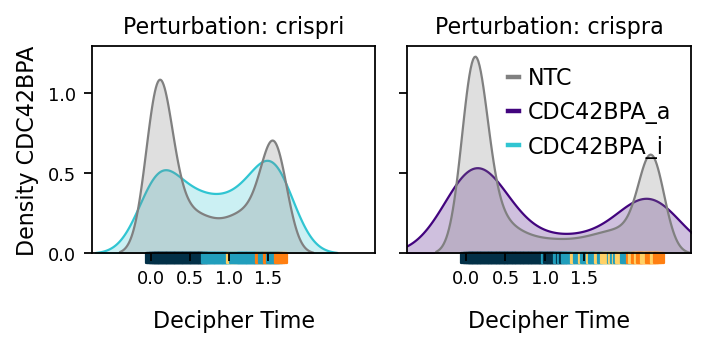

2026-02-13 18:44:14,875 | INFO : maxp pruned
2026-02-13 18:44:14,879 | INFO : cmap pruned
2026-02-13 18:44:14,879 | INFO : kern dropped
2026-02-13 18:44:14,879 | INFO : post pruned
2026-02-13 18:44:14,879 | INFO : FFTM dropped
2026-02-13 18:44:14,880 | INFO : GPOS pruned
2026-02-13 18:44:14,881 | INFO : GSUB pruned
2026-02-13 18:44:14,884 | INFO : glyf pruned
2026-02-13 18:44:14,885 | INFO : Added gid0 to subset
2026-02-13 18:44:14,885 | INFO : Added first four glyphs to subset
2026-02-13 18:44:14,885 | INFO : Closing glyph list over 'GSUB': 33 glyphs before
2026-02-13 18:44:14,885 | INFO : Glyph names: ['.notdef', '.null', 'C', 'D', 'K', 'N', 'P', 'S', 'T', 'Y', 'a', 'b', 'c', 'colon', 'e', 'five', 'h', 'i', 'm', 'n', 'nonmarkingreturn', 'o', 'one', 'p', 'period', 'r', 's', 'space', 't', 'u', 'underscore', 'y', 'zero']
2026-02-13 18:44:14,886 | INFO : Glyph IDs:   [0, 1, 2, 3, 17, 19, 20, 24, 29, 38, 39, 46, 49, 51, 54, 55, 60, 66, 68, 69, 70, 72, 75, 76, 80, 81, 82, 83, 85, 86, 87, 8

Added crispri_class to axes[0] for crispri
Added crispra_class to axes[1] for crispra


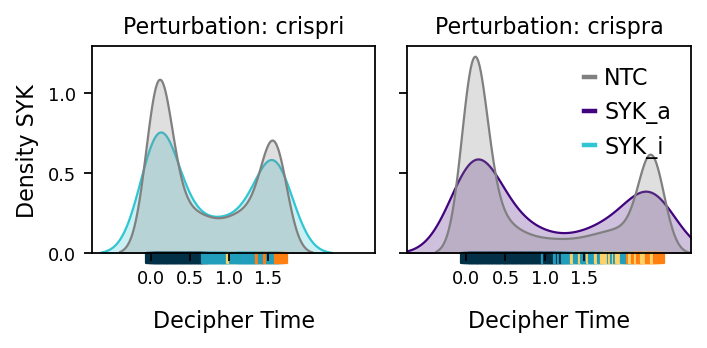

2026-02-13 18:44:15,141 | INFO : maxp pruned
2026-02-13 18:44:15,145 | INFO : cmap pruned
2026-02-13 18:44:15,145 | INFO : kern dropped
2026-02-13 18:44:15,146 | INFO : post pruned
2026-02-13 18:44:15,146 | INFO : FFTM dropped
2026-02-13 18:44:15,146 | INFO : GPOS pruned
2026-02-13 18:44:15,148 | INFO : GSUB pruned
2026-02-13 18:44:15,150 | INFO : glyf pruned
2026-02-13 18:44:15,151 | INFO : Added gid0 to subset
2026-02-13 18:44:15,151 | INFO : Added first four glyphs to subset
2026-02-13 18:44:15,151 | INFO : Closing glyph list over 'GSUB': 34 glyphs before
2026-02-13 18:44:15,151 | INFO : Glyph names: ['.notdef', '.null', 'C', 'D', 'I', 'K', 'N', 'O', 'P', 'R', 'T', 'a', 'b', 'c', 'colon', 'e', 'five', 'h', 'i', 'm', 'n', 'nonmarkingreturn', 'o', 'one', 'p', 'period', 'r', 's', 'space', 't', 'u', 'underscore', 'y', 'zero']
2026-02-13 18:44:15,152 | INFO : Glyph IDs:   [0, 1, 2, 3, 17, 19, 20, 24, 29, 38, 39, 44, 46, 49, 50, 51, 53, 55, 66, 68, 69, 70, 72, 75, 76, 80, 81, 82, 83, 85, 

Added crispri_class to axes[0] for crispri
Added crispra_class to axes[1] for crispra


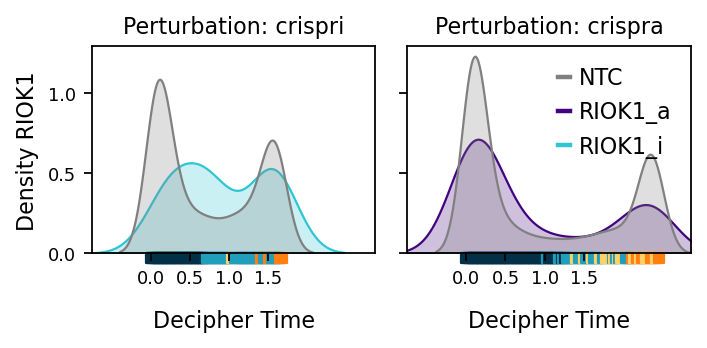

2026-02-13 18:44:15,411 | INFO : maxp pruned
2026-02-13 18:44:15,415 | INFO : cmap pruned
2026-02-13 18:44:15,415 | INFO : kern dropped
2026-02-13 18:44:15,415 | INFO : post pruned
2026-02-13 18:44:15,415 | INFO : FFTM dropped
2026-02-13 18:44:15,417 | INFO : GPOS pruned
2026-02-13 18:44:15,418 | INFO : GSUB pruned
2026-02-13 18:44:15,421 | INFO : glyf pruned
2026-02-13 18:44:15,421 | INFO : Added gid0 to subset
2026-02-13 18:44:15,421 | INFO : Added first four glyphs to subset
2026-02-13 18:44:15,421 | INFO : Closing glyph list over 'GSUB': 33 glyphs before
2026-02-13 18:44:15,421 | INFO : Glyph names: ['.notdef', '.null', 'C', 'D', 'K', 'N', 'P', 'S', 'T', 'a', 'b', 'c', 'colon', 'e', 'five', 'h', 'i', 'm', 'n', 'nonmarkingreturn', 'o', 'one', 'p', 'period', 'r', 's', 'space', 't', 'three', 'u', 'underscore', 'y', 'zero']
2026-02-13 18:44:15,422 | INFO : Glyph IDs:   [0, 1, 2, 3, 17, 19, 20, 22, 24, 29, 38, 39, 46, 49, 51, 54, 55, 66, 68, 69, 70, 72, 75, 76, 80, 81, 82, 83, 85, 86, 8

Added crispri_class to axes[0] for crispri
Added crispra_class to axes[1] for crispra


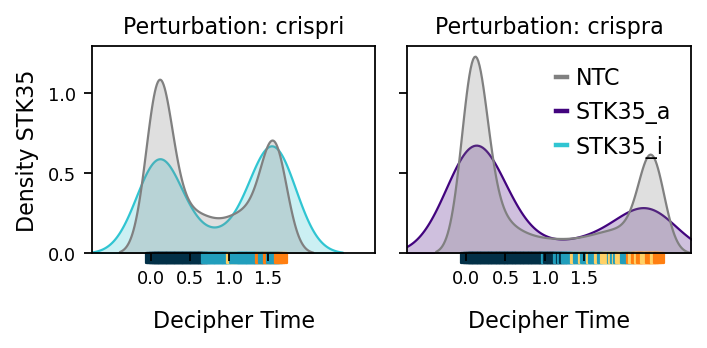

2026-02-13 18:44:15,681 | INFO : maxp pruned
2026-02-13 18:44:15,684 | INFO : cmap pruned
2026-02-13 18:44:15,685 | INFO : kern dropped
2026-02-13 18:44:15,685 | INFO : post pruned
2026-02-13 18:44:15,685 | INFO : FFTM dropped
2026-02-13 18:44:15,686 | INFO : GPOS pruned
2026-02-13 18:44:15,687 | INFO : GSUB pruned
2026-02-13 18:44:15,690 | INFO : glyf pruned
2026-02-13 18:44:15,691 | INFO : Added gid0 to subset
2026-02-13 18:44:15,691 | INFO : Added first four glyphs to subset
2026-02-13 18:44:15,691 | INFO : Closing glyph list over 'GSUB': 33 glyphs before
2026-02-13 18:44:15,691 | INFO : Glyph names: ['.notdef', '.null', 'A', 'C', 'D', 'K', 'M', 'N', 'P', 'T', 'a', 'b', 'c', 'colon', 'e', 'five', 'h', 'i', 'm', 'n', 'nonmarkingreturn', 'o', 'one', 'p', 'period', 'r', 's', 'space', 't', 'u', 'underscore', 'y', 'zero']
2026-02-13 18:44:15,692 | INFO : Glyph IDs:   [0, 1, 2, 3, 17, 19, 20, 24, 29, 36, 38, 39, 46, 48, 49, 51, 55, 66, 68, 69, 70, 72, 75, 76, 80, 81, 82, 83, 85, 86, 87, 8

Added crispri_class to axes[0] for crispri
Added crispra_class to axes[1] for crispra


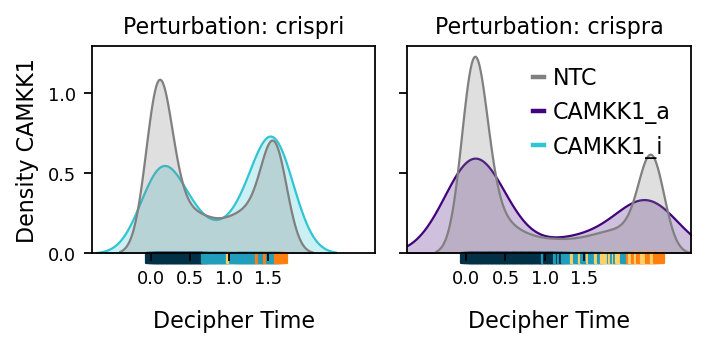

2026-02-13 18:44:15,960 | INFO : maxp pruned
2026-02-13 18:44:15,964 | INFO : cmap pruned
2026-02-13 18:44:15,964 | INFO : kern dropped
2026-02-13 18:44:15,964 | INFO : post pruned
2026-02-13 18:44:15,964 | INFO : FFTM dropped
2026-02-13 18:44:15,965 | INFO : GPOS pruned
2026-02-13 18:44:15,966 | INFO : GSUB pruned
2026-02-13 18:44:15,969 | INFO : glyf pruned
2026-02-13 18:44:15,970 | INFO : Added gid0 to subset
2026-02-13 18:44:15,970 | INFO : Added first four glyphs to subset
2026-02-13 18:44:15,970 | INFO : Closing glyph list over 'GSUB': 34 glyphs before
2026-02-13 18:44:15,970 | INFO : Glyph names: ['.notdef', '.null', 'A', 'C', 'D', 'F', 'G', 'N', 'P', 'R', 'T', 'a', 'b', 'c', 'colon', 'e', 'five', 'h', 'i', 'm', 'n', 'nonmarkingreturn', 'o', 'one', 'p', 'period', 'r', 's', 'space', 't', 'u', 'underscore', 'y', 'zero']
2026-02-13 18:44:15,971 | INFO : Glyph IDs:   [0, 1, 2, 3, 17, 19, 20, 24, 29, 36, 38, 39, 41, 42, 49, 51, 53, 55, 66, 68, 69, 70, 72, 75, 76, 80, 81, 82, 83, 85, 

Added crispri_class to axes[0] for crispri
Added crispra_class to axes[1] for crispra


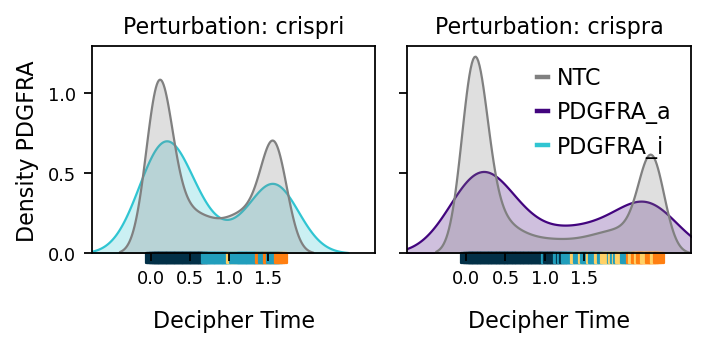

2026-02-13 18:44:16,244 | INFO : maxp pruned
2026-02-13 18:44:16,247 | INFO : cmap pruned
2026-02-13 18:44:16,248 | INFO : kern dropped
2026-02-13 18:44:16,248 | INFO : post pruned
2026-02-13 18:44:16,248 | INFO : FFTM dropped
2026-02-13 18:44:16,250 | INFO : GPOS pruned
2026-02-13 18:44:16,251 | INFO : GSUB pruned
2026-02-13 18:44:16,253 | INFO : glyf pruned
2026-02-13 18:44:16,254 | INFO : Added gid0 to subset
2026-02-13 18:44:16,254 | INFO : Added first four glyphs to subset
2026-02-13 18:44:16,255 | INFO : Closing glyph list over 'GSUB': 33 glyphs before
2026-02-13 18:44:16,255 | INFO : Glyph names: ['.notdef', '.null', 'C', 'D', 'K', 'N', 'P', 'R', 'T', 'a', 'b', 'c', 'colon', 'e', 'five', 'h', 'i', 'm', 'n', 'nonmarkingreturn', 'o', 'one', 'p', 'period', 'r', 's', 'space', 't', 'three', 'u', 'underscore', 'y', 'zero']
2026-02-13 18:44:16,255 | INFO : Glyph IDs:   [0, 1, 2, 3, 17, 19, 20, 22, 24, 29, 38, 39, 46, 49, 51, 53, 55, 66, 68, 69, 70, 72, 75, 76, 80, 81, 82, 83, 85, 86, 8

Added crispri_class to axes[0] for crispri
Added crispra_class to axes[1] for crispra


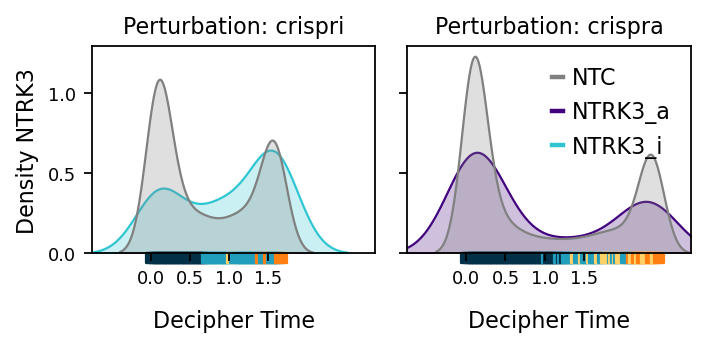

In [63]:
for guide in combined_genes_list:
    # Filter for NTC and current guide
    data_filtered = data[data['gene_id'].isin(['NTC', guide])]
    
    # Get unique perturbations
    perturbations = data_filtered['perturbation'].unique()
    
    # Define consistent color palette: NTC is always gray, guide gets a specific color
    # Only include colors for the genes that are actually in the filtered data
    guide_colors_i = ['gray', crispr_colors['crispri']] # NTC will be first, guide will be second
    guide_colors_a = ['gray', crispr_colors['crispra']]
    # Create a figure with two subplots side by side
    fig, axes = plt.subplots(1, len(perturbations), figsize=(4.5, 2.25), sharey=True)
    
    # Handle case where there's only one perturbation (axes won't be a list)
    if len(perturbations) == 1:
        axes = [axes]
    
    axes[0].set_ylabel(f'Density {guide}', fontsize=10)
    
    # Loop through perturbations and create a subplot for each
    for a, pert in enumerate(perturbations):
        
        # Filter data for this perturbation
        pert_data = data_filtered[data_filtered['perturbation'] == pert]
        
        if pert == 'crispri':
        # Plot on the corresponding axis with custom colors
            sns.kdeplot(
                data=pert_data,
                x="decipher_time",
                hue='gene_id',
                fill=True,
                common_norm=False,
                legend=False,  # We'll add custom legend later
                palette=guide_colors_i,
                hue_order=['NTC', guide],  # Ensure consistent order
                ax=axes[a]
            )
        elif pert == 'crispra':
            sns.kdeplot(
                data=pert_data,
                x="decipher_time",
                hue='gene_id',
                fill=True,
                common_norm=False,
                legend=False,  # We'll add custom legend later
                palette=guide_colors_a,
                hue_order=['NTC', guide],  # Ensure consistent order
                ax=axes[a]
            )
        axes[a].set_title(f'Perturbation: {pert}')
        axes[a].set_xlim(-0.75, np.max(adata_concat.obs['decipher_time'])+0.5)
        axes[a].set_xticks([0, 0.5, 1, 1.5])
        axes[a].set_xlabel('Decipher Time', fontsize=10)
        
        # Add cell type bands based on perturbation type
        if pert == 'crispri':
            add_cell_type_band(adata_concat, 'crispri_class', "treatment", axes[a], color_palette, offset=1)
            print(f"Added crispri_class to axes[{a}] for {pert}")
        elif pert == 'crispra':
            add_cell_type_band(adata_concat, 'crispra_class', "treatment", axes[a], color_palette, offset=1)
            print(f"Added crispra_class to axes[{a}] for {pert}")
    
    # Add legend to the last subplot
    
    legend_elements = [
        plt.Line2D([0], [0], color='gray', lw=2, label='NTC'),
        plt.Line2D([0], [0], color=crispr_colors['crispra'], lw=2, label=f'{guide}_a'),
        plt.Line2D([0], [0], color=crispr_colors['crispri'], lw=2, label=f'{guide}_i')
        
    ]
    axes[-1].legend(handles=legend_elements, loc='upper right', frameon = False, fontsize=10)
    
    # Adjust layout
    plt.tight_layout()
    
    # Save figures
    plt.savefig(f'{figures_dir}/traj_displot_crispriasplit_{guide}.png', dpi=300)
    plt.savefig(f'{figures_dir}/traj_displot_crispriasplit_{guide}.pdf', dpi=300)
    plt.savefig(f'{figures_dir}/traj_displot_crispriasplit_{guide}.svg', dpi=300)
    
    # Show plot
    plt.show()